# Creating Images with AI: CIFAR-10 Diffusion Model

## Introduction
In this assignment, you'll learn how to create an AI model that can generate realistic CIFAR-10 images from scratch using diffusion models. We'll be working with colorful 32x32 images of objects like airplanes, cars, birds, and more.

### What We'll Build
- A diffusion model capable of generating realistic CIFAR-10 images
- Visual demonstrations of how random noise gradually transforms into clear, recognizable objects
- By the end, your AI should create images realistic enough for another AI to recognize them

### CIFAR-10 Dataset
- Content: 10 classes of real-world objects
- Classes: airplane, automobile, bird, cat, deer, dog, frog, horse, ship, truck
- Image size: 32x32 pixels, Color (RGB)
- Training samples: 50,000
- Memory needed: ~4GB GPU
- Training time: ~1-2 hours on Colab

### Before You Start
1. Make sure you're running this in Google Colab with GPU access
2. Go to 'Runtime' → 'Change runtime type' and select 'GPU' as your hardware accelerator
3. Each code cell has comments explaining what it does
4. Don't worry if you don't understand every detail - focus on the big picture!


## Step 1: Setting Up Our Tools
First, let's install and import all the tools we need. Run this cell and wait for it to complete.

In [ ]:
# Step 1: Install required packages
%pip install einops
print("Package installation complete.")

# Step 2: Import libraries
# --- Core PyTorch libraries ---
import torch
import torch.nn.functional as F
import torch.nn as nn
from torch.optim import Adam

# --- Data handling ---
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms

# --- Tensor manipulation ---
import random
from einops.layers.torch import Rearrange
from einops import rearrange
import numpy as np

# --- System utilities ---
import os

# --- Visualization tools ---
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.utils import save_image, make_grid

# Step 3: Set up device (GPU or CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"We'll be using: {device}")

# Check if we're actually using GPU
if device.type == "cuda":
    print(f"GPU name: {torch.cuda.get_device_name(0)}")
    print(f"GPU memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
else:
    print("Note: Training will be much slower on CPU. Consider using Google Colab with GPU enabled.")

Package installation complete.
We'll be using: cuda
GPU name: NVIDIA A100-SXM4-40GB
GPU memory: 42.47 GB


### REPRODUCIBILITY AND DEVICE SETUP

In [ ]:
# Step 4: Set random seeds for reproducibility
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

print(f"Random seeds set to {SEED} for reproducible results")

# Configure CUDA for GPU operations if available
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

    # Ensure deterministic GPU operations
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    try:
        # Check available GPU memory
        gpu_memory = torch.cuda.get_device_properties(0).total_memory / 1e9
        print(f"Available GPU Memory: {gpu_memory:.1f} GB")

        # Add recommendation based on memory
        if gpu_memory < 4:
            print("Warning: Low GPU memory for CIFAR-10. Consider reducing batch size if you encounter OOM errors.")
    except Exception as e:
        print(f"Could not check GPU memory: {e}")
else:
    print("No GPU detected. Training will be much slower on CPU.")
    print("If you're using Colab, go to Runtime > Change runtime type and select GPU.")

Random seeds set to 42 for reproducible results
Available GPU Memory: 42.5 GB


## Step 2: CIFAR-10 Dataset Setup

We'll be using the CIFAR-10 dataset which contains 60,000 32x32 color images in 10 different classes.

In [ ]:
#===============================================================================
# CIFAR-10 DATASET CONFIGURATION
#===============================================================================

IMG_SIZE = 32
IMG_CH = 3
N_CLASSES = 10
BATCH_SIZE = 32  # Reduced batch size for memory
EPOCHS = 50      # More epochs for complex data

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Load CIFAR-10 dataset
dataset = torchvision.datasets.CIFAR10(
    root='./data',
    train=True,
    transform=transform,
    download=True
)

print("✓ CIFAR-10 dataset loaded successfully!")
print(f"Dataset size: {len(dataset)}")
print(f"Number of classes: {N_CLASSES}")
print(f"Image shape: {IMG_CH} channels, {IMG_SIZE}x{IMG_SIZE} pixels")
print("CIFAR-10 classes: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']")

100%|██████████| 170M/170M [03:21<00:00, 844kB/s] 


✓ CIFAR-10 dataset loaded successfully!
Dataset size: 50000
Number of classes: 10
Image shape: 3 channels, 32x32 pixels
CIFAR-10 classes: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


In [ ]:
# Validating Dataset Selection and GPU Memory
if 'dataset' not in locals():
    raise ValueError("Dataset not loaded properly!")

# Check GPU memory requirements
if torch.cuda.is_available():
    gpu_memory = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"Available GPU Memory: {gpu_memory:.1f} GB")

    # CIFAR-10 specific memory check
    required_memory = 4.0
    if gpu_memory < required_memory:
        print(f"⚠️ Warning: CIFAR-10 typically requires ~{required_memory}GB GPU memory")
        print("Current batch size: 32 - consider reducing to 16 if you encounter memory errors")
    else:
        print("✓ GPU memory should be sufficient for CIFAR-10 training")
else:
    print("No GPU detected - training CIFAR-10 will be very slow on CPU!")

Available GPU Memory: 42.5 GB
✓ GPU memory should be sufficient for CIFAR-10 training


CIFAR-10 Dataset sample properties:
Batch shape: torch.Size([8, 3, 32, 32])
Data type: torch.float32
Value range: [-1.000, 1.000]
Sample labels: [6, 0, 4, 1, 2, 7, 9, 4]
Sample image classes: ['frog', 'airplane', 'deer', 'automobile', 'bird', 'horse', 'truck', 'deer']


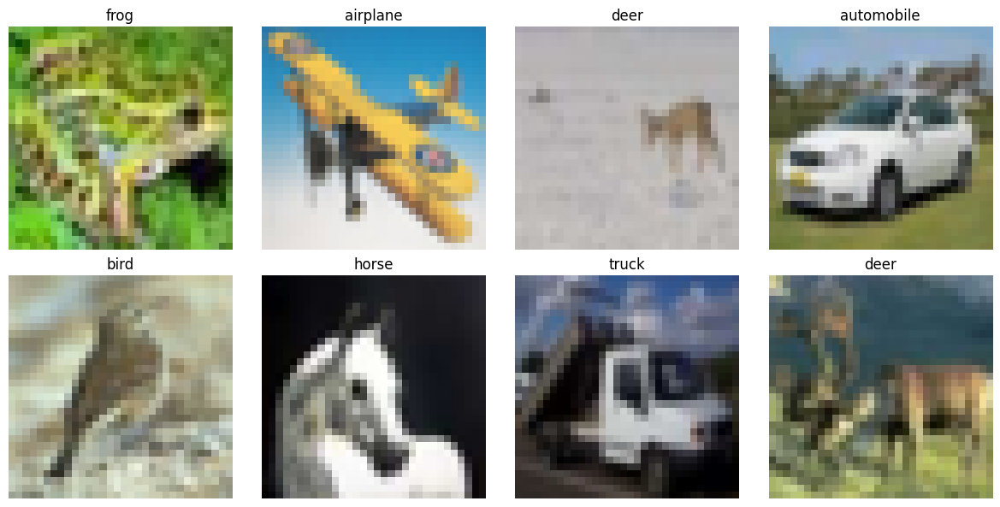

In [ ]:
# Dataset Properties and Data Loaders
# Examine our CIFAR-10 dataset and set up the data loaders

# Check sample batch properties
sample_loader = DataLoader(dataset, batch_size=8, shuffle=True)
sample_batch = next(iter(sample_loader))
images, labels = sample_batch

print("CIFAR-10 Dataset sample properties:")
print(f"Batch shape: {images.shape}")  # Should be [8, 3, 32, 32]
print(f"Data type: {images.dtype}")
print(f"Value range: [{images.min().item():.3f}, {images.max().item():.3f}]")
print(f"Sample labels: {labels.tolist()}")

# Show sample images
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
print("Sample image classes:", [class_names[label] for label in labels])

# Display sample images
plt.figure(figsize=(12, 6))
for i in range(8):
    plt.subplot(2, 4, i+1)
    # CIFAR-10 images are RGB, need to permute and denormalize for display
    img = images[i].permute(1, 2, 0).cpu()
    img = (img * 0.5) + 0.5  # Denormalize from [-1,1] to [0,1]
    plt.imshow(img)
    plt.title(f'{class_names[labels[i]]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
#===============================================================================
# DATASET SPLITTING AND DATALOADER CONFIGURATION
#===============================================================================
# Create train-validation split (80% train, 20% validation)

train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = torch.utils.data.random_split(
    dataset,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(SEED)
)

print(f"Training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")

# Create dataloaders for training and validation
train_dataloader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_dataloader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print("✓ CIFAR-10 DataLoaders created successfully!")

Training samples: 40000
Validation samples: 10000
✓ CIFAR-10 DataLoaders created successfully!


## Step 3: Building Our Model Components

Now we'll create the building blocks of our AI model for CIFAR-10 images.

In [ ]:
# Basic building block that processes images
class GELUConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch, group_size):
        super().__init__()

        # Check that group_size is compatible with out_ch
        if out_ch % group_size != 0:
            print(f"Warning: out_ch ({out_ch}) is not divisible by group_size ({group_size})")
            # Adjust group_size to be compatible
            group_size = min(group_size, out_ch)
            while out_ch % group_size != 0:
                group_size -= 1
            print(f"Adjusted group_size to {group_size}")

        # Create layers for the block
        self.model = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
            nn.GroupNorm(group_size, out_ch),
            nn.GELU()
        )

    def forward(self, x):
        return self.model(x)

In [ ]:
# Rearranges pixels to downsample the image (2x reduction in spatial dimensions)
class RearrangePoolBlock(nn.Module):
    def __init__(self, in_chs, group_size):
        super().__init__()

        # Create the rearrange operation and convolution
        self.rearrange = Rearrange('b c (h p1) (w p2) -> b (c p1 p2) h w', p1=2, p2=2)
        self.conv = GELUConvBlock(in_chs * 4, in_chs, group_size)

    def forward(self, x):
        # Apply rearrange to downsample, then apply convolution
        x = self.rearrange(x)  # [B, C, H, W] -> [B, C*4, H/2, W/2]
        x = self.conv(x)       # [B, C*4, H/2, W/2] -> [B, C, H/2, W/2]
        return x

In [ ]:
# Downsampling block for encoding path in U-Net architecture
class DownBlock(nn.Module):
    def __init__(self, in_chs, out_chs, group_size):
        super().__init__()

        # Sequential processing of features
        layers = [
            GELUConvBlock(in_chs, out_chs, group_size),
            GELUConvBlock(out_chs, out_chs, group_size),
            RearrangePoolBlock(out_chs, group_size)
        ]
        self.model = nn.Sequential(*layers)

        # Log the configuration for debugging
        print(f"Created DownBlock: in_chs={in_chs}, out_chs={out_chs}, spatial_reduction=2x")

    def forward(self, x):
        return self.model(x)

In [ ]:
# Upsampling block for decoding path in U-Net architecture
class UpBlock(nn.Module):
    def __init__(self, in_chs, out_chs, skip_chs, group_size):
        super().__init__()

        # Upsampling operation
        self.upsample = nn.ConvTranspose2d(
            in_chs, in_chs,
            kernel_size=2,
            stride=2
        )

        # Convolutional blocks - input channels are sum of upsampled and skip channels
        self.conv_blocks = nn.Sequential(
            GELUConvBlock(in_chs + skip_chs, out_chs, group_size),
            GELUConvBlock(out_chs, out_chs, group_size)
        )

        # Log the configuration for debugging
        print(f"Created UpBlock: in_chs={in_chs}, out_chs={out_chs}, skip_chs={skip_chs}, spatial_increase=2x")

    def forward(self, x, skip):
        # Concatenate x and skip, then upsample and process
        x = self.upsample(x)                    # Upsample
        x = torch.cat([x, skip], dim=1)         # Concatenate with skip connection
        x = self.conv_blocks(x)                 # Process through conv blocks
        return x

In [ ]:
# Time embedding block for our U-Net architecture
class SinusoidalPositionEmbedBlock(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = torch.log(torch.tensor(10000.0, device=device)) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

In [ ]:
# Class conditioning embedding block
class EmbedBlock(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedBlock, self).__init__()
        self.input_dim = input_dim

        # Create the embedding layers
        self.model = nn.Sequential(
            nn.Linear(input_dim, emb_dim),
            nn.GELU(),
            nn.Linear(emb_dim, emb_dim),
            nn.Unflatten(1, (emb_dim, 1, 1))  # Reshape for feature map broadcasting
        )

    def forward(self, x):
        x = x.view(-1, self.input_dim)
        return self.model(x)

In [ ]:
# Simple fix: Ensure embedding dimensions match final feature dimension
class UNet(nn.Module):
    def __init__(self, T, img_ch, img_size, down_chs, t_embed_dim, c_embed_dim):
        super().__init__()

        # Use the final channel dimension for embeddings
        final_channels = down_chs[-1]

        # Time embedding - project to final feature dimension
        self.time_embed = nn.Sequential(
            SinusoidalPositionEmbedBlock(t_embed_dim),
            nn.Linear(t_embed_dim, final_channels),
            nn.GELU(),
            nn.Linear(final_channels, final_channels)
        )

        # Class embedding - project to final feature dimension
        self.class_embed = EmbedBlock(c_embed_dim, final_channels)

        # Rest of the architecture remains the same
        self.initial_conv = GELUConvBlock(img_ch, down_chs[0], group_size=8)

        self.down_blocks = nn.ModuleList()
        in_chs = down_chs[0]
        for out_chs in down_chs[1:]:
            self.down_blocks.append(DownBlock(in_chs, out_chs, group_size=8))
            in_chs = out_chs

        self.middle_blocks = nn.Sequential(
            GELUConvBlock(down_chs[-1], down_chs[-1], group_size=8),
            GELUConvBlock(down_chs[-1], down_chs[-1], group_size=8)
        )

        self.up_blocks = nn.ModuleList()
        # Iterate backwards through down_chs to get corresponding skip connections
        for i in range(len(down_chs) - 1, 0, -1):
            in_chs = down_chs[i] # Input channels to the upsample (output of middle or previous upblock)
            out_chs = down_chs[i-1] # Output channels of the upblock
            skip_chs = down_chs[i-1] # Channels from the skip connection
            print(f"Initializing UpBlock {len(down_chs) - 1 - i}: in_chs={in_chs}, out_chs={out_chs}, skip_chs={skip_chs}") # Debug print
            self.up_blocks.append(UpBlock(in_chs, out_chs, skip_chs, group_size=8))

        self.final_conv = nn.Conv2d(down_chs[0], img_ch, kernel_size=1)

    def forward(self, x, t, c, c_mask):
        # Get embeddings with correct dimension
        t_emb = self.time_embed(t).unsqueeze(-1).unsqueeze(-1)
        c_emb = self.class_embed(c)

        # Forward pass through the network
        x = self.initial_conv(x)

        skips = [x]
        for down_block in self.down_blocks:
            x = down_block(x)
            skips.append(x)

        x = self.middle_blocks(x)

        # Now both embeddings have the same dimension as x
        x = x + t_emb + c_emb

        # Use the skips in reverse order
        for i, up_block in enumerate(self.up_blocks):
            skip = skips[len(skips) - 2 - i] # Select the correct skip connection
            x = up_block(x, skip)

        x = self.final_conv(x)

        return x

## Step 4: Setting Up The Diffusion Process

Now we'll create the process of adding and removing noise from CIFAR-10 images.

In [ ]:
# Set up the noise schedule
n_steps = 100  # How many steps to go from clear image to noise
beta_start = 0.0001  # Starting noise level (small)
beta_end = 0.02      # Ending noise level (larger)

# Create schedule of gradually increasing noise levels
beta = torch.linspace(beta_start, beta_end, n_steps).to(device)

# Calculate important values used in diffusion equations
alpha = 1 - beta  # Portion of original image to keep at each step
alpha_bar = torch.cumprod(alpha, dim=0)  # Cumulative product of alphas
sqrt_alpha_bar = torch.sqrt(alpha_bar)  # For scaling the original image
sqrt_one_minus_alpha_bar = torch.sqrt(1 - alpha_bar)  # For scaling the noise

print("Noise schedule created:")
print(f"Steps: {n_steps}")
print(f"Beta range: [{beta_start}, {beta_end}]")
print(f"Alpha range: [{alpha[0]:.4f}, {alpha[-1]:.4f}]")

Noise schedule created:
Steps: 100
Beta range: [0.0001, 0.02]
Alpha range: [0.9999, 0.9800]


In [ ]:
# Function to add noise to images (forward diffusion process)
def add_noise(x_0, t):
    # Create random Gaussian noise with same shape as image
    noise = torch.randn_like(x_0)

    # Get noise schedule values for the specified timesteps
    sqrt_alpha_bar_t = sqrt_alpha_bar[t].reshape(-1, 1, 1, 1)
    sqrt_one_minus_alpha_bar_t = sqrt_one_minus_alpha_bar[t].reshape(-1, 1, 1, 1)

    # Apply the forward diffusion equation:
    x_t = sqrt_alpha_bar_t * x_0 + sqrt_one_minus_alpha_bar_t * noise

    return x_t, noise

In [ ]:
# Function to remove noise from images (reverse diffusion process)
@torch.no_grad()  # Don't track gradients during sampling (inference only)
def remove_noise(x_t, t, model, c, c_mask):
    # Predict the noise in the image using our model
    predicted_noise = model(x_t, t, c, c_mask)

    # Get noise schedule values for the current timestep
    alpha_t = alpha[t].reshape(-1, 1, 1, 1)
    alpha_bar_t = alpha_bar[t].reshape(-1, 1, 1, 1)
    beta_t = beta[t].reshape(-1, 1, 1, 1)
    sqrt_one_minus_alpha_bar_t = sqrt_one_minus_alpha_bar[t].reshape(-1, 1, 1, 1) # Ensure this is defined

    # Special case: if we're at the first timestep (t=0), we're done
    if t[0] == 0:
        return x_t
    else:
        # Calculate the mean of the denoised distribution
        mean = (1 / torch.sqrt(alpha_t)) * (
            x_t - (beta_t / sqrt_one_minus_alpha_bar_t) * predicted_noise
        )

        # Add a small amount of random noise
        noise = torch.randn_like(x_t)

        # Return the partially denoised image with a bit of new random noise
        return mean + torch.sqrt(beta_t) * noise

Noise progression example:


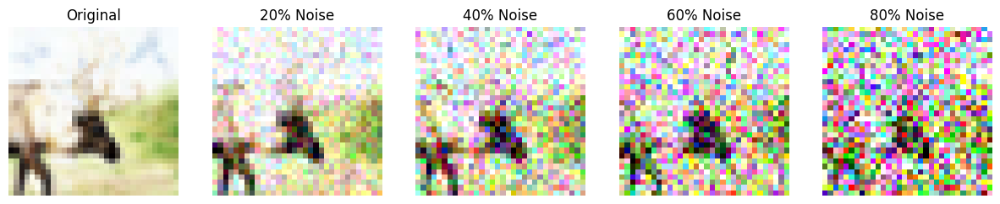

In [ ]:
# Visualization function to show how noise progressively affects CIFAR-10 images
def show_noise_progression(image, num_steps=5):
    plt.figure(figsize=(15, 3))

    # Show original image
    plt.subplot(1, num_steps, 1)
    img = image.permute(1, 2, 0).cpu()
    if img.min() < 0:  # If normalized between -1 and 1
        img = (img + 1) / 2  # Rescale to [0,1] for display
    plt.imshow(img)
    plt.title('Original')
    plt.axis('off')

    # Show progressively noisier versions
    for i in range(1, num_steps):
        # Calculate timestep index based on percentage through the process
        t_idx = int((i/num_steps) * n_steps)
        t = torch.tensor([t_idx]).to(device)

        # Add noise corresponding to timestep t
        noisy_image, _ = add_noise(image.unsqueeze(0), t)

        # Display the noisy image
        plt.subplot(1, num_steps, i+1)
        img = noisy_image[0].permute(1, 2, 0).cpu()
        if img.min() < 0:
            img = (img + 1) / 2
        plt.imshow(img)
        plt.title(f'{int((i/num_steps) * 100)}% Noise')
        plt.axis('off')
    plt.show()

# Show an example of noise progression on a real CIFAR-10 image
sample_batch = next(iter(train_dataloader))
sample_image = sample_batch[0][0].to(device)
print("Noise progression example:")
show_noise_progression(sample_image)

## Step 5: Training Our CIFAR-10 Model

Now we'll teach our AI to generate CIFAR-10 images.

In [ ]:
# Create our model and move it to GPU if available
# Create our model with fixed dimensions
model = UNet(
    T=n_steps,                 # Number of diffusion time steps
    img_ch=IMG_CH,             # 3 channels for CIFAR-10 (RGB)
    img_size=IMG_SIZE,         # 32x32 for CIFAR-10
    down_chs=(64, 128, 256),   # Channel dimensions
    t_embed_dim=256,           # Increased to match final feature dimension
    c_embed_dim=N_CLASSES      # 10 classes for CIFAR-10
).to(device)
# Print model summary
print(f"\n{'='*50}")
print(f"CIFAR-10 DIFFUSION MODEL SUMMARY")
print(f"{'='*50}")
print(f"Input resolution: {IMG_SIZE}x{IMG_SIZE}")
print(f"Input channels: {IMG_CH} (RGB)")
print(f"Time steps: {n_steps}")
print(f"Condition classes: {N_CLASSES}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Epochs: {EPOCHS}")
print(f"GPU acceleration: {'Yes' if device.type == 'cuda' else 'No'}")

# Validate model parameters
def count_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total_params, trainable_params

total_params, trainable_params = count_parameters(model)
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

# Estimate memory usage
param_memory = total_params * 4 / (1024 ** 2)  # MB
print(f"Estimated model memory: {param_memory:.1f} MB")

# Verify data ranges
def check_data_ranges(dataloader, name):
    sample = next(iter(dataloader))[0]
    print(f"\n{name} Data Check:")
    print(f"Shape: {sample.shape}")
    print(f"Range: [{sample.min():.3f}, {sample.max():.3f}]")
    print(f"Mean: {sample.mean():.3f}, Std: {sample.std():.3f}")

check_data_ranges(train_dataloader, "Training")
check_data_ranges(val_dataloader, "Validation")

Created DownBlock: in_chs=64, out_chs=128, spatial_reduction=2x
Created DownBlock: in_chs=128, out_chs=256, spatial_reduction=2x
Initializing UpBlock 0: in_chs=256, out_chs=128, skip_chs=128
Created UpBlock: in_chs=256, out_chs=128, skip_chs=128, spatial_increase=2x
Initializing UpBlock 1: in_chs=128, out_chs=64, skip_chs=64
Created UpBlock: in_chs=128, out_chs=64, skip_chs=64, spatial_increase=2x

CIFAR-10 DIFFUSION MODEL SUMMARY
Input resolution: 32x32
Input channels: 3 (RGB)
Time steps: 100
Condition classes: 10
Batch size: 32
Epochs: 50
GPU acceleration: Yes
Total parameters: 6,508,483
Trainable parameters: 6,508,483
Estimated model memory: 24.8 MB

Training Data Check:
Shape: torch.Size([32, 3, 32, 32])
Range: [-1.000, 1.000]
Mean: -0.104, Std: 0.498

Validation Data Check:
Shape: torch.Size([32, 3, 32, 32])
Range: [-1.000, 1.000]
Mean: -0.027, Std: 0.496


In [ ]:
# Set up the optimizer with parameters tuned for CIFAR-10
initial_lr = 0.001  # Starting learning rate
weight_decay = 1e-5  # L2 regularization

optimizer = Adam(
    model.parameters(),
    lr=initial_lr,
    weight_decay=weight_decay
)

# Learning rate scheduler for CIFAR-10
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=5,
    min_lr=1e-6
)

print("CIFAR-10 Training Configuration:")
print(f"Initial LR: {initial_lr}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Epochs: {EPOCHS}")

CIFAR-10 Training Configuration:
Initial LR: 0.001
Batch size: 32
Epochs: 50


In [ ]:
# Define helper functions needed for training and evaluation
def generate_samples(model, n_samples=10):
    """
    Generates sample CIFAR-10 images using the model for visualization during training.
    """
    model.eval()
    with torch.no_grad():
        # Generate samples for different classes
        samples = []
        for class_id in range(min(n_samples, 10)):
            # Start with random noise
            x = torch.randn(1, IMG_CH, IMG_SIZE, IMG_SIZE).to(device)

            # Set up conditioning for the class
            c = torch.tensor([class_id]).to(device)
            c_one_hot = F.one_hot(c, N_CLASSES).float().to(device)
            c_mask = torch.ones_like(c.unsqueeze(-1)).to(device)

            # Remove noise step by step
            for t in range(n_steps-1, -1, -1):
                t_batch = torch.full((1,), t).to(device)
                x = remove_noise(x, t_batch, model, c_one_hot, c_mask)

            samples.append(x)

        # Combine samples and display
        samples = torch.cat(samples, dim=0)
        grid = make_grid(samples, nrow=min(n_samples, 5), normalize=True, scale_each=True)

        plt.figure(figsize=(12, 6))

        # Display color images for CIFAR-10
        grid_display = grid.permute(1, 2, 0).cpu()
        plt.imshow(grid_display)

        plt.axis('off')
        plt.title('Generated CIFAR-10 Samples')
        plt.show()

# Define helper functions for safely saving models
def safe_save_model(model, path, optimizer=None, epoch=None, best_loss=None):
    """
    Safely saves model with error handling and backup.
    """
    try:
        # Create a dictionary with all the elements to save
        save_dict = {
            'model_state_dict': model.state_dict(),
        }

        # Add optional elements if provided
        if optimizer is not None:
            save_dict['optimizer_state_dict'] = optimizer.state_dict()
        if epoch is not None:
            save_dict['epoch'] = epoch
        if best_loss is not None:
            save_dict['best_loss'] = best_loss

        # Create a backup of previous checkpoint if it exists
        if os.path.exists(path):
            backup_path = path + '.backup'
            try:
                os.replace(path, backup_path)
                print(f"Created backup at {backup_path}")
            except Exception as e:
                print(f"Warning: Could not create backup - {e}")

        # Save the new checkpoint
        torch.save(save_dict, path)
        print(f"Model successfully saved to {path}")

    except Exception as e:
        print(f"Error saving model: {e}")
        print("Attempting emergency save...")

        try:
            emergency_path = path + '.emergency'
            torch.save(model.state_dict(), emergency_path)
            print(f"Emergency save successful: {emergency_path}")
        except:
            print("Emergency save failed. Could not save model.")

In [ ]:
# Implementation of the training step function
def train_step(x, c):
    # Convert number labels to one-hot encoding for class conditioning
    c_one_hot = F.one_hot(c, N_CLASSES).float().to(device)

    # Create conditioning mask (all ones for standard training)
    c_mask = torch.ones_like(c.unsqueeze(-1)).to(device)

    # Pick random timesteps for each image in the batch
    t = torch.randint(0, n_steps, (x.shape[0],)).to(device)

    # Add noise to images according to the forward diffusion process
    x_t, noise = add_noise(x, t)

    # The model tries to predict the exact noise that was added
    predicted_noise = model(x_t, t, c_one_hot, c_mask)

    # Calculate loss: how accurately did the model predict the noise?
    loss = F.mse_loss(predicted_noise, noise)

    return loss


STARTING CIFAR-10 TRAINING

Epoch 1/50
--------------------
  Step 0/1250, Loss: 1.1406
  Step 50/1250, Loss: 0.1457
  Step 100/1250, Loss: 0.1692
  Step 150/1250, Loss: 0.1252
  Step 200/1250, Loss: 0.1159
  Generating samples...


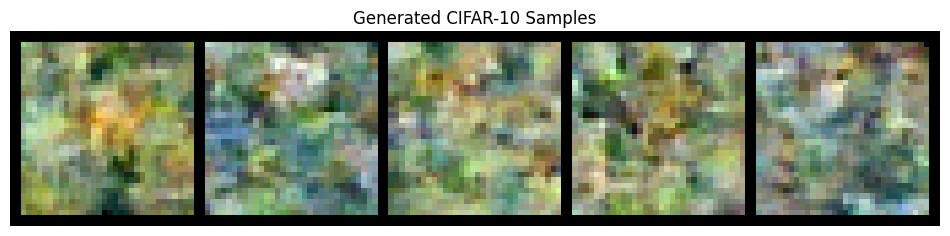

  Step 250/1250, Loss: 0.1439
  Step 300/1250, Loss: 0.1442
  Step 350/1250, Loss: 0.1169
  Step 400/1250, Loss: 0.1310
  Generating samples...


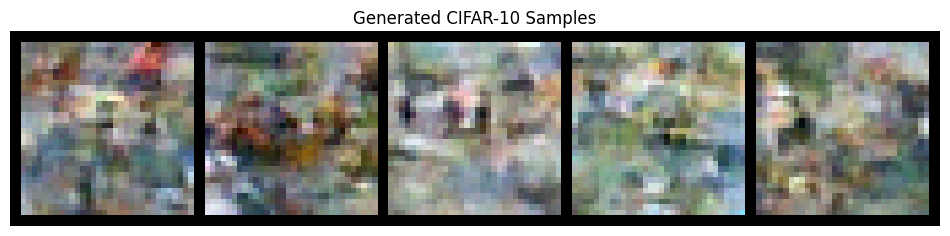

  Step 450/1250, Loss: 0.1076
  Step 500/1250, Loss: 0.1056
  Step 550/1250, Loss: 0.1164
  Step 600/1250, Loss: 0.1648
  Generating samples...


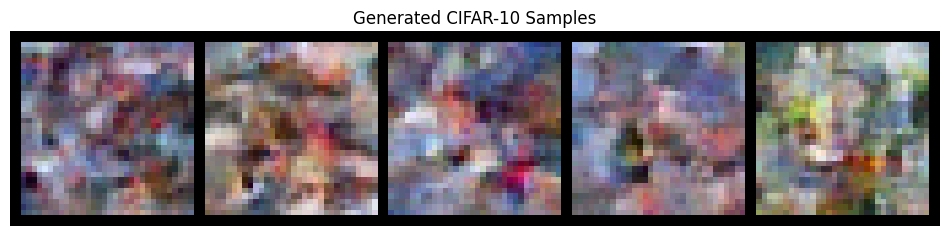

  Step 650/1250, Loss: 0.1103
  Step 700/1250, Loss: 0.1053
  Step 750/1250, Loss: 0.1101
  Step 800/1250, Loss: 0.1284
  Generating samples...


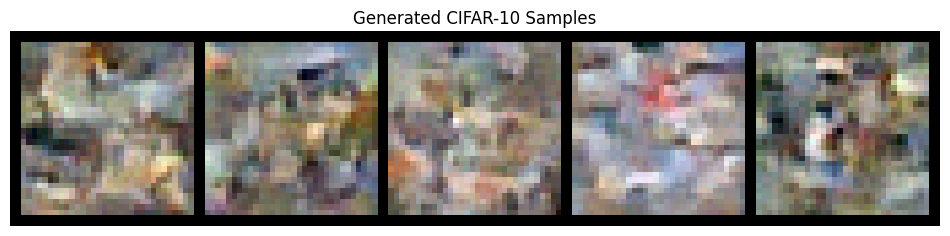

  Step 850/1250, Loss: 0.1568
  Step 900/1250, Loss: 0.1108
  Step 950/1250, Loss: 0.1086
  Step 1000/1250, Loss: 0.0970
  Generating samples...


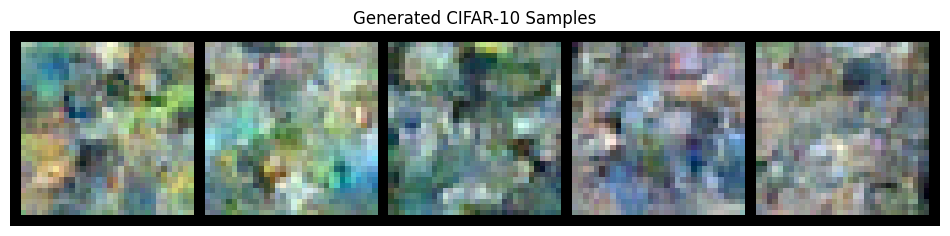

  Step 1050/1250, Loss: 0.1118
  Step 1100/1250, Loss: 0.1173
  Step 1150/1250, Loss: 0.1167
  Step 1200/1250, Loss: 0.1281
  Generating samples...


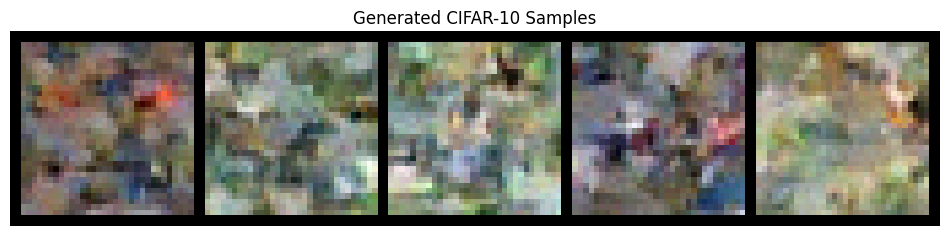


Training - Epoch 1 average loss: 0.1341
Running validation...
Validation - Epoch 1 average loss: 0.1203
Learning rate: 0.001000

Generating samples for visual progress check...


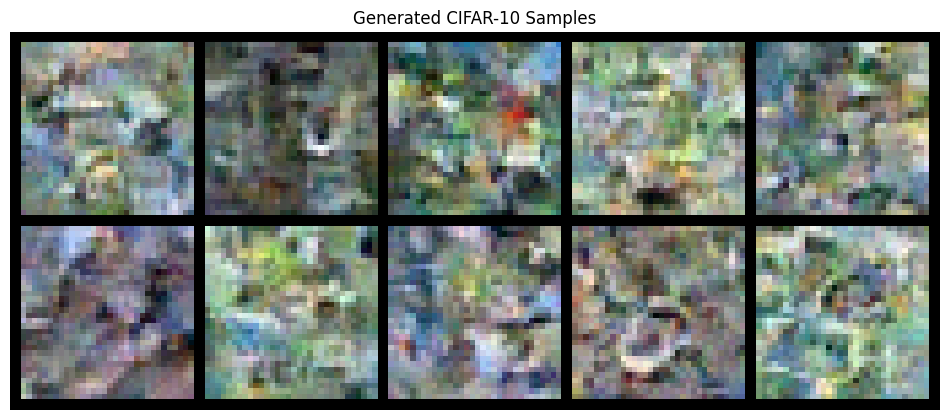

Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.1203)


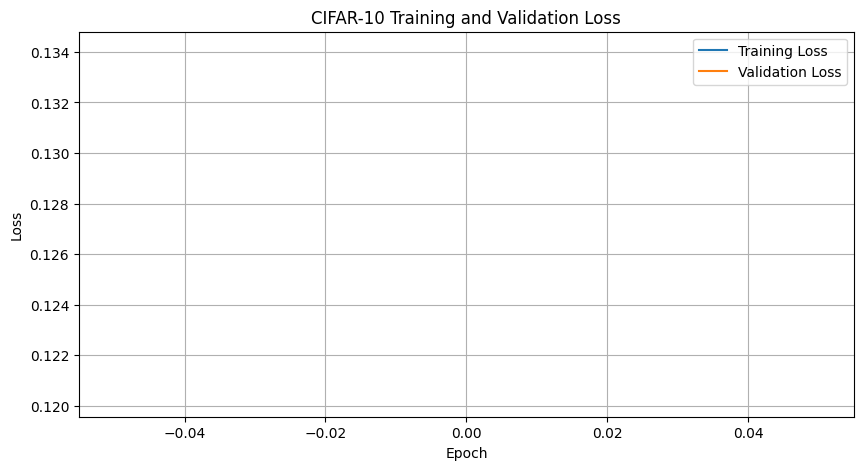


Epoch 2/50
--------------------
  Step 0/1250, Loss: 0.0926
  Step 50/1250, Loss: 0.0979
  Step 100/1250, Loss: 0.1060
  Step 150/1250, Loss: 0.1371
  Step 200/1250, Loss: 0.1166
  Generating samples...


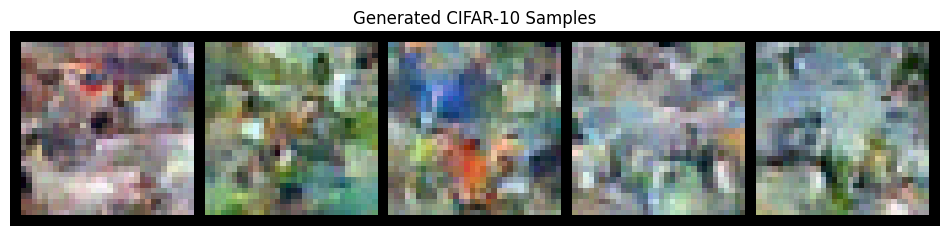

  Step 250/1250, Loss: 0.1015
  Step 300/1250, Loss: 0.1113
  Step 350/1250, Loss: 0.1124
  Step 400/1250, Loss: 0.1257
  Generating samples...


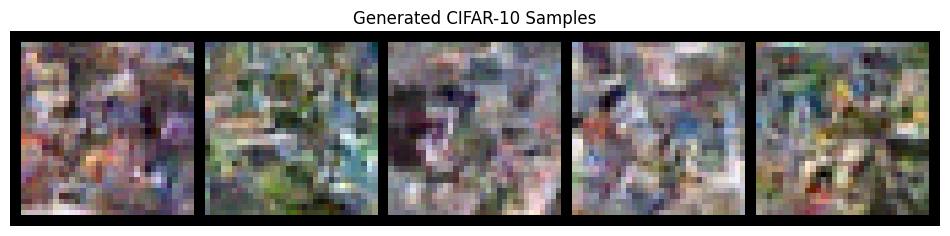

  Step 450/1250, Loss: 0.1978
  Step 500/1250, Loss: 0.0873
  Step 550/1250, Loss: 0.1068
  Step 600/1250, Loss: 0.1463
  Generating samples...


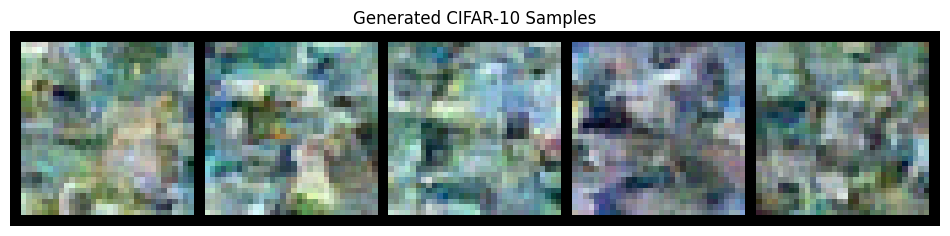

  Step 650/1250, Loss: 0.1368
  Step 700/1250, Loss: 0.1539
  Step 750/1250, Loss: 0.0911
  Step 800/1250, Loss: 0.0948
  Generating samples...


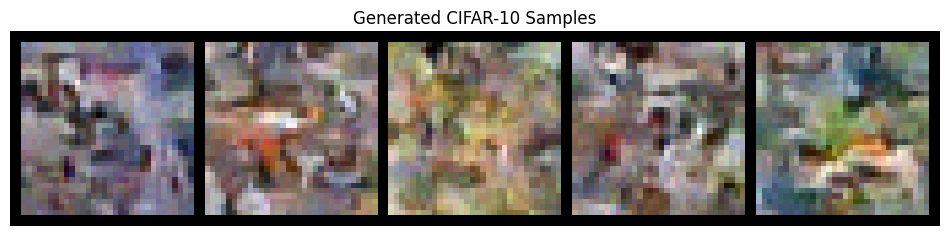

  Step 850/1250, Loss: 0.1465
  Step 900/1250, Loss: 0.1711
  Step 950/1250, Loss: 0.1418
  Step 1000/1250, Loss: 0.1174
  Generating samples...


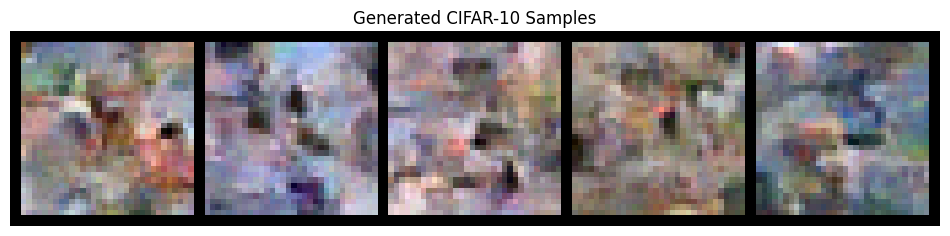

  Step 1050/1250, Loss: 0.1207
  Step 1100/1250, Loss: 0.1355
  Step 1150/1250, Loss: 0.1385
  Step 1200/1250, Loss: 0.0978
  Generating samples...


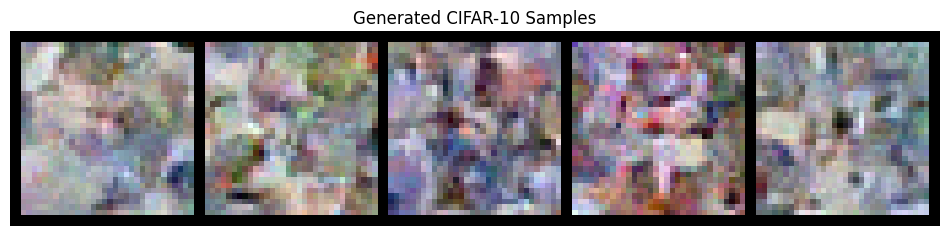


Training - Epoch 2 average loss: 0.1168
Running validation...
Validation - Epoch 2 average loss: 0.1131
Learning rate: 0.001000
Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.1131)

Epoch 3/50
--------------------
  Step 0/1250, Loss: 0.1092
  Step 50/1250, Loss: 0.1232
  Step 100/1250, Loss: 0.0983
  Step 150/1250, Loss: 0.1003
  Step 200/1250, Loss: 0.1354
  Generating samples...


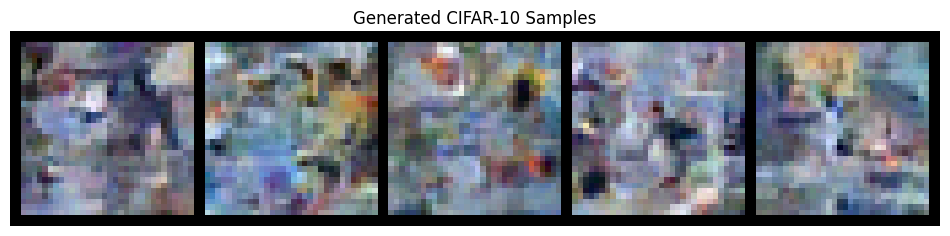

  Step 250/1250, Loss: 0.1356
  Step 300/1250, Loss: 0.1133
  Step 350/1250, Loss: 0.1241
  Step 400/1250, Loss: 0.1125
  Generating samples...


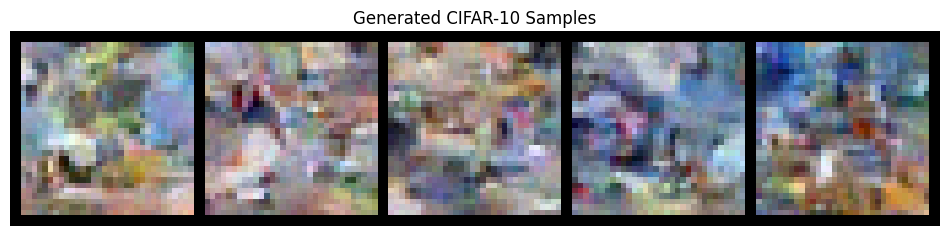

  Step 450/1250, Loss: 0.1002
  Step 500/1250, Loss: 0.1378
  Step 550/1250, Loss: 0.1053
  Step 600/1250, Loss: 0.1145
  Generating samples...


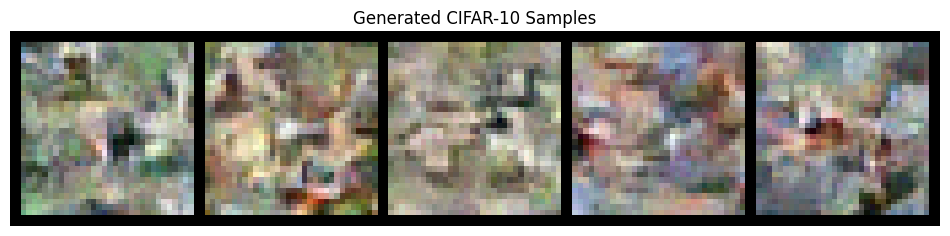

  Step 650/1250, Loss: 0.1010
  Step 700/1250, Loss: 0.1014
  Step 750/1250, Loss: 0.0891
  Step 800/1250, Loss: 0.1514
  Generating samples...


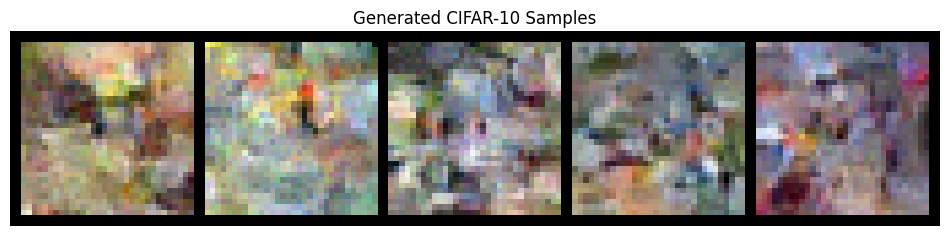

  Step 850/1250, Loss: 0.1207
  Step 900/1250, Loss: 0.1213
  Step 950/1250, Loss: 0.1062
  Step 1000/1250, Loss: 0.1168
  Generating samples...


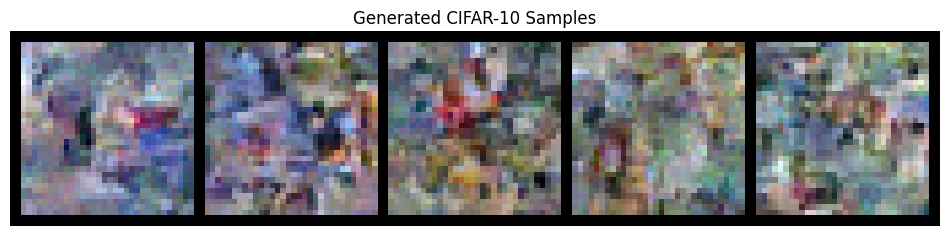

  Step 1050/1250, Loss: 0.1044
  Step 1100/1250, Loss: 0.1171
  Step 1150/1250, Loss: 0.0960
  Step 1200/1250, Loss: 0.1135
  Generating samples...


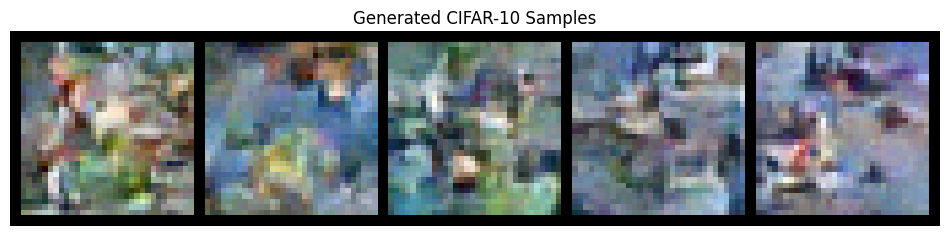


Training - Epoch 3 average loss: 0.1123
Running validation...
Validation - Epoch 3 average loss: 0.1113
Learning rate: 0.001000

Generating samples for visual progress check...


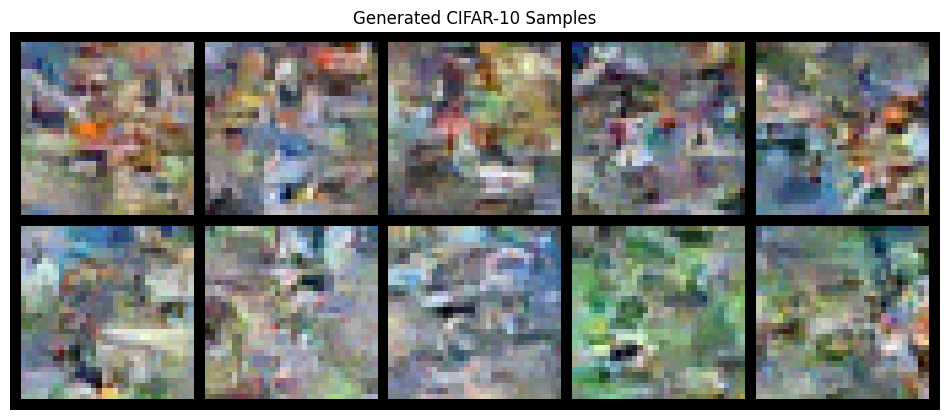

Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.1113)

Epoch 4/50
--------------------
  Step 0/1250, Loss: 0.0910
  Step 50/1250, Loss: 0.1113
  Step 100/1250, Loss: 0.1281
  Step 150/1250, Loss: 0.0948
  Step 200/1250, Loss: 0.1400
  Generating samples...


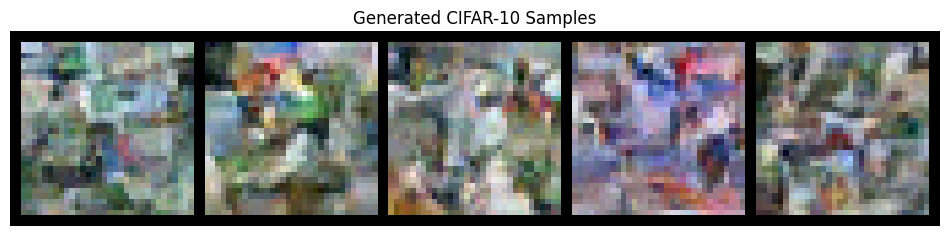

  Step 250/1250, Loss: 0.1064
  Step 300/1250, Loss: 0.1137
  Step 350/1250, Loss: 0.0929
  Step 400/1250, Loss: 0.0890
  Generating samples...


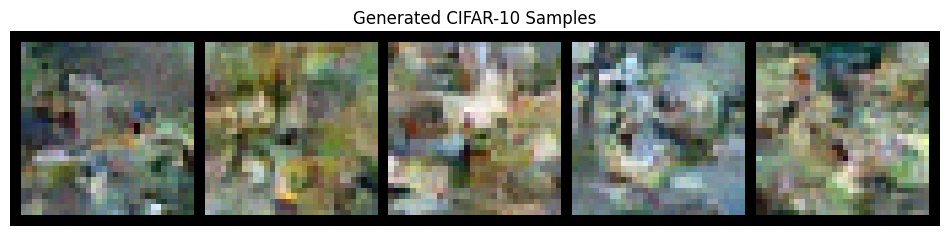

  Step 450/1250, Loss: 0.1555
  Step 500/1250, Loss: 0.1225
  Step 550/1250, Loss: 0.0823
  Step 600/1250, Loss: 0.1078
  Generating samples...


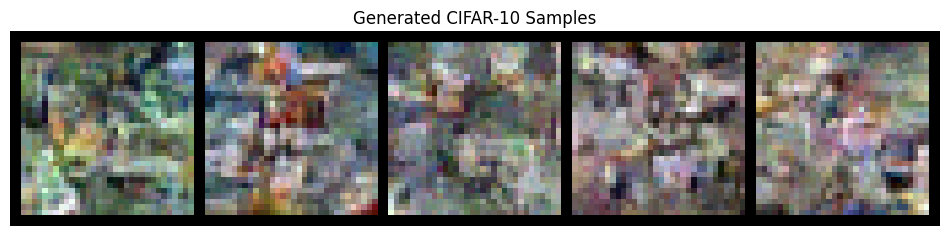

  Step 650/1250, Loss: 0.1078
  Step 700/1250, Loss: 0.1048
  Step 750/1250, Loss: 0.1373
  Step 800/1250, Loss: 0.1350
  Generating samples...


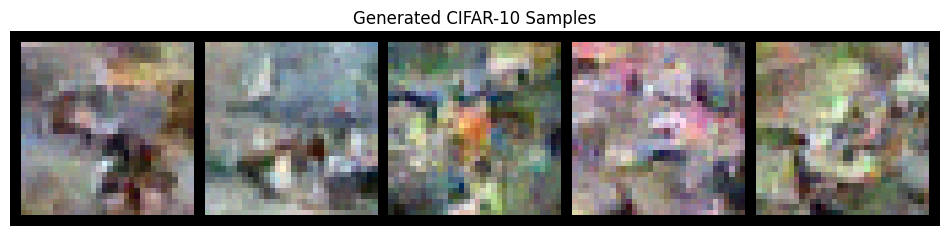

  Step 850/1250, Loss: 0.0765
  Step 900/1250, Loss: 0.1098
  Step 950/1250, Loss: 0.1225
  Step 1000/1250, Loss: 0.1202
  Generating samples...


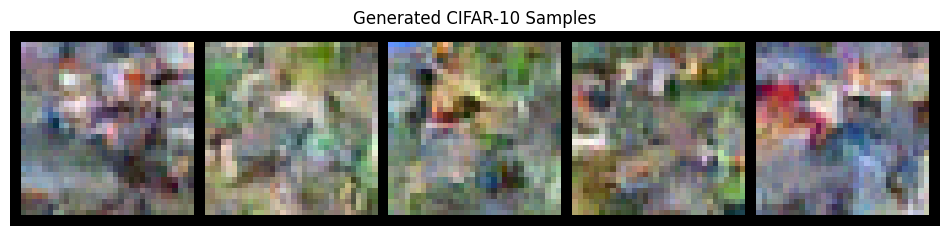

  Step 1050/1250, Loss: 0.1181
  Step 1100/1250, Loss: 0.1005
  Step 1150/1250, Loss: 0.1195
  Step 1200/1250, Loss: 0.1074
  Generating samples...


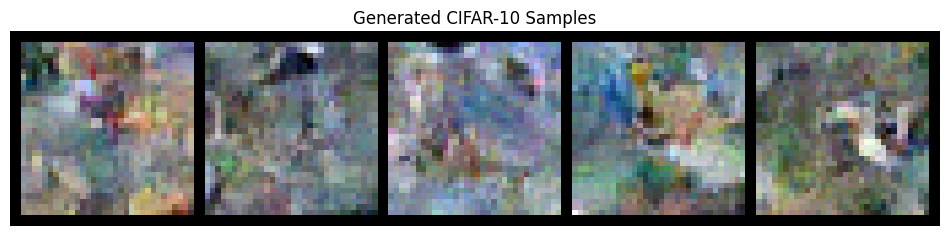


Training - Epoch 4 average loss: 0.1101
Running validation...
Validation - Epoch 4 average loss: 0.1085
Learning rate: 0.001000
Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.1085)

Epoch 5/50
--------------------
  Step 0/1250, Loss: 0.0846
  Step 50/1250, Loss: 0.1227
  Step 100/1250, Loss: 0.0867
  Step 150/1250, Loss: 0.1105
  Step 200/1250, Loss: 0.1317
  Generating samples...


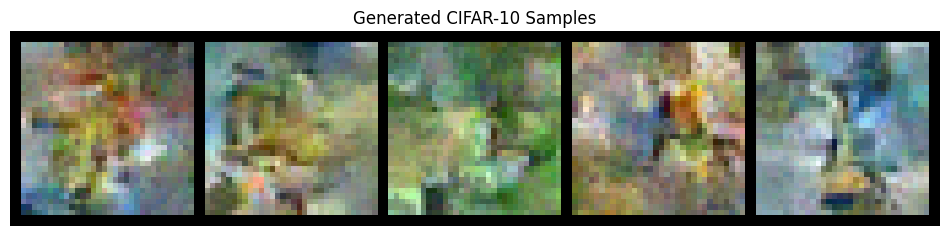

  Step 250/1250, Loss: 0.1131
  Step 300/1250, Loss: 0.1027
  Step 350/1250, Loss: 0.1032
  Step 400/1250, Loss: 0.0760
  Generating samples...


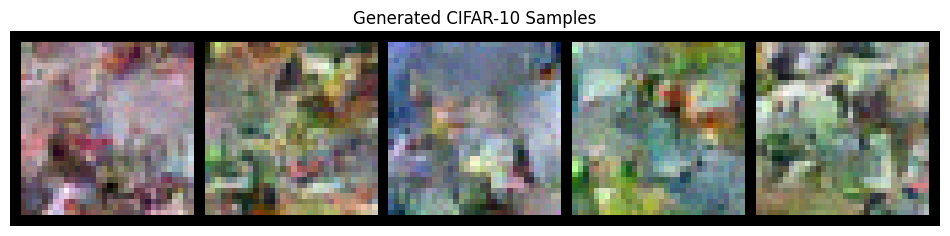

  Step 450/1250, Loss: 0.1114
  Step 500/1250, Loss: 0.1458
  Step 550/1250, Loss: 0.1116
  Step 600/1250, Loss: 0.1053
  Generating samples...


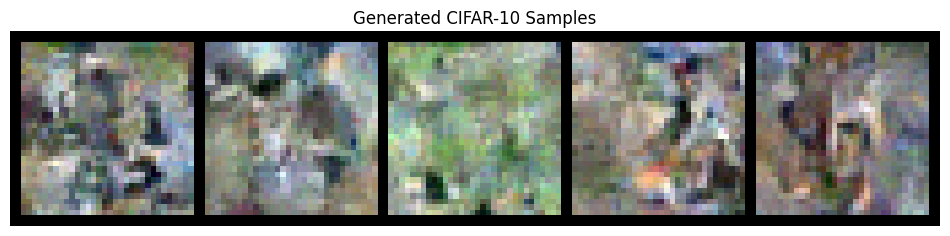

  Step 650/1250, Loss: 0.1568
  Step 700/1250, Loss: 0.0946
  Step 750/1250, Loss: 0.1193
  Step 800/1250, Loss: 0.0899
  Generating samples...


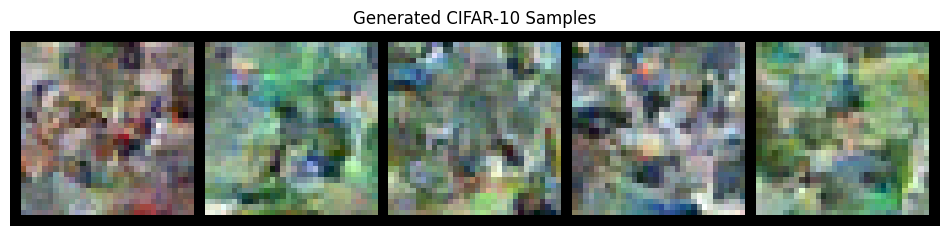

  Step 850/1250, Loss: 0.0795
  Step 900/1250, Loss: 0.1067
  Step 950/1250, Loss: 0.0917
  Step 1000/1250, Loss: 0.0947
  Generating samples...


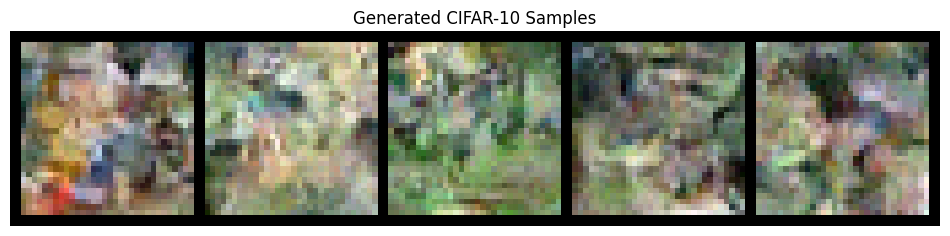

  Step 1050/1250, Loss: 0.1222
  Step 1100/1250, Loss: 0.1149
  Step 1150/1250, Loss: 0.1008
  Step 1200/1250, Loss: 0.0808
  Generating samples...


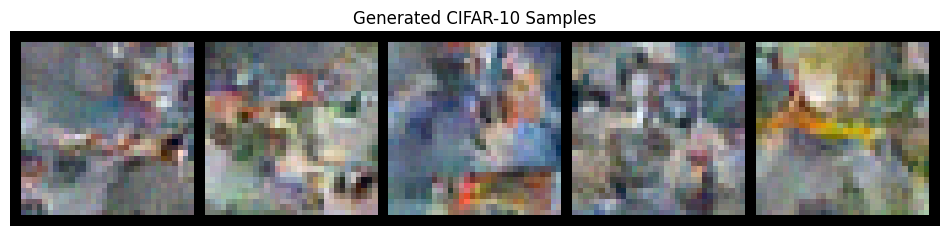


Training - Epoch 5 average loss: 0.1083
Running validation...
Validation - Epoch 5 average loss: 0.1088
Learning rate: 0.001000

Generating samples for visual progress check...


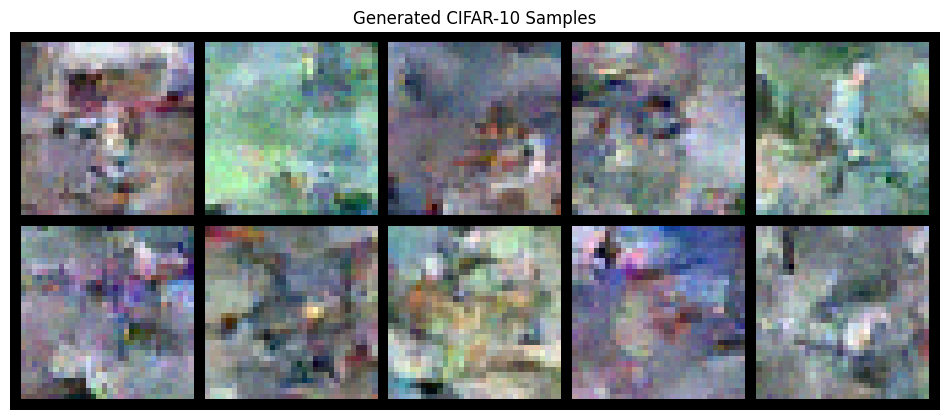

No improvement for 1/15 epochs

Epoch 6/50
--------------------
  Step 0/1250, Loss: 0.1119
  Step 50/1250, Loss: 0.1053
  Step 100/1250, Loss: 0.1237
  Step 150/1250, Loss: 0.0942
  Step 200/1250, Loss: 0.1347
  Generating samples...


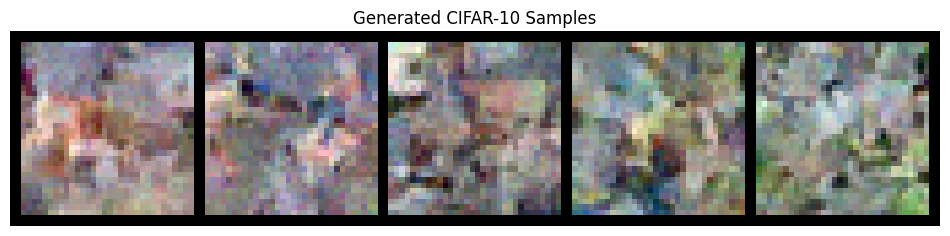

  Step 250/1250, Loss: 0.1209
  Step 300/1250, Loss: 0.1260
  Step 350/1250, Loss: 0.0869
  Step 400/1250, Loss: 0.1022
  Generating samples...


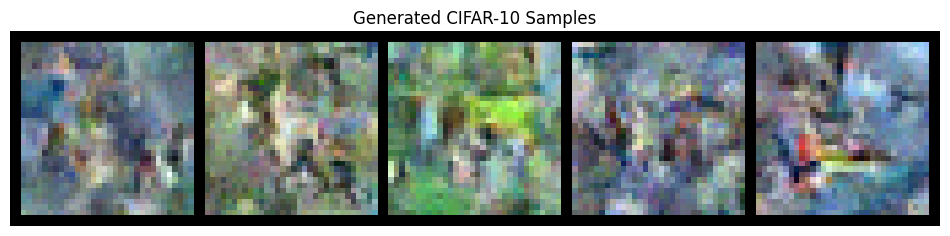

  Step 450/1250, Loss: 0.0811
  Step 500/1250, Loss: 0.0977
  Step 550/1250, Loss: 0.0720
  Step 600/1250, Loss: 0.0830
  Generating samples...


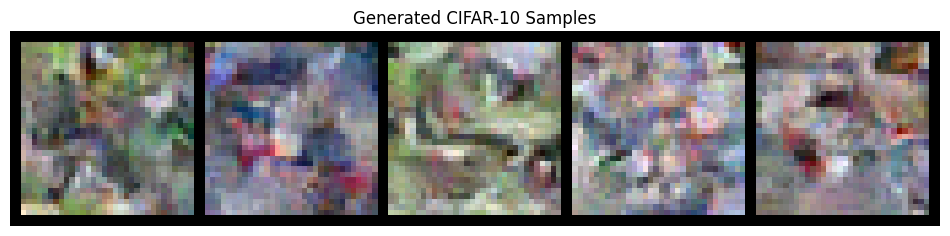

  Step 650/1250, Loss: 0.1312
  Step 700/1250, Loss: 0.1004
  Step 750/1250, Loss: 0.1212
  Step 800/1250, Loss: 0.1002
  Generating samples...


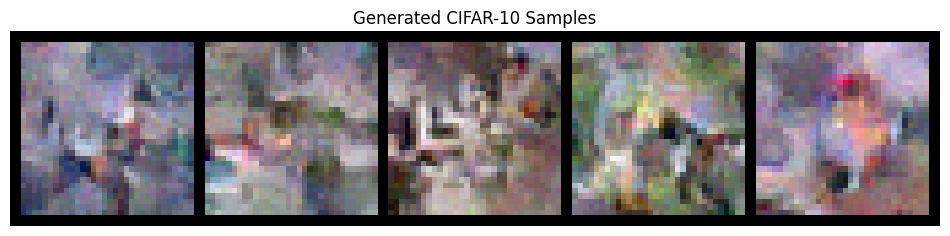

  Step 850/1250, Loss: 0.0972
  Step 900/1250, Loss: 0.0980
  Step 950/1250, Loss: 0.1008
  Step 1000/1250, Loss: 0.0691
  Generating samples...


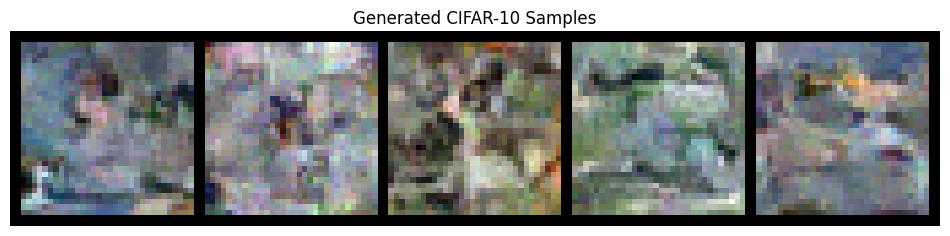

  Step 1050/1250, Loss: 0.1094
  Step 1100/1250, Loss: 0.1011
  Step 1150/1250, Loss: 0.1058
  Step 1200/1250, Loss: 0.1082
  Generating samples...


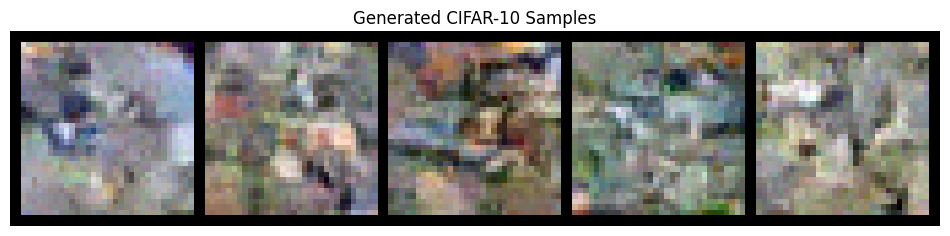


Training - Epoch 6 average loss: 0.1078
Running validation...
Validation - Epoch 6 average loss: 0.1051
Learning rate: 0.001000
Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.1051)


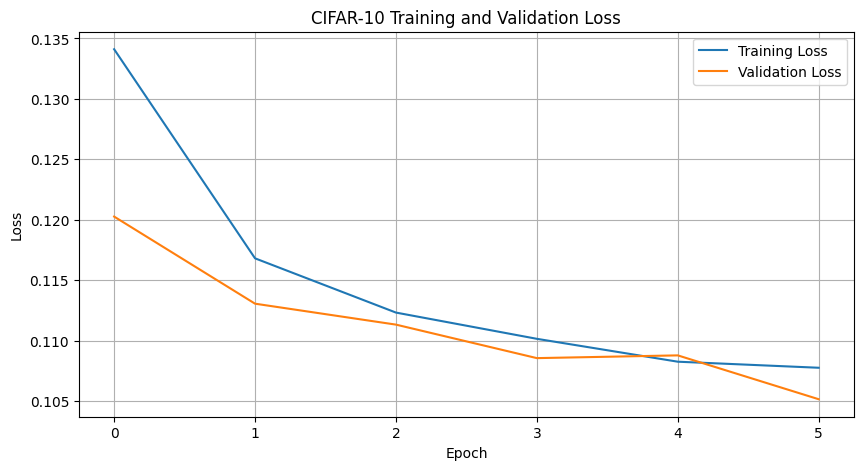


Epoch 7/50
--------------------
  Step 0/1250, Loss: 0.1225
  Step 50/1250, Loss: 0.0885
  Step 100/1250, Loss: 0.1020
  Step 150/1250, Loss: 0.1434
  Step 200/1250, Loss: 0.1153
  Generating samples...


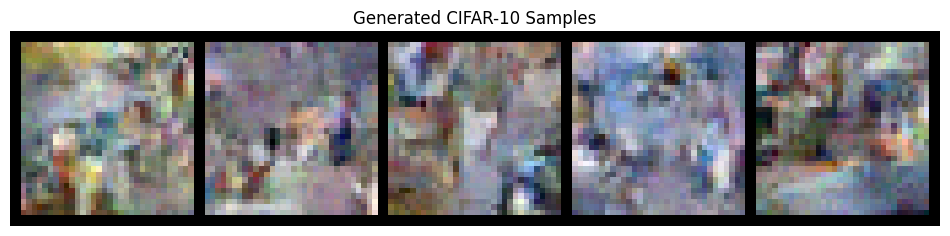

  Step 250/1250, Loss: 0.0857
  Step 300/1250, Loss: 0.1285
  Step 350/1250, Loss: 0.1385
  Step 400/1250, Loss: 0.1365
  Generating samples...


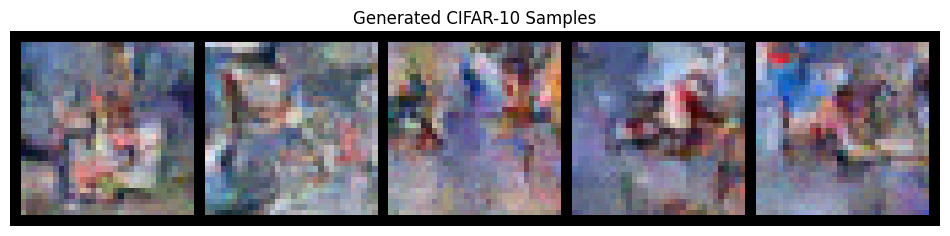

  Step 450/1250, Loss: 0.1052
  Step 500/1250, Loss: 0.1470
  Step 550/1250, Loss: 0.0954
  Step 600/1250, Loss: 0.1220
  Generating samples...


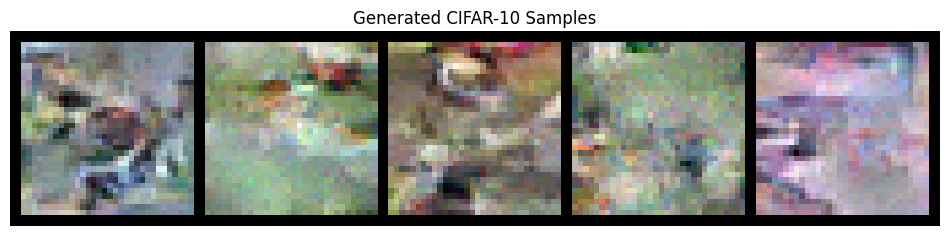

  Step 650/1250, Loss: 0.0924
  Step 700/1250, Loss: 0.0932
  Step 750/1250, Loss: 0.1300
  Step 800/1250, Loss: 0.0843
  Generating samples...


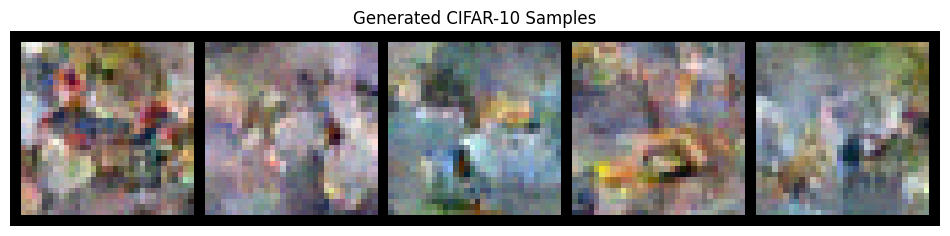

  Step 850/1250, Loss: 0.1181
  Step 900/1250, Loss: 0.1139
  Step 950/1250, Loss: 0.0752
  Step 1000/1250, Loss: 0.1045
  Generating samples...


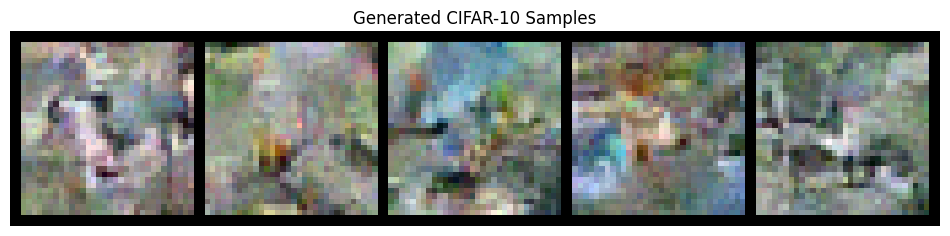

  Step 1050/1250, Loss: 0.0985
  Step 1100/1250, Loss: 0.0830
  Step 1150/1250, Loss: 0.1059
  Step 1200/1250, Loss: 0.1249
  Generating samples...


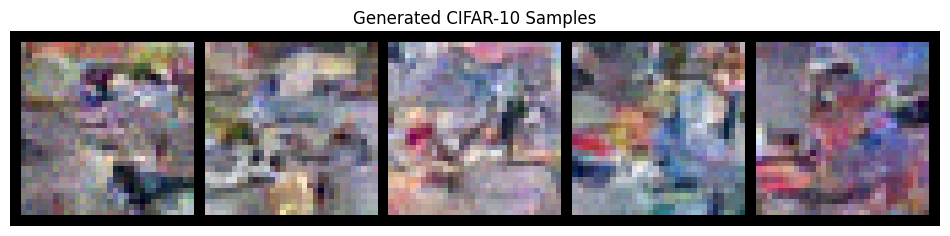


Training - Epoch 7 average loss: 0.1059
Running validation...
Validation - Epoch 7 average loss: 0.1073
Learning rate: 0.001000

Generating samples for visual progress check...


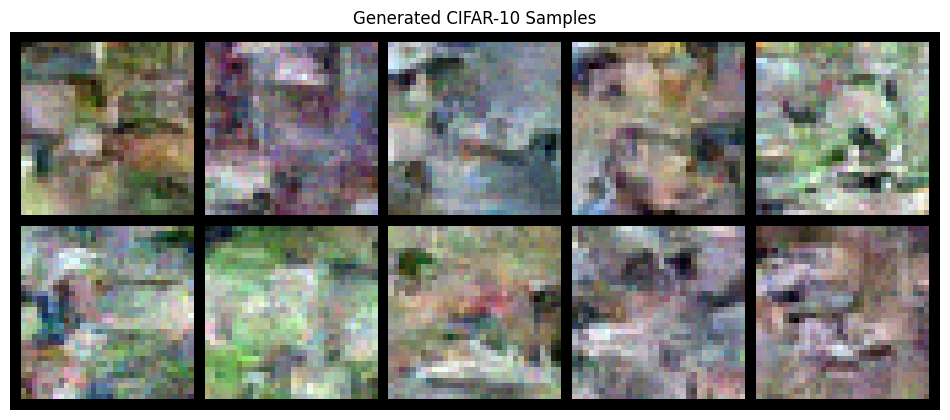

No improvement for 1/15 epochs

Epoch 8/50
--------------------
  Step 0/1250, Loss: 0.0907
  Step 50/1250, Loss: 0.1202
  Step 100/1250, Loss: 0.1045
  Step 150/1250, Loss: 0.1075
  Step 200/1250, Loss: 0.1204
  Generating samples...


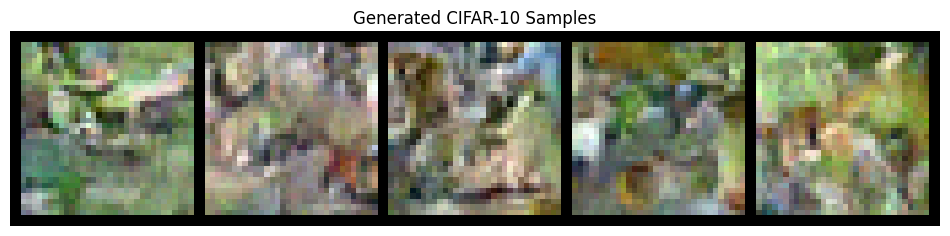

  Step 250/1250, Loss: 0.0928
  Step 300/1250, Loss: 0.0715
  Step 350/1250, Loss: 0.1019
  Step 400/1250, Loss: 0.1050
  Generating samples...


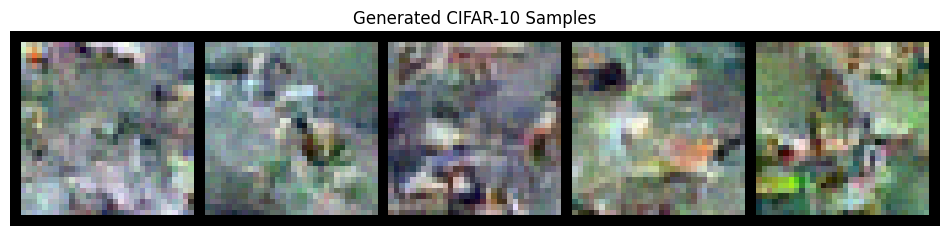

  Step 450/1250, Loss: 0.1103
  Step 500/1250, Loss: 0.1042
  Step 550/1250, Loss: 0.0612
  Step 600/1250, Loss: 0.1249
  Generating samples...


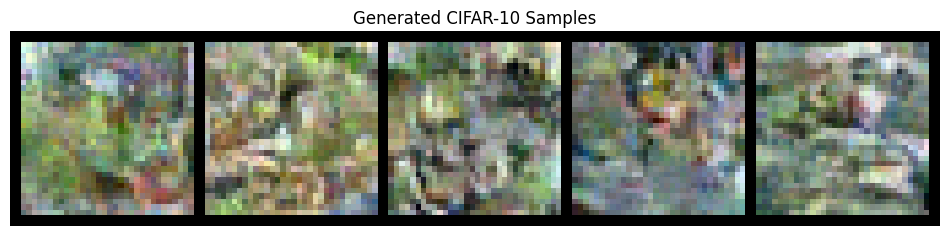

  Step 650/1250, Loss: 0.0918
  Step 700/1250, Loss: 0.1106
  Step 750/1250, Loss: 0.0764
  Step 800/1250, Loss: 0.0902
  Generating samples...


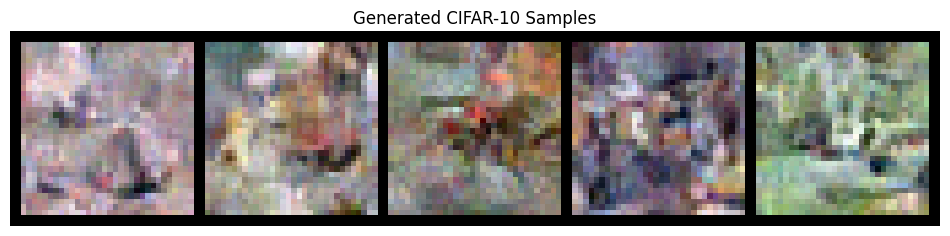

  Step 850/1250, Loss: 0.1004
  Step 900/1250, Loss: 0.1171
  Step 950/1250, Loss: 0.0944
  Step 1000/1250, Loss: 0.0924
  Generating samples...


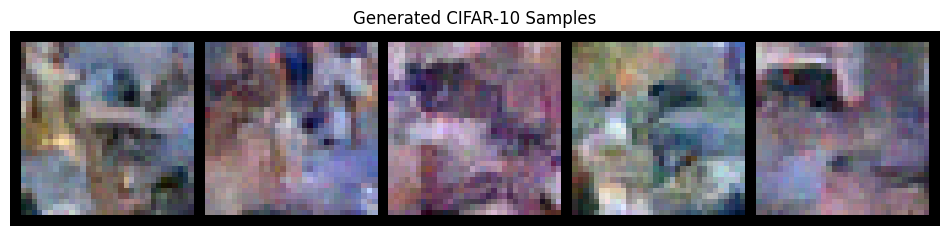

  Step 1050/1250, Loss: 0.1044
  Step 1100/1250, Loss: 0.0826
  Step 1150/1250, Loss: 0.1010
  Step 1200/1250, Loss: 0.0943
  Generating samples...


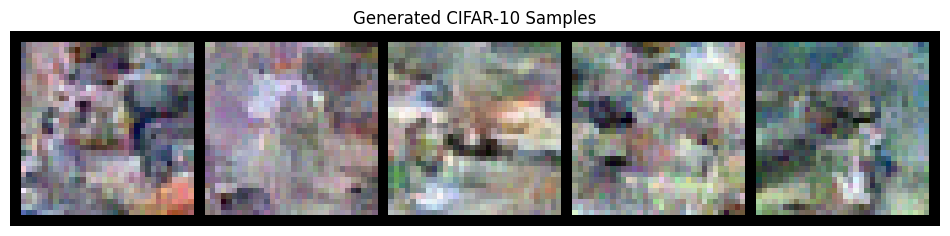


Training - Epoch 8 average loss: 0.1050
Running validation...
Validation - Epoch 8 average loss: 0.1070
Learning rate: 0.001000
No improvement for 2/15 epochs

Epoch 9/50
--------------------
  Step 0/1250, Loss: 0.0977
  Step 50/1250, Loss: 0.1385
  Step 100/1250, Loss: 0.1692
  Step 150/1250, Loss: 0.0894
  Step 200/1250, Loss: 0.0892
  Generating samples...


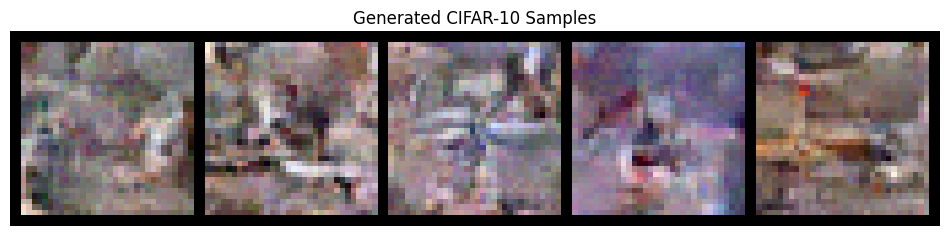

  Step 250/1250, Loss: 0.0640
  Step 300/1250, Loss: 0.1060
  Step 350/1250, Loss: 0.1134
  Step 400/1250, Loss: 0.1063
  Generating samples...


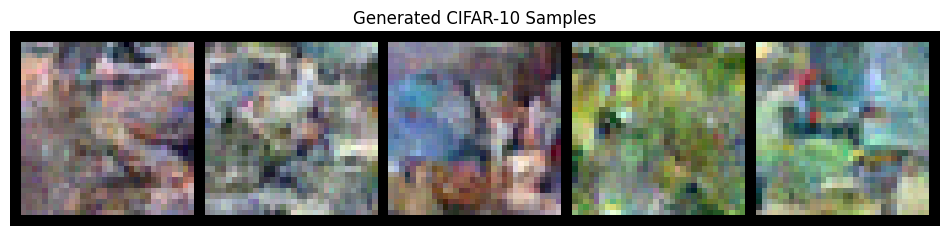

  Step 450/1250, Loss: 0.0833
  Step 500/1250, Loss: 0.1028
  Step 550/1250, Loss: 0.1028
  Step 600/1250, Loss: 0.1149
  Generating samples...


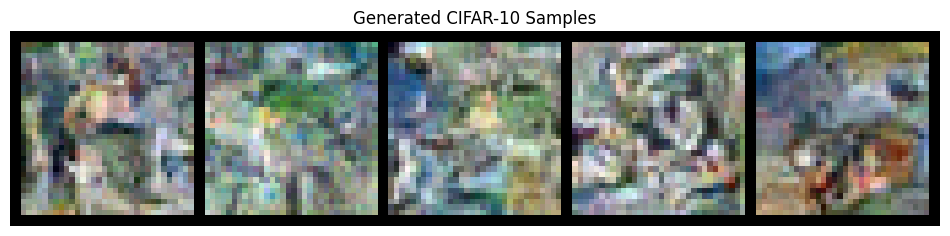

  Step 650/1250, Loss: 0.1002
  Step 700/1250, Loss: 0.1254
  Step 750/1250, Loss: 0.1102
  Step 800/1250, Loss: 0.0851
  Generating samples...


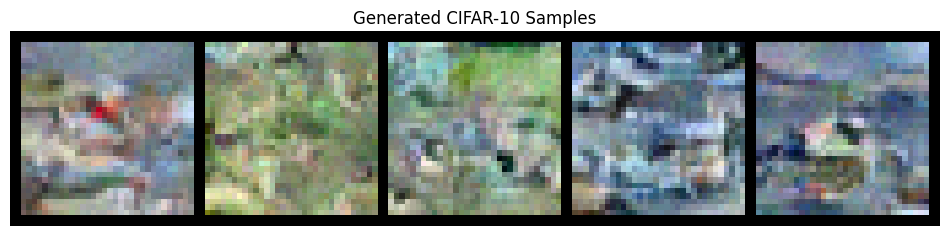

  Step 850/1250, Loss: 0.1149
  Step 900/1250, Loss: 0.1234
  Step 950/1250, Loss: 0.0639
  Step 1000/1250, Loss: 0.0971
  Generating samples...


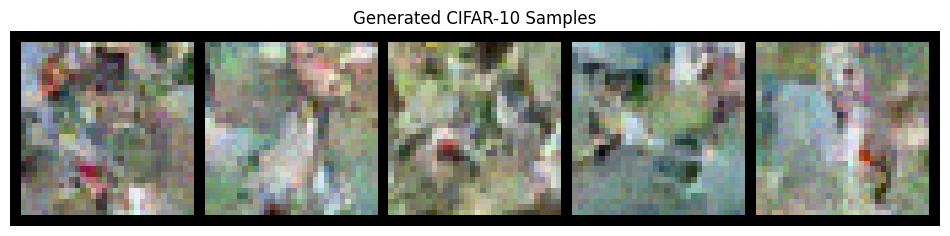

  Step 1050/1250, Loss: 0.0830
  Step 1100/1250, Loss: 0.1302
  Step 1150/1250, Loss: 0.1339
  Step 1200/1250, Loss: 0.1126
  Generating samples...


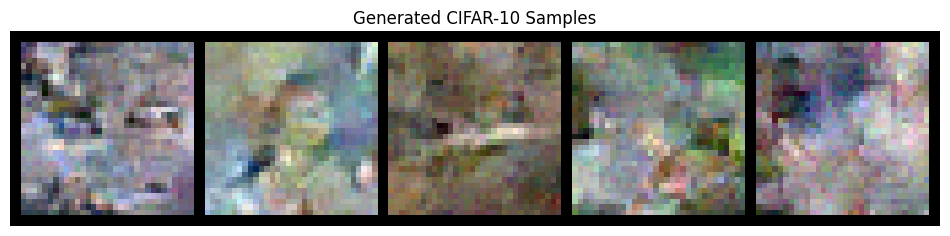


Training - Epoch 9 average loss: 0.1046
Running validation...
Validation - Epoch 9 average loss: 0.1032
Learning rate: 0.001000

Generating samples for visual progress check...


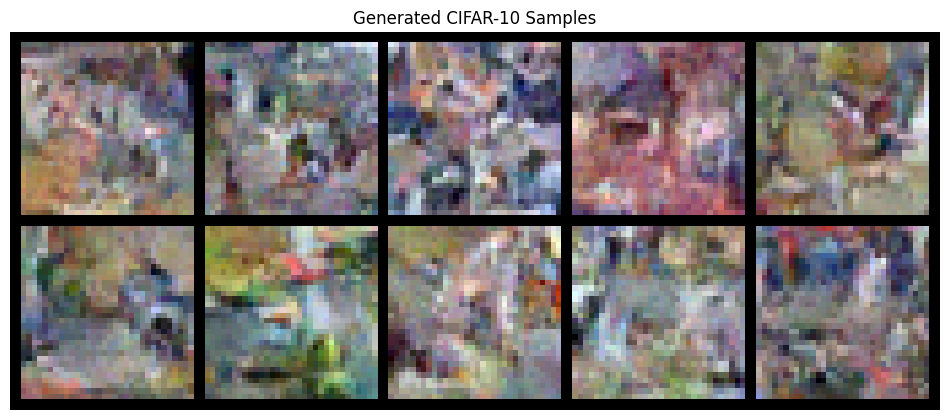

Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.1032)

Epoch 10/50
--------------------
  Step 0/1250, Loss: 0.0920
  Step 50/1250, Loss: 0.1004
  Step 100/1250, Loss: 0.1218
  Step 150/1250, Loss: 0.1054
  Step 200/1250, Loss: 0.1254
  Generating samples...


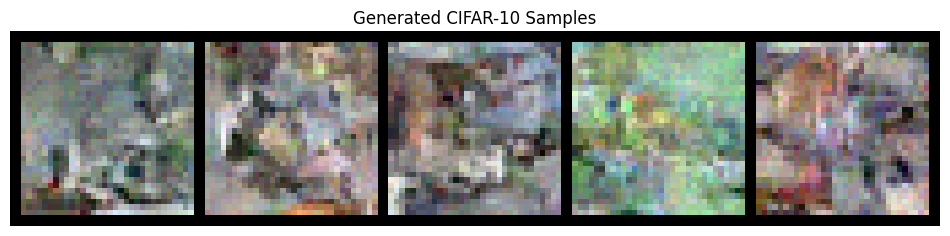

  Step 250/1250, Loss: 0.0839
  Step 300/1250, Loss: 0.1321
  Step 350/1250, Loss: 0.0933
  Step 400/1250, Loss: 0.0883
  Generating samples...


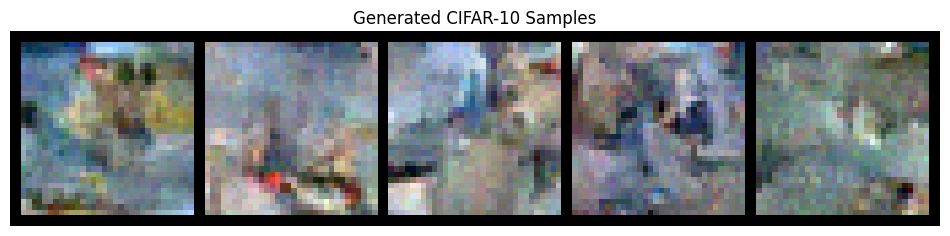

  Step 450/1250, Loss: 0.0825
  Step 500/1250, Loss: 0.1230
  Step 550/1250, Loss: 0.0930
  Step 600/1250, Loss: 0.1051
  Generating samples...


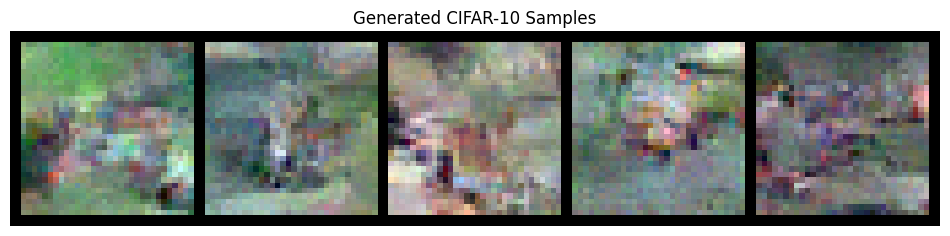

  Step 650/1250, Loss: 0.0879
  Step 700/1250, Loss: 0.1026
  Step 750/1250, Loss: 0.1327
  Step 800/1250, Loss: 0.0688
  Generating samples...


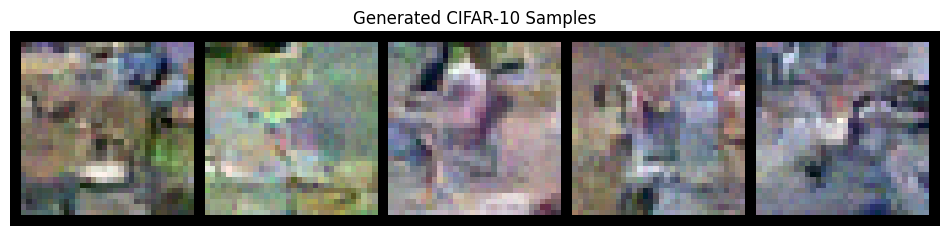

  Step 850/1250, Loss: 0.1178
  Step 900/1250, Loss: 0.1126
  Step 950/1250, Loss: 0.1009
  Step 1000/1250, Loss: 0.1053
  Generating samples...


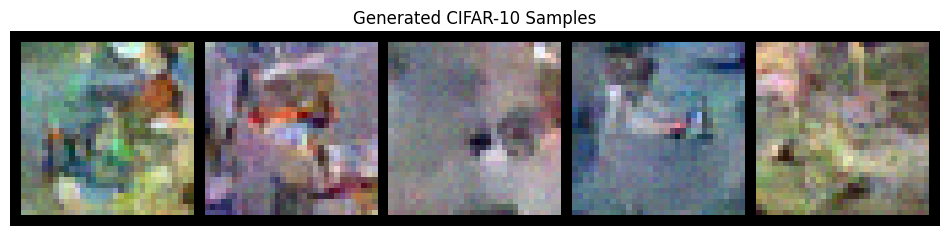

  Step 1050/1250, Loss: 0.1157
  Step 1100/1250, Loss: 0.1149
  Step 1150/1250, Loss: 0.1503
  Step 1200/1250, Loss: 0.1294
  Generating samples...


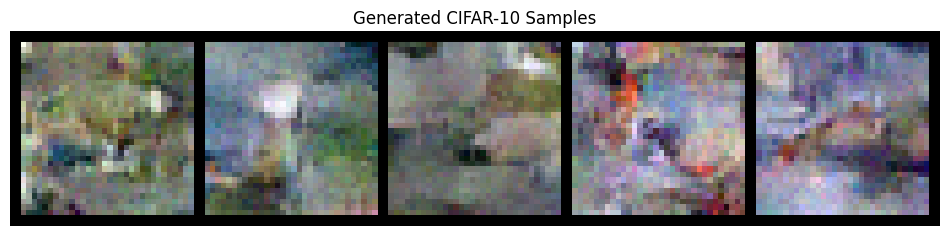


Training - Epoch 10 average loss: 0.1043
Running validation...
Validation - Epoch 10 average loss: 0.1043
Learning rate: 0.001000
No improvement for 1/15 epochs

Epoch 11/50
--------------------
  Step 0/1250, Loss: 0.0820
  Step 50/1250, Loss: 0.1166
  Step 100/1250, Loss: 0.1113
  Step 150/1250, Loss: 0.1247
  Step 200/1250, Loss: 0.0873
  Generating samples...


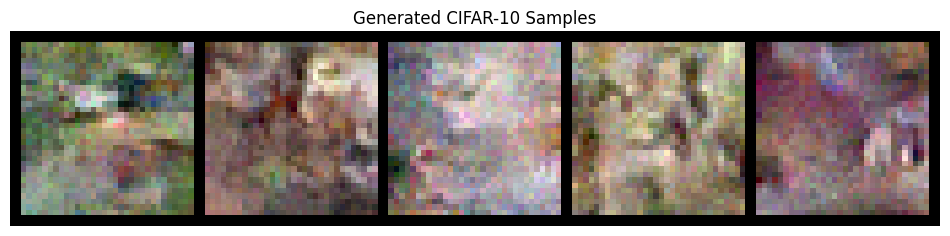

  Step 250/1250, Loss: 0.0987
  Step 300/1250, Loss: 0.1000
  Step 350/1250, Loss: 0.1145
  Step 400/1250, Loss: 0.0923
  Generating samples...


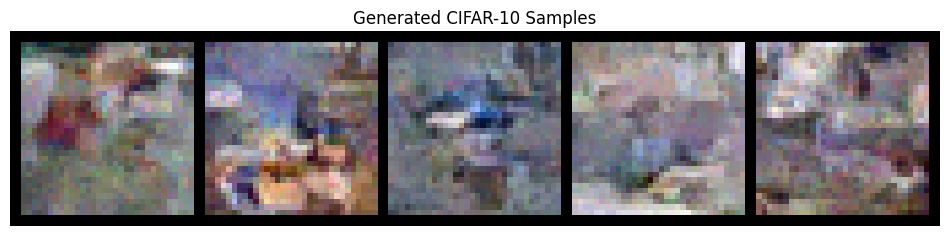

  Step 450/1250, Loss: 0.1174
  Step 500/1250, Loss: 0.1112
  Step 550/1250, Loss: 0.0872
  Step 600/1250, Loss: 0.1270
  Generating samples...


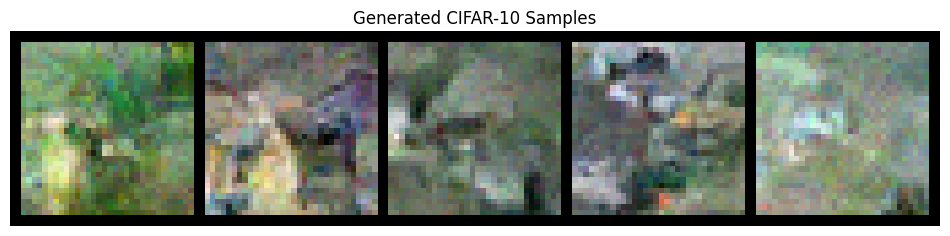

  Step 650/1250, Loss: 0.1087
  Step 700/1250, Loss: 0.0973
  Step 750/1250, Loss: 0.0697
  Step 800/1250, Loss: 0.0861
  Generating samples...


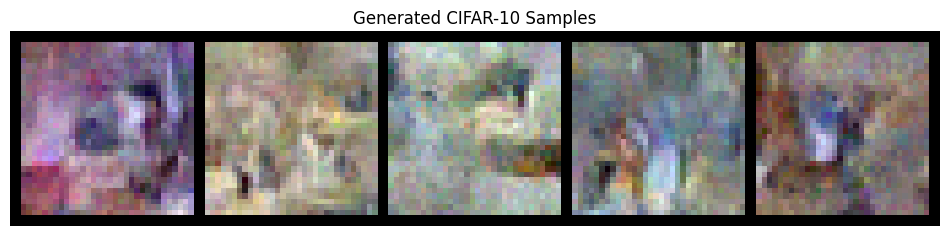

  Step 850/1250, Loss: 0.0975
  Step 900/1250, Loss: 0.1246
  Step 950/1250, Loss: 0.1273
  Step 1000/1250, Loss: 0.1362
  Generating samples...


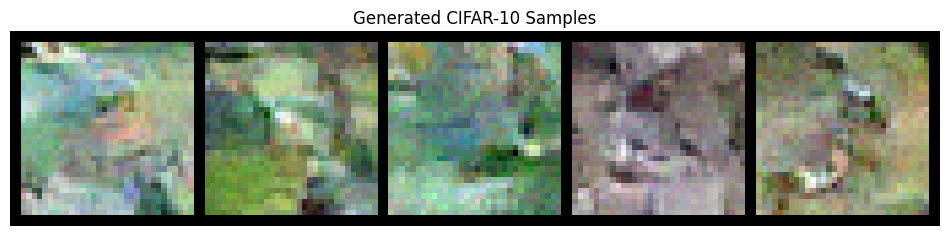

  Step 1050/1250, Loss: 0.1052
  Step 1100/1250, Loss: 0.0933
  Step 1150/1250, Loss: 0.1272
  Step 1200/1250, Loss: 0.1003
  Generating samples...


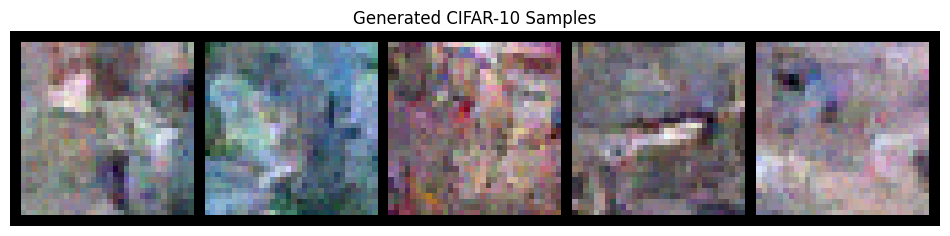


Training - Epoch 11 average loss: 0.1037
Running validation...
Validation - Epoch 11 average loss: 0.1024
Learning rate: 0.001000

Generating samples for visual progress check...


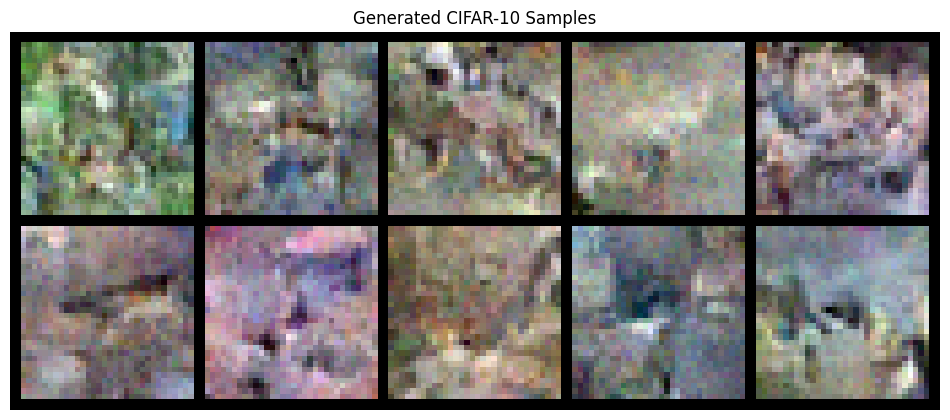

Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.1024)


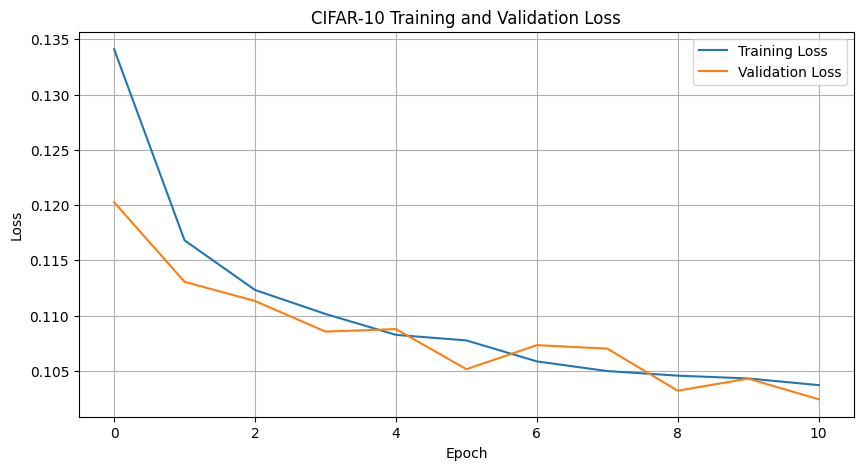


Epoch 12/50
--------------------
  Step 0/1250, Loss: 0.0993
  Step 50/1250, Loss: 0.0901
  Step 100/1250, Loss: 0.0820
  Step 150/1250, Loss: 0.1090
  Step 200/1250, Loss: 0.1146
  Generating samples...


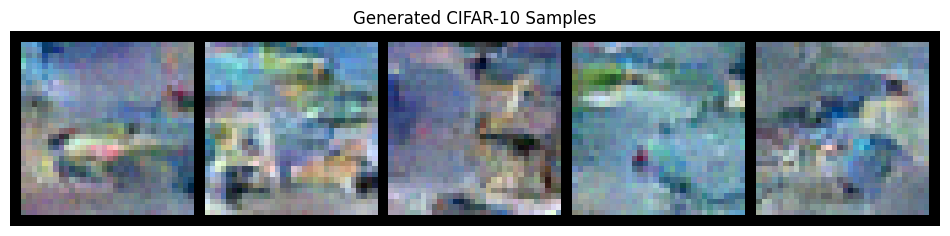

  Step 250/1250, Loss: 0.0753
  Step 300/1250, Loss: 0.0688
  Step 350/1250, Loss: 0.0824
  Step 400/1250, Loss: 0.0862
  Generating samples...


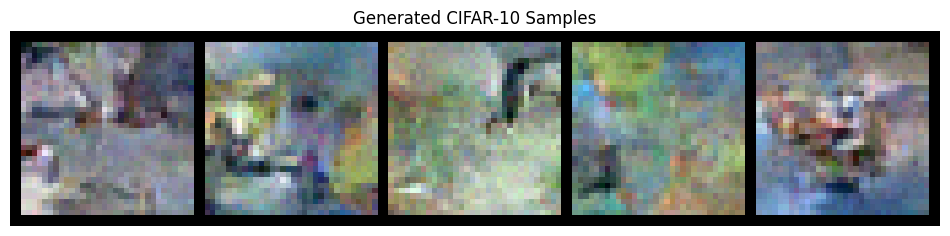

  Step 450/1250, Loss: 0.1034
  Step 500/1250, Loss: 0.1235
  Step 550/1250, Loss: 0.0951
  Step 600/1250, Loss: 0.1194
  Generating samples...


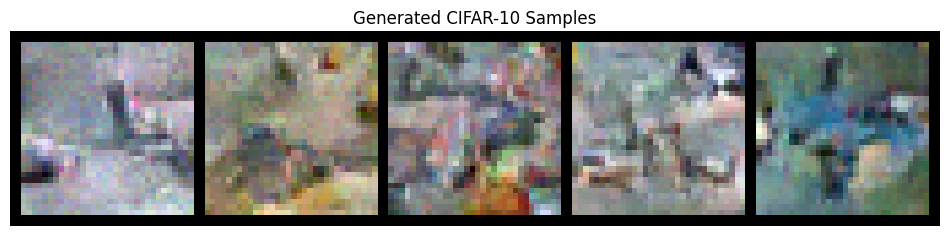

  Step 650/1250, Loss: 0.1089
  Step 700/1250, Loss: 0.1126
  Step 750/1250, Loss: 0.0768
  Step 800/1250, Loss: 0.1008
  Generating samples...


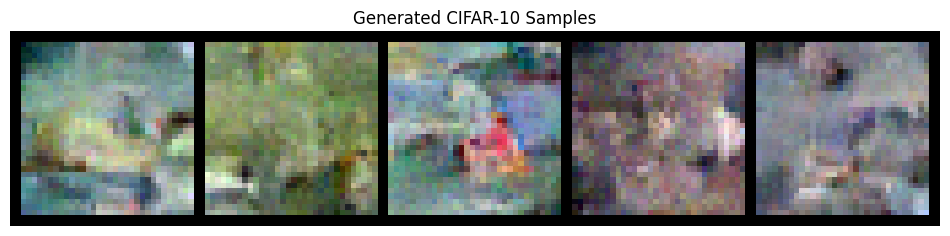

  Step 850/1250, Loss: 0.0753
  Step 900/1250, Loss: 0.1100
  Step 950/1250, Loss: 0.1290
  Step 1000/1250, Loss: 0.0952
  Generating samples...


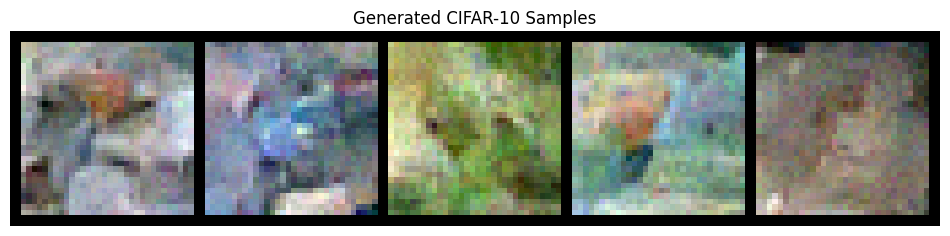

  Step 1050/1250, Loss: 0.1181
  Step 1100/1250, Loss: 0.0982
  Step 1150/1250, Loss: 0.1315
  Step 1200/1250, Loss: 0.1019
  Generating samples...


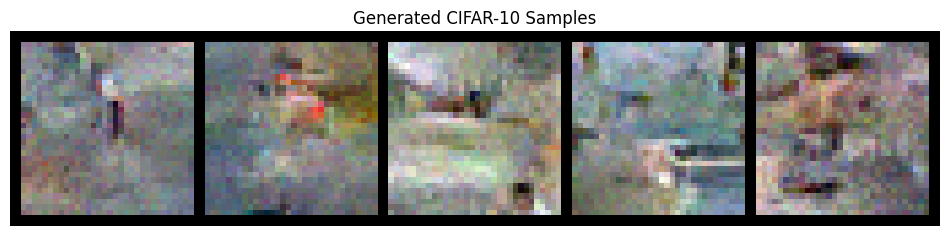


Training - Epoch 12 average loss: 0.1023
Running validation...
Validation - Epoch 12 average loss: 0.1026
Learning rate: 0.001000
No improvement for 1/15 epochs

Epoch 13/50
--------------------
  Step 0/1250, Loss: 0.1271
  Step 50/1250, Loss: 0.1107
  Step 100/1250, Loss: 0.1041
  Step 150/1250, Loss: 0.0727
  Step 200/1250, Loss: 0.0967
  Generating samples...


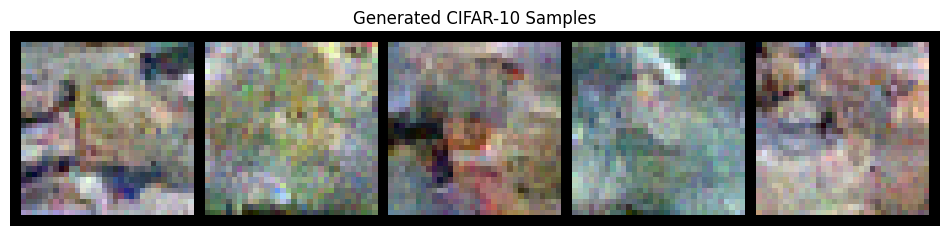

  Step 250/1250, Loss: 0.0974
  Step 300/1250, Loss: 0.1155
  Step 350/1250, Loss: 0.1025
  Step 400/1250, Loss: 0.1023
  Generating samples...


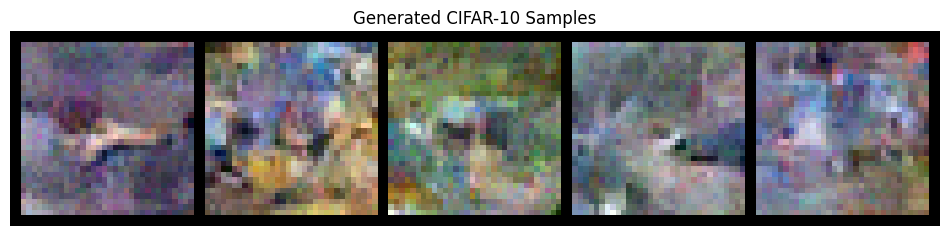

  Step 450/1250, Loss: 0.0989
  Step 500/1250, Loss: 0.0727
  Step 550/1250, Loss: 0.1412
  Step 600/1250, Loss: 0.0829
  Generating samples...


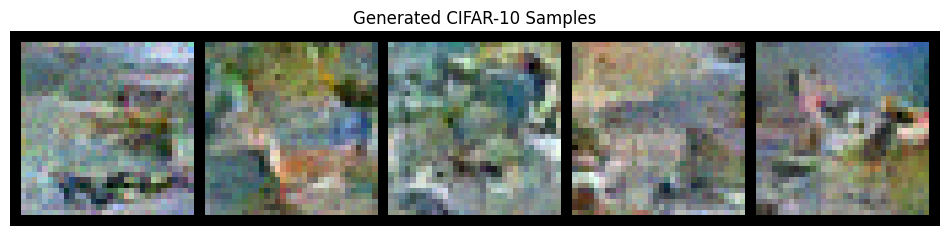

  Step 650/1250, Loss: 0.0959
  Step 700/1250, Loss: 0.1041
  Step 750/1250, Loss: 0.1184
  Step 800/1250, Loss: 0.1350
  Generating samples...


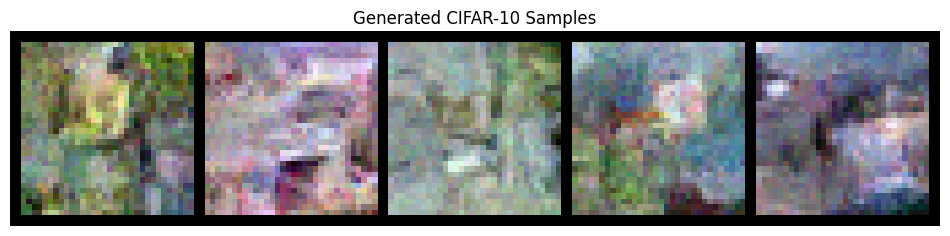

  Step 850/1250, Loss: 0.0997
  Step 900/1250, Loss: 0.1358
  Step 950/1250, Loss: 0.1191
  Step 1000/1250, Loss: 0.0823
  Generating samples...


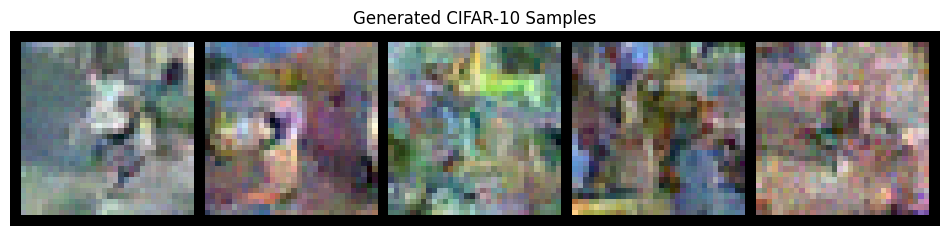

  Step 1050/1250, Loss: 0.1086
  Step 1100/1250, Loss: 0.0951
  Step 1150/1250, Loss: 0.1106
  Step 1200/1250, Loss: 0.0862
  Generating samples...


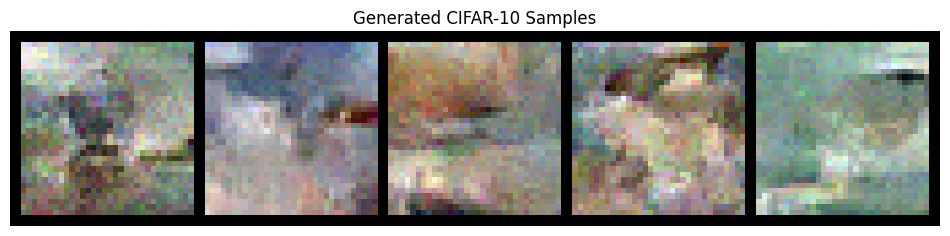


Training - Epoch 13 average loss: 0.1007
Running validation...
Validation - Epoch 13 average loss: 0.1022
Learning rate: 0.001000

Generating samples for visual progress check...


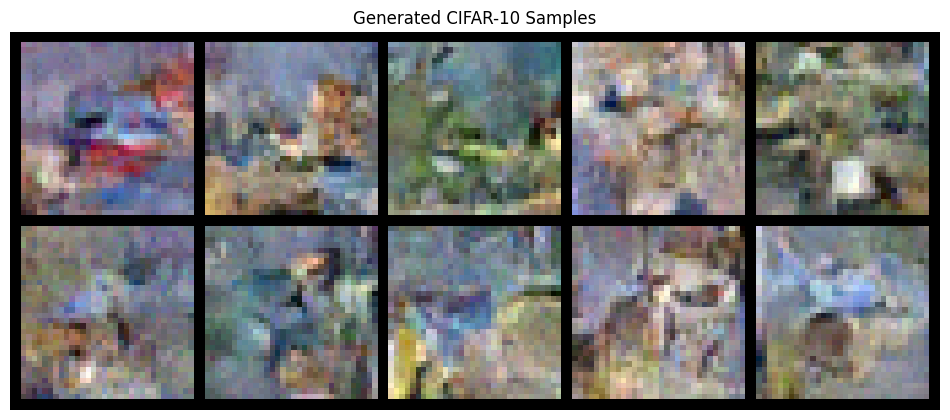

Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.1022)

Epoch 14/50
--------------------
  Step 0/1250, Loss: 0.1287
  Step 50/1250, Loss: 0.1191
  Step 100/1250, Loss: 0.0666
  Step 150/1250, Loss: 0.0940
  Step 200/1250, Loss: 0.0862
  Generating samples...


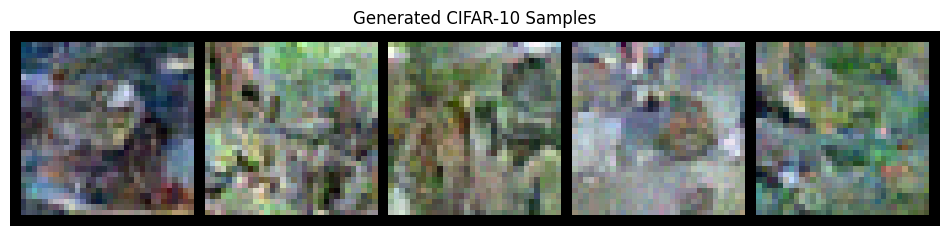

  Step 250/1250, Loss: 0.1403
  Step 300/1250, Loss: 0.0665
  Step 350/1250, Loss: 0.1539
  Step 400/1250, Loss: 0.1107
  Generating samples...


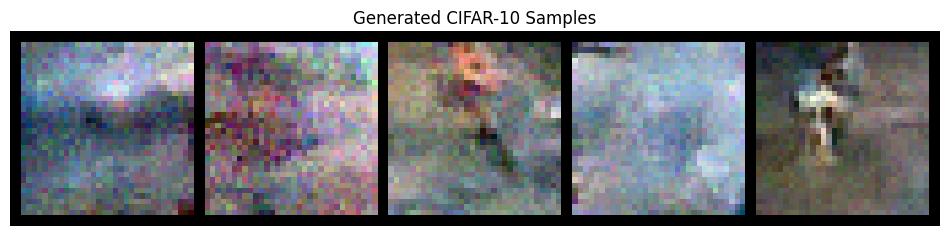

  Step 450/1250, Loss: 0.1260
  Step 500/1250, Loss: 0.1012
  Step 550/1250, Loss: 0.1069
  Step 600/1250, Loss: 0.0830
  Generating samples...


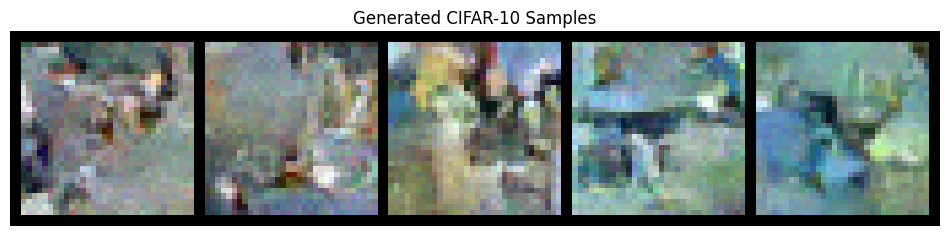

  Step 650/1250, Loss: 0.0916
  Step 700/1250, Loss: 0.0820
  Step 750/1250, Loss: 0.1668
  Step 800/1250, Loss: 0.1291
  Generating samples...


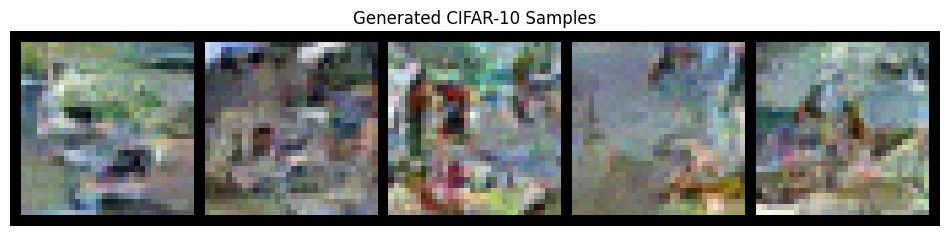

  Step 850/1250, Loss: 0.0788
  Step 900/1250, Loss: 0.0745
  Step 950/1250, Loss: 0.1046
  Step 1000/1250, Loss: 0.1317
  Generating samples...


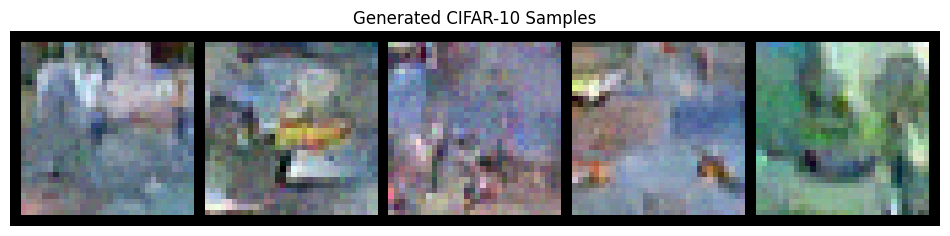

  Step 1050/1250, Loss: 0.1047
  Step 1100/1250, Loss: 0.0717
  Step 1150/1250, Loss: 0.1192
  Step 1200/1250, Loss: 0.0854
  Generating samples...


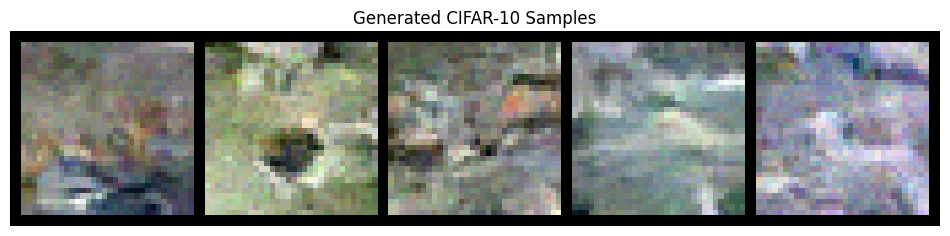


Training - Epoch 14 average loss: 0.1015
Running validation...
Validation - Epoch 14 average loss: 0.1021
Learning rate: 0.001000
Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.1021)

Epoch 15/50
--------------------
  Step 0/1250, Loss: 0.0832
  Step 50/1250, Loss: 0.0968
  Step 100/1250, Loss: 0.0832
  Step 150/1250, Loss: 0.0592
  Step 200/1250, Loss: 0.0847
  Generating samples...


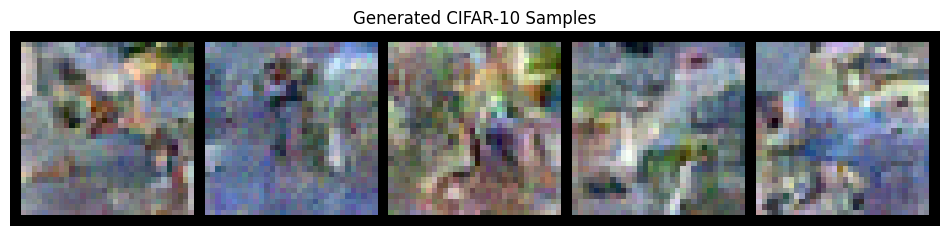

  Step 250/1250, Loss: 0.0928
  Step 300/1250, Loss: 0.1438
  Step 350/1250, Loss: 0.0843
  Step 400/1250, Loss: 0.1312
  Generating samples...


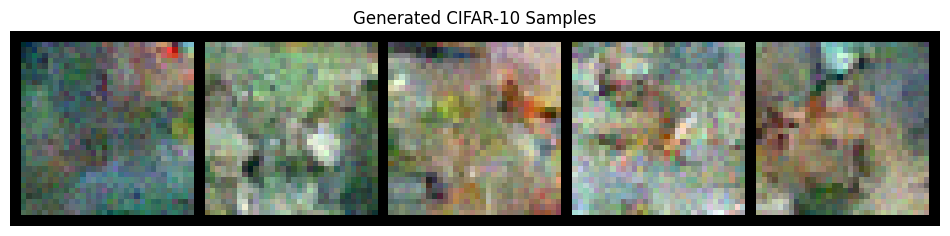

  Step 450/1250, Loss: 0.0774
  Step 500/1250, Loss: 0.0845
  Step 550/1250, Loss: 0.1331
  Step 600/1250, Loss: 0.1504
  Generating samples...


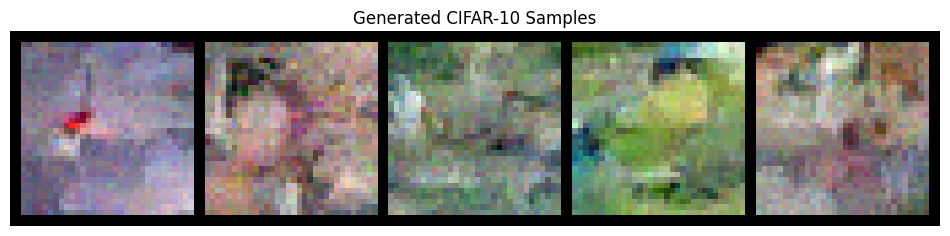

  Step 650/1250, Loss: 0.1077
  Step 700/1250, Loss: 0.1604
  Step 750/1250, Loss: 0.1266
  Step 800/1250, Loss: 0.1124
  Generating samples...


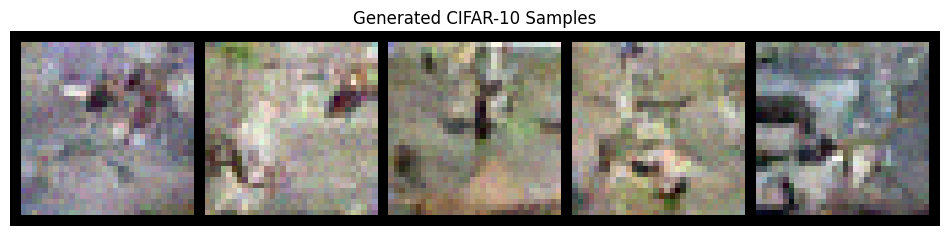

  Step 850/1250, Loss: 0.0891
  Step 900/1250, Loss: 0.0910
  Step 950/1250, Loss: 0.1310
  Step 1000/1250, Loss: 0.1073
  Generating samples...


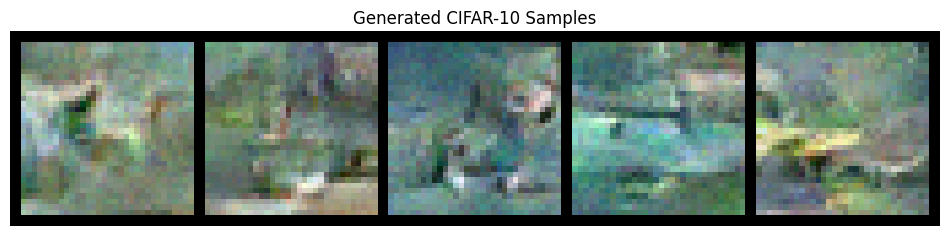

  Step 1050/1250, Loss: 0.1156
  Step 1100/1250, Loss: 0.1017
  Step 1150/1250, Loss: 0.1027
  Step 1200/1250, Loss: 0.1173
  Generating samples...


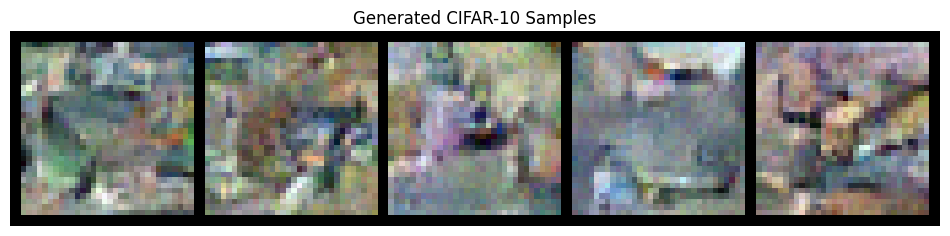


Training - Epoch 15 average loss: 0.1015
Running validation...
Validation - Epoch 15 average loss: 0.1021
Learning rate: 0.001000

Generating samples for visual progress check...


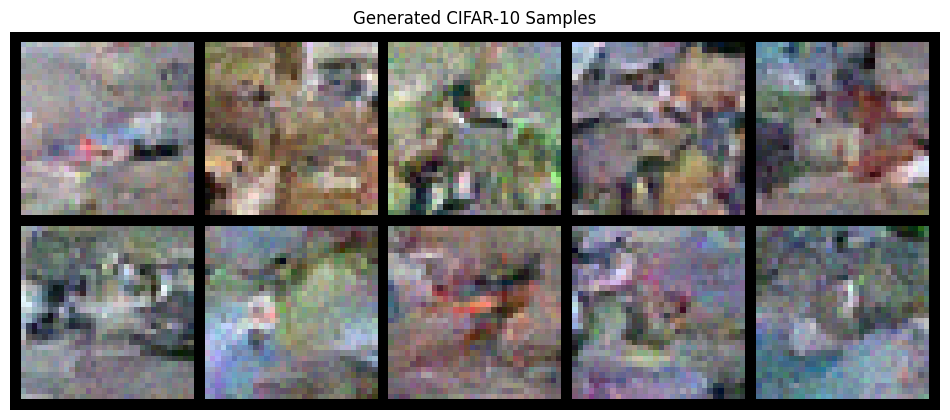

No improvement for 1/15 epochs

Epoch 16/50
--------------------
  Step 0/1250, Loss: 0.0757
  Step 50/1250, Loss: 0.1224
  Step 100/1250, Loss: 0.0985
  Step 150/1250, Loss: 0.1186
  Step 200/1250, Loss: 0.0988
  Generating samples...


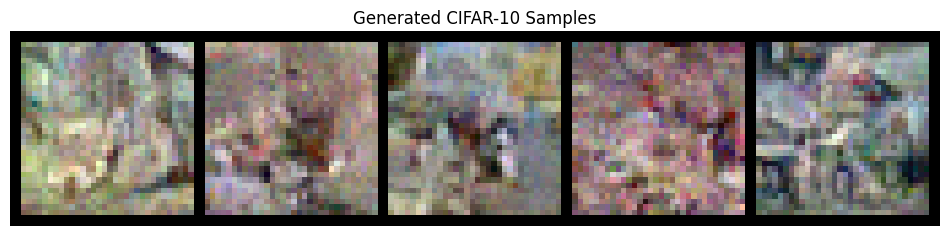

  Step 250/1250, Loss: 0.1263
  Step 300/1250, Loss: 0.0738
  Step 350/1250, Loss: 0.1268
  Step 400/1250, Loss: 0.1041
  Generating samples...


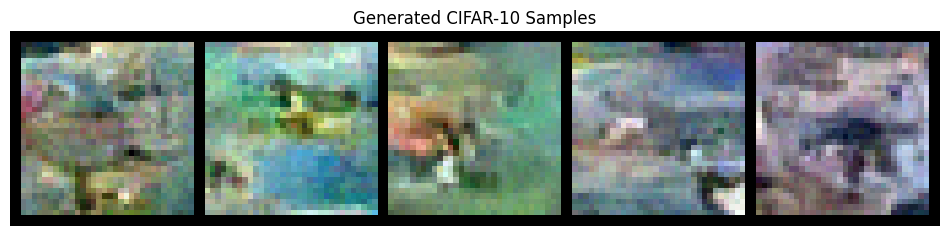

  Step 450/1250, Loss: 0.1204
  Step 500/1250, Loss: 0.1286
  Step 550/1250, Loss: 0.1279
  Step 600/1250, Loss: 0.0916
  Generating samples...


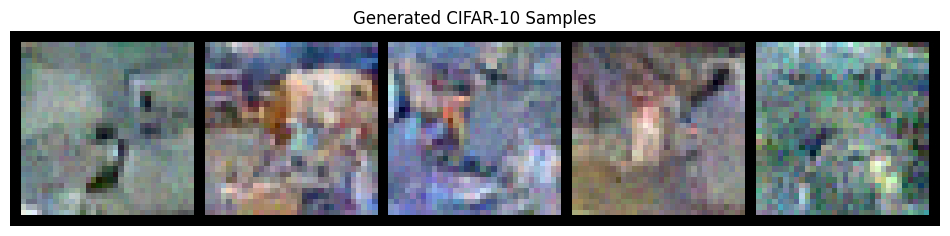

  Step 650/1250, Loss: 0.1059
  Step 700/1250, Loss: 0.0804
  Step 750/1250, Loss: 0.0937
  Step 800/1250, Loss: 0.0747
  Generating samples...


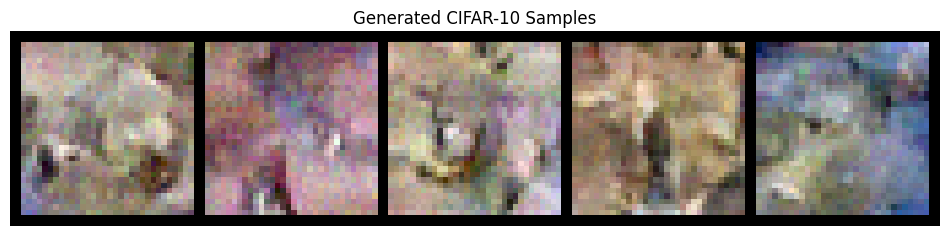

  Step 850/1250, Loss: 0.0858
  Step 900/1250, Loss: 0.1096
  Step 950/1250, Loss: 0.1161
  Step 1000/1250, Loss: 0.1086
  Generating samples...


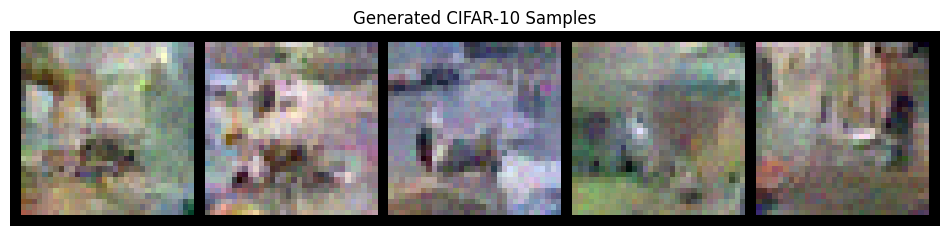

  Step 1050/1250, Loss: 0.1517
  Step 1100/1250, Loss: 0.1070
  Step 1150/1250, Loss: 0.1078
  Step 1200/1250, Loss: 0.0967
  Generating samples...


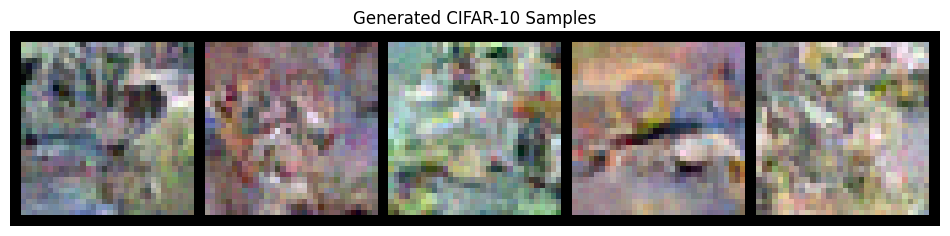


Training - Epoch 16 average loss: 0.1009
Running validation...
Validation - Epoch 16 average loss: 0.1003
Learning rate: 0.001000
Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.1003)


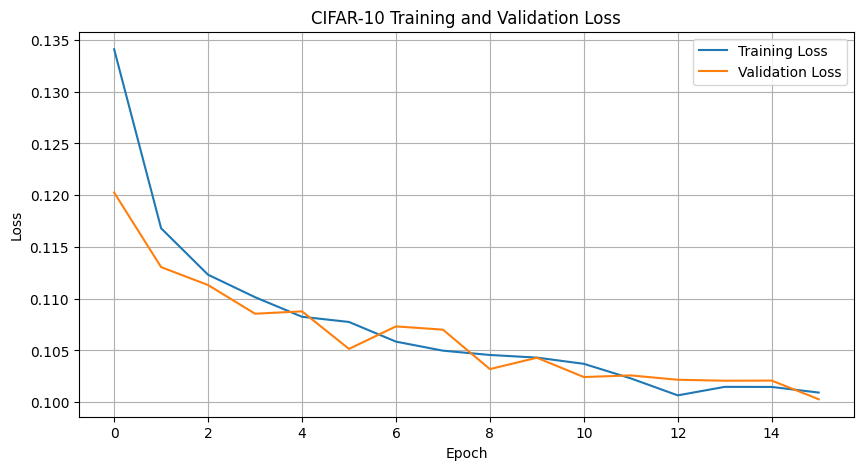


Epoch 17/50
--------------------
  Step 0/1250, Loss: 0.1245
  Step 50/1250, Loss: 0.1090
  Step 100/1250, Loss: 0.0705
  Step 150/1250, Loss: 0.1090
  Step 200/1250, Loss: 0.0765
  Generating samples...


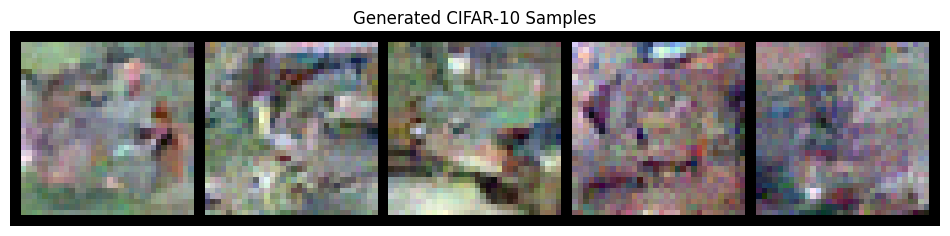

  Step 250/1250, Loss: 0.0927
  Step 300/1250, Loss: 0.1021
  Step 350/1250, Loss: 0.0923
  Step 400/1250, Loss: 0.0971
  Generating samples...


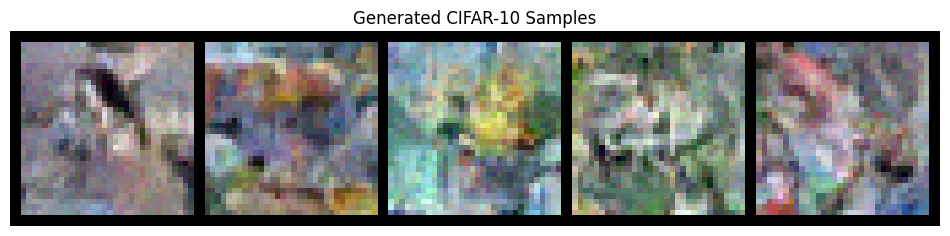

  Step 450/1250, Loss: 0.1093
  Step 500/1250, Loss: 0.1043
  Step 550/1250, Loss: 0.1077
  Step 600/1250, Loss: 0.1037
  Generating samples...


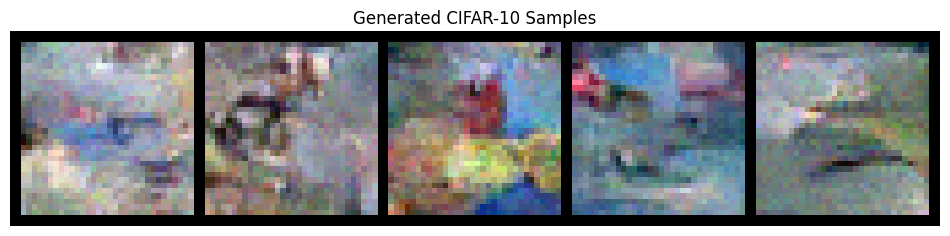

  Step 650/1250, Loss: 0.1034
  Step 700/1250, Loss: 0.0628
  Step 750/1250, Loss: 0.0764
  Step 800/1250, Loss: 0.0915
  Generating samples...


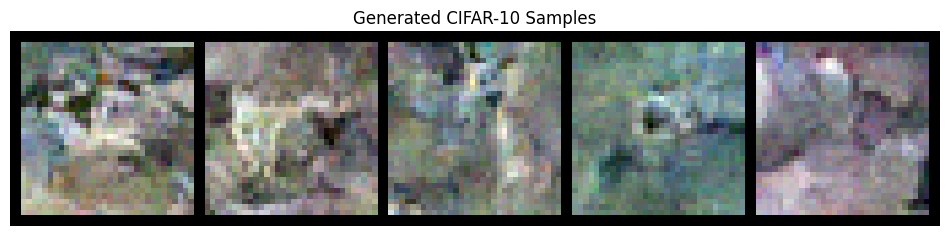

  Step 850/1250, Loss: 0.0981
  Step 900/1250, Loss: 0.1239
  Step 950/1250, Loss: 0.0853
  Step 1000/1250, Loss: 0.1006
  Generating samples...


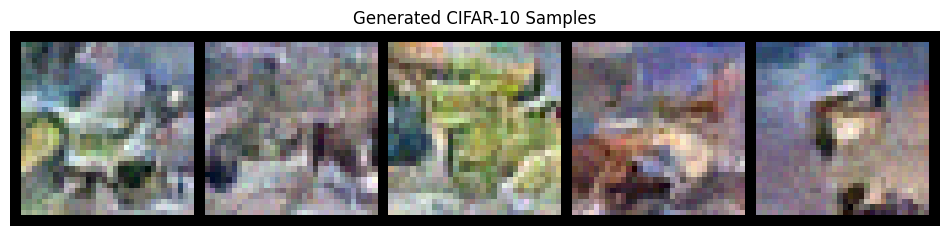

  Step 1050/1250, Loss: 0.1187
  Step 1100/1250, Loss: 0.0900
  Step 1150/1250, Loss: 0.1485
  Step 1200/1250, Loss: 0.0832
  Generating samples...


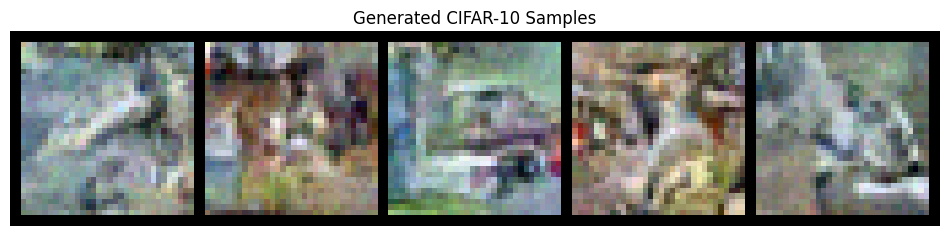


Training - Epoch 17 average loss: 0.1015
Running validation...
Validation - Epoch 17 average loss: 0.1002
Learning rate: 0.001000

Generating samples for visual progress check...


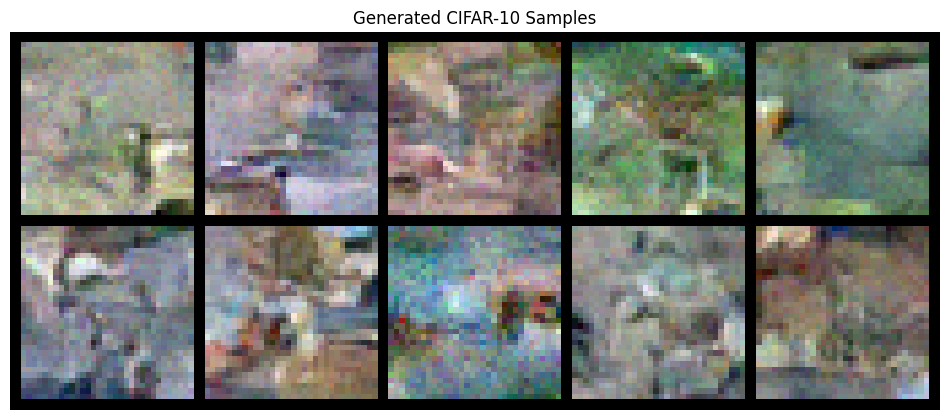

Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.1002)

Epoch 18/50
--------------------
  Step 0/1250, Loss: 0.1081
  Step 50/1250, Loss: 0.1186
  Step 100/1250, Loss: 0.1169
  Step 150/1250, Loss: 0.0948
  Step 200/1250, Loss: 0.1091
  Generating samples...


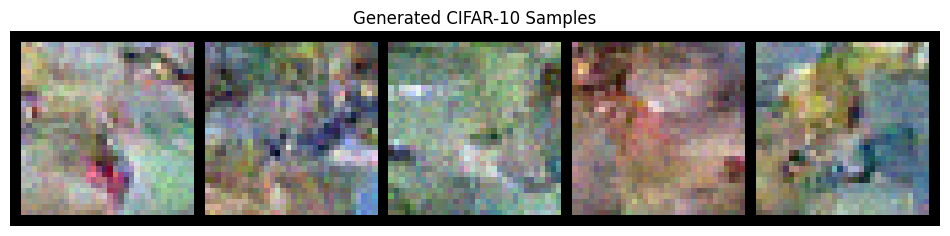

  Step 250/1250, Loss: 0.1021
  Step 300/1250, Loss: 0.0840
  Step 350/1250, Loss: 0.0852
  Step 400/1250, Loss: 0.1124
  Generating samples...


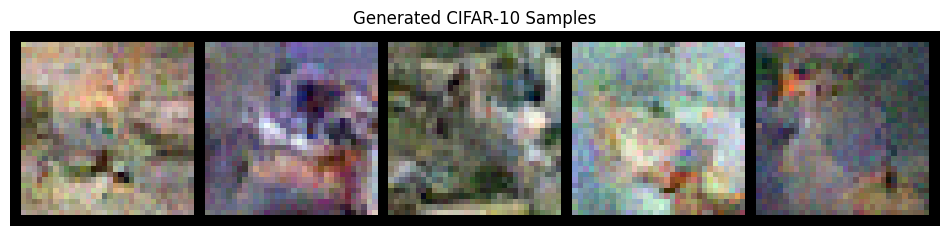

  Step 450/1250, Loss: 0.1246
  Step 500/1250, Loss: 0.0818
  Step 550/1250, Loss: 0.1143
  Step 600/1250, Loss: 0.1022
  Generating samples...


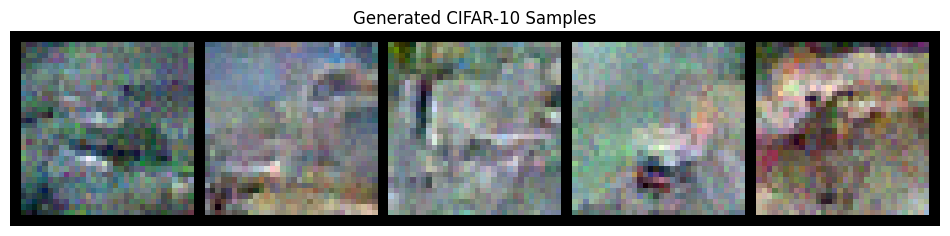

  Step 650/1250, Loss: 0.1069
  Step 700/1250, Loss: 0.0846
  Step 750/1250, Loss: 0.0627
  Step 800/1250, Loss: 0.1397
  Generating samples...


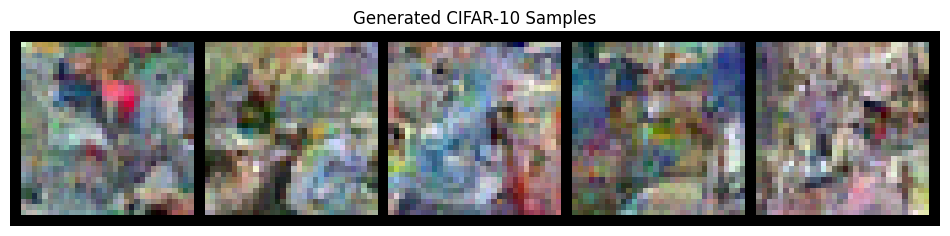

  Step 850/1250, Loss: 0.0639
  Step 900/1250, Loss: 0.0953
  Step 950/1250, Loss: 0.1235
  Step 1000/1250, Loss: 0.1126
  Generating samples...


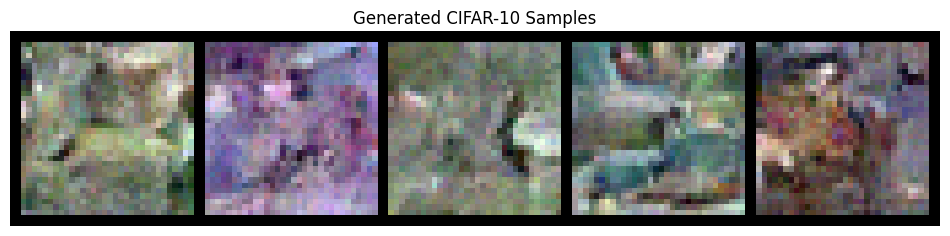

  Step 1050/1250, Loss: 0.0896
  Step 1100/1250, Loss: 0.0867
  Step 1150/1250, Loss: 0.1349
  Step 1200/1250, Loss: 0.0747
  Generating samples...


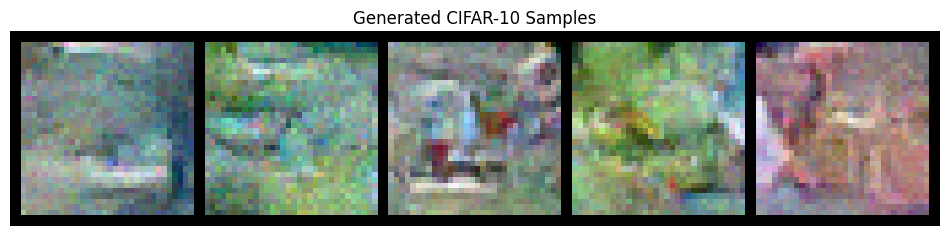


Training - Epoch 18 average loss: 0.1006
Running validation...
Validation - Epoch 18 average loss: 0.1028
Learning rate: 0.001000
No improvement for 1/15 epochs

Epoch 19/50
--------------------
  Step 0/1250, Loss: 0.0934
  Step 50/1250, Loss: 0.0959
  Step 100/1250, Loss: 0.0894
  Step 150/1250, Loss: 0.0846
  Step 200/1250, Loss: 0.0903
  Generating samples...


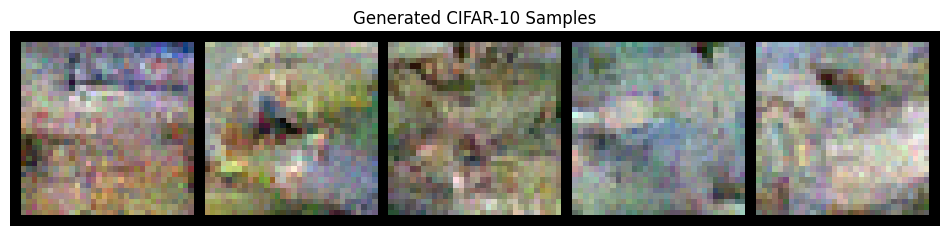

  Step 250/1250, Loss: 0.1424
  Step 300/1250, Loss: 0.1074
  Step 350/1250, Loss: 0.0641
  Step 400/1250, Loss: 0.1104
  Generating samples...


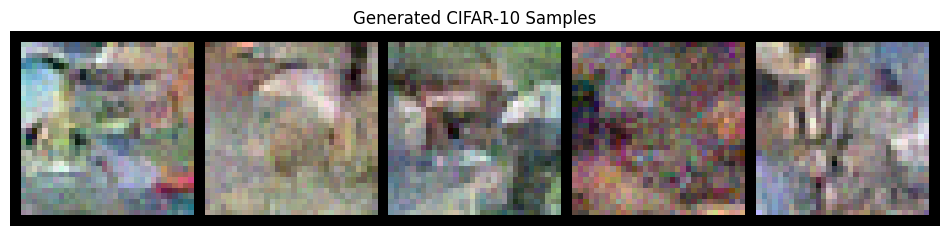

  Step 450/1250, Loss: 0.0974
  Step 500/1250, Loss: 0.0747
  Step 550/1250, Loss: 0.0890
  Step 600/1250, Loss: 0.0978
  Generating samples...


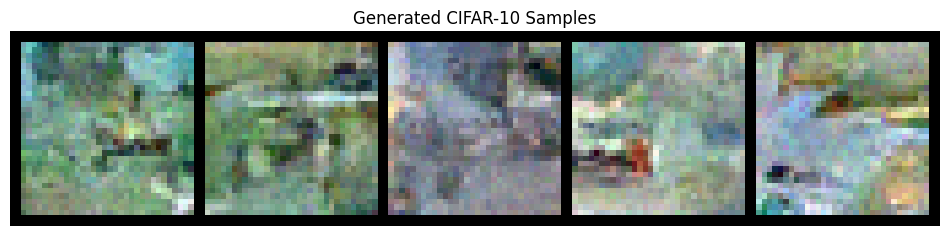

  Step 650/1250, Loss: 0.1071
  Step 700/1250, Loss: 0.1248
  Step 750/1250, Loss: 0.0945
  Step 800/1250, Loss: 0.1071
  Generating samples...


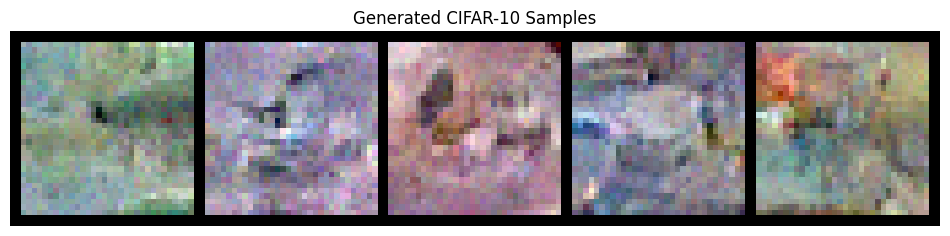

  Step 850/1250, Loss: 0.1452
  Step 900/1250, Loss: 0.0908
  Step 950/1250, Loss: 0.0968
  Step 1000/1250, Loss: 0.0901
  Generating samples...


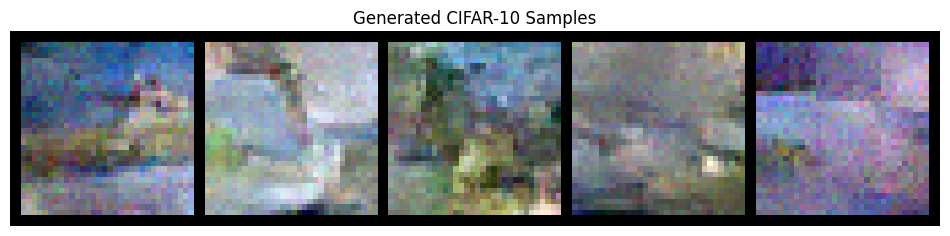

  Step 1050/1250, Loss: 0.0994
  Step 1100/1250, Loss: 0.1184
  Step 1150/1250, Loss: 0.0889
  Step 1200/1250, Loss: 0.1013
  Generating samples...


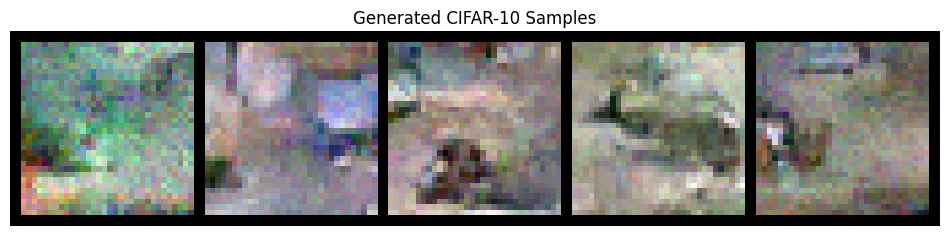


Training - Epoch 19 average loss: 0.1012
Running validation...
Validation - Epoch 19 average loss: 0.1012
Learning rate: 0.001000

Generating samples for visual progress check...


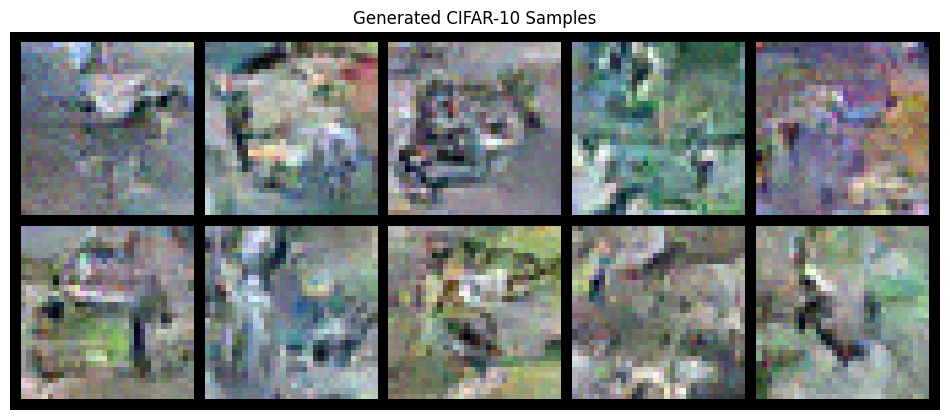

No improvement for 2/15 epochs

Epoch 20/50
--------------------
  Step 0/1250, Loss: 0.1171
  Step 50/1250, Loss: 0.1132
  Step 100/1250, Loss: 0.0847
  Step 150/1250, Loss: 0.0782
  Step 200/1250, Loss: 0.1415
  Generating samples...


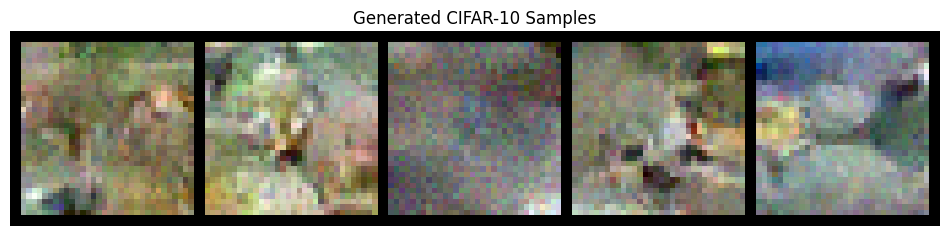

  Step 250/1250, Loss: 0.1155
  Step 300/1250, Loss: 0.1004
  Step 350/1250, Loss: 0.1303
  Step 400/1250, Loss: 0.1337
  Generating samples...


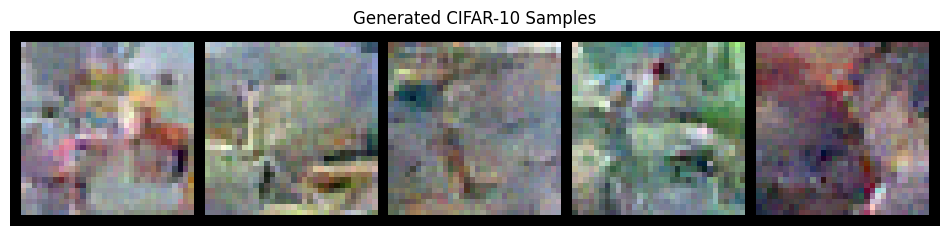

  Step 450/1250, Loss: 0.0664
  Step 500/1250, Loss: 0.0929
  Step 550/1250, Loss: 0.1105
  Step 600/1250, Loss: 0.0790
  Generating samples...


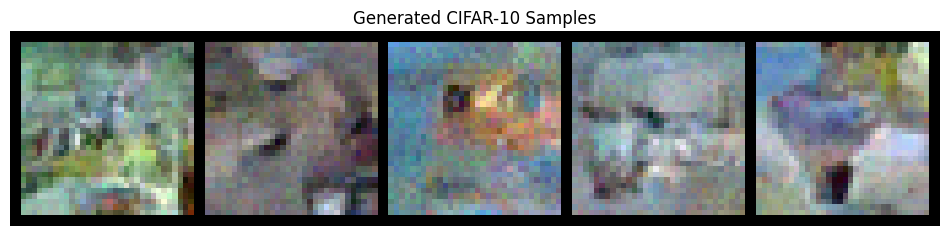

  Step 650/1250, Loss: 0.0893
  Step 700/1250, Loss: 0.1027
  Step 750/1250, Loss: 0.1192
  Step 800/1250, Loss: 0.0872
  Generating samples...


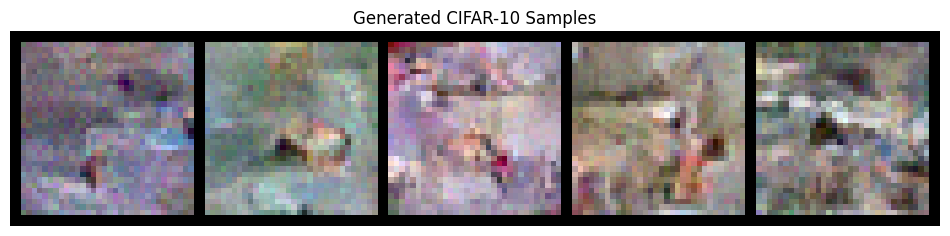

  Step 850/1250, Loss: 0.0820
  Step 900/1250, Loss: 0.1060
  Step 950/1250, Loss: 0.1187
  Step 1000/1250, Loss: 0.1578
  Generating samples...


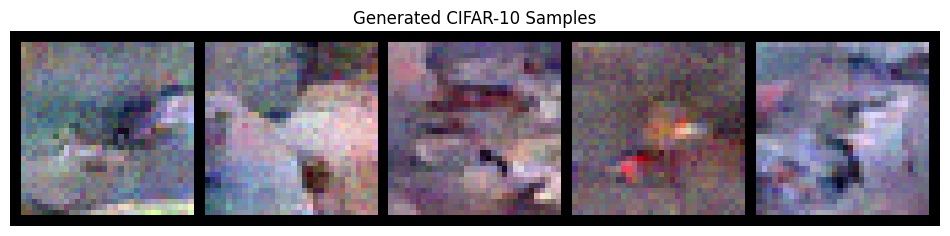

  Step 1050/1250, Loss: 0.0921
  Step 1100/1250, Loss: 0.0994
  Step 1150/1250, Loss: 0.0882
  Step 1200/1250, Loss: 0.1046
  Generating samples...


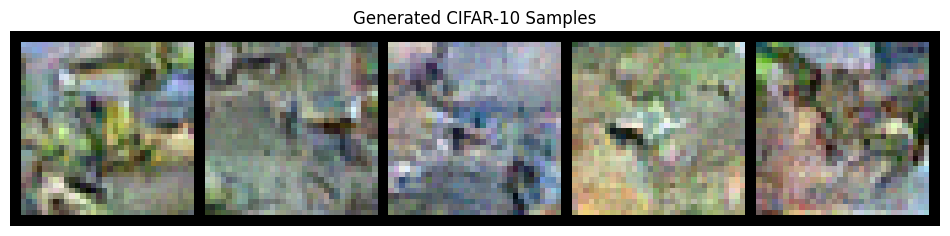


Training - Epoch 20 average loss: 0.1015
Running validation...
Validation - Epoch 20 average loss: 0.1001
Learning rate: 0.001000
Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.1001)

Epoch 21/50
--------------------
  Step 0/1250, Loss: 0.0985
  Step 50/1250, Loss: 0.0916
  Step 100/1250, Loss: 0.0889
  Step 150/1250, Loss: 0.0940
  Step 200/1250, Loss: 0.0727
  Generating samples...


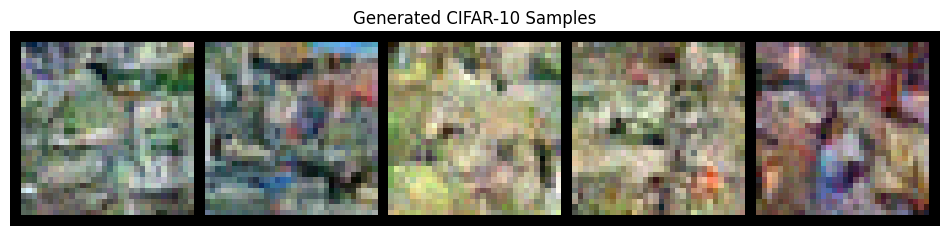

  Step 250/1250, Loss: 0.0681
  Step 300/1250, Loss: 0.0788
  Step 350/1250, Loss: 0.0945
  Step 400/1250, Loss: 0.0886
  Generating samples...


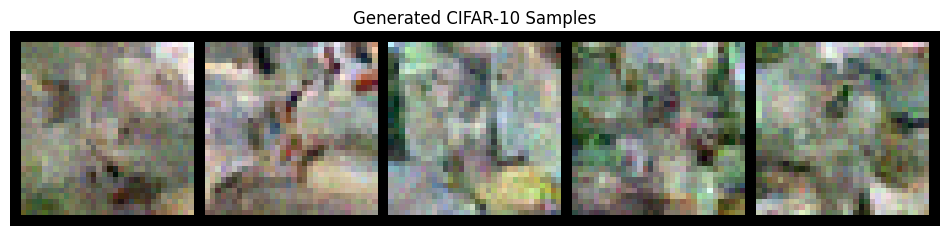

  Step 450/1250, Loss: 0.0781
  Step 500/1250, Loss: 0.0800
  Step 550/1250, Loss: 0.0755
  Step 600/1250, Loss: 0.0957
  Generating samples...


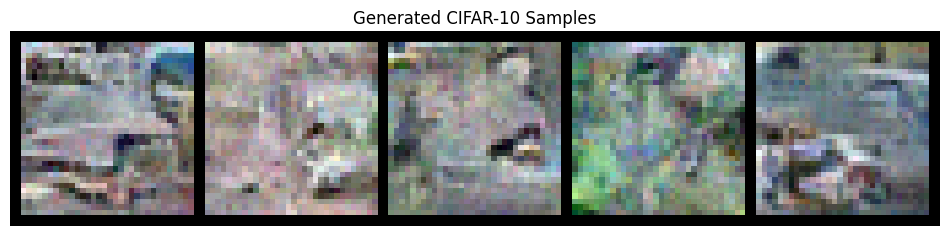

  Step 650/1250, Loss: 0.0605
  Step 700/1250, Loss: 0.0915
  Step 750/1250, Loss: 0.1152
  Step 800/1250, Loss: 0.1133
  Generating samples...


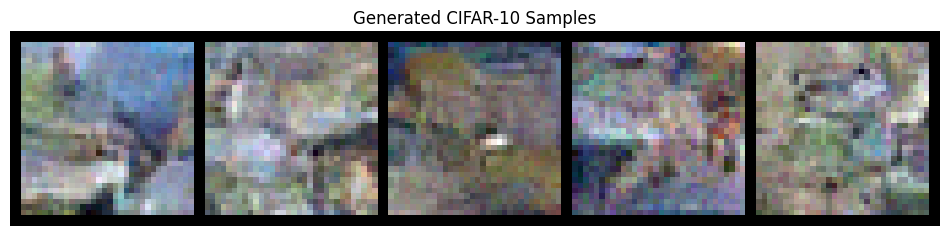

  Step 850/1250, Loss: 0.1089
  Step 900/1250, Loss: 0.0869
  Step 950/1250, Loss: 0.1152
  Step 1000/1250, Loss: 0.1202
  Generating samples...


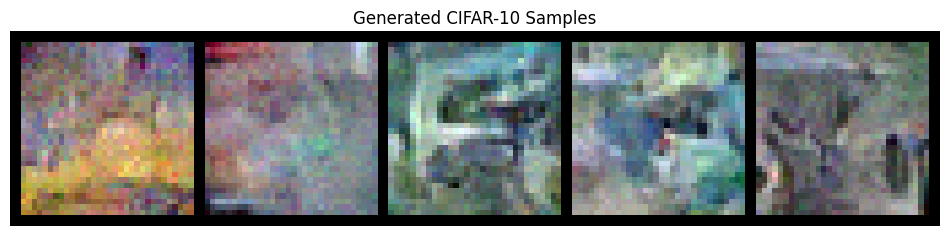

  Step 1050/1250, Loss: 0.1006
  Step 1100/1250, Loss: 0.1202
  Step 1150/1250, Loss: 0.1109
  Step 1200/1250, Loss: 0.1002
  Generating samples...


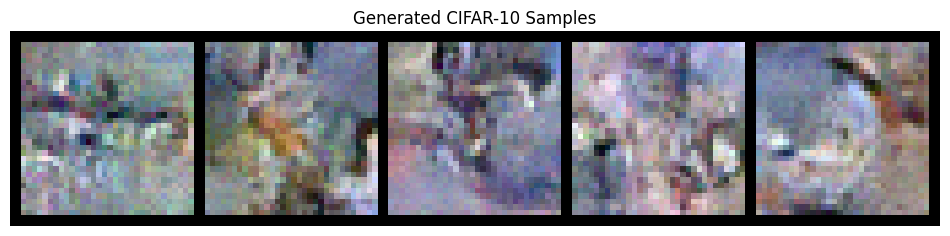


Training - Epoch 21 average loss: 0.1004
Running validation...
Validation - Epoch 21 average loss: 0.0995
Learning rate: 0.001000

Generating samples for visual progress check...


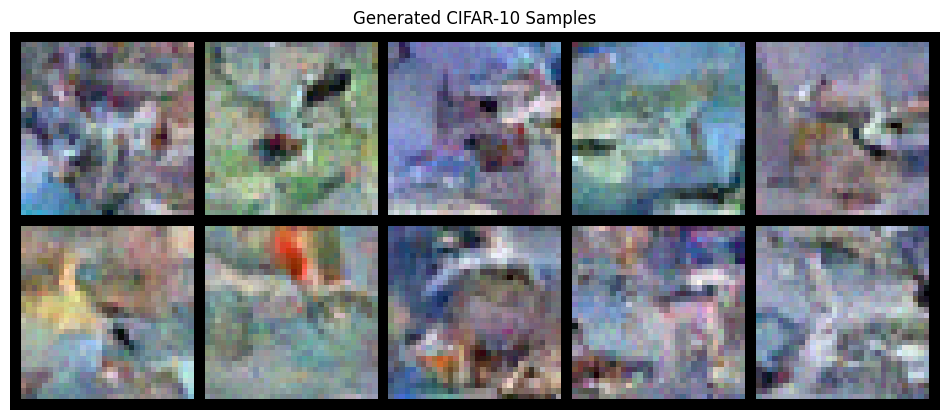

Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.0995)


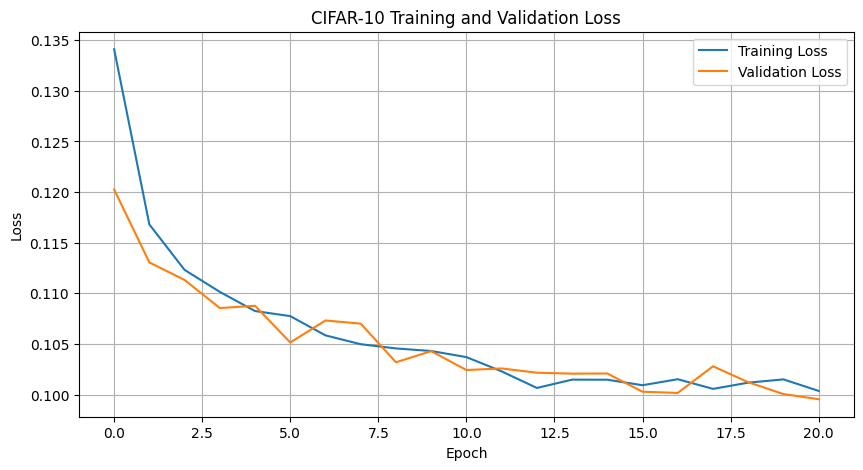


Epoch 22/50
--------------------
  Step 0/1250, Loss: 0.1163
  Step 50/1250, Loss: 0.1059
  Step 100/1250, Loss: 0.1058
  Step 150/1250, Loss: 0.1220
  Step 200/1250, Loss: 0.1589
  Generating samples...


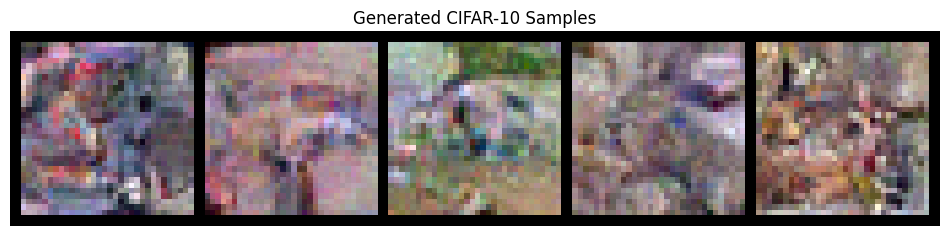

  Step 250/1250, Loss: 0.1239
  Step 300/1250, Loss: 0.0950
  Step 350/1250, Loss: 0.0889
  Step 400/1250, Loss: 0.0703
  Generating samples...


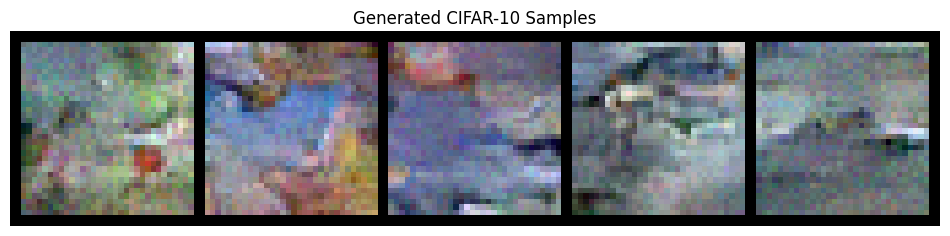

  Step 450/1250, Loss: 0.1317
  Step 500/1250, Loss: 0.0980
  Step 550/1250, Loss: 0.1041
  Step 600/1250, Loss: 0.1164
  Generating samples...


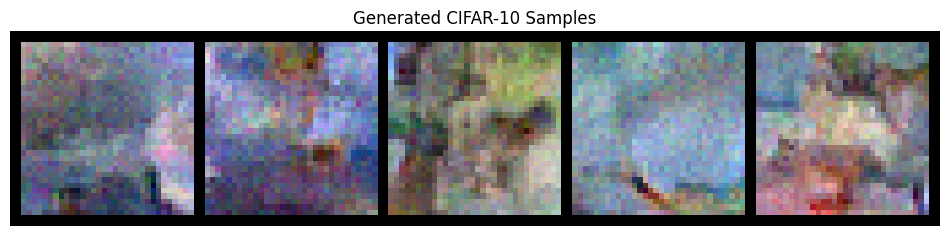

  Step 650/1250, Loss: 0.0772
  Step 700/1250, Loss: 0.1175
  Step 750/1250, Loss: 0.1094
  Step 800/1250, Loss: 0.1153
  Generating samples...


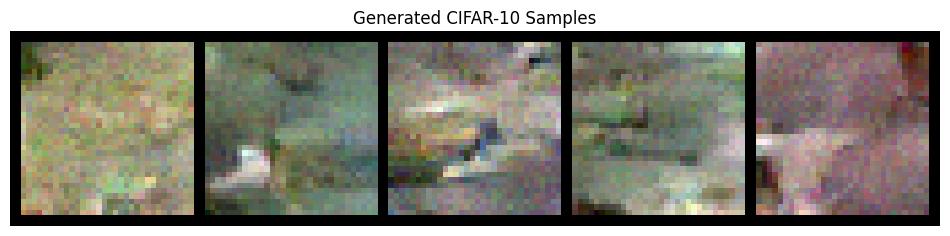

  Step 850/1250, Loss: 0.1095
  Step 900/1250, Loss: 0.1051
  Step 950/1250, Loss: 0.1192
  Step 1000/1250, Loss: 0.1147
  Generating samples...


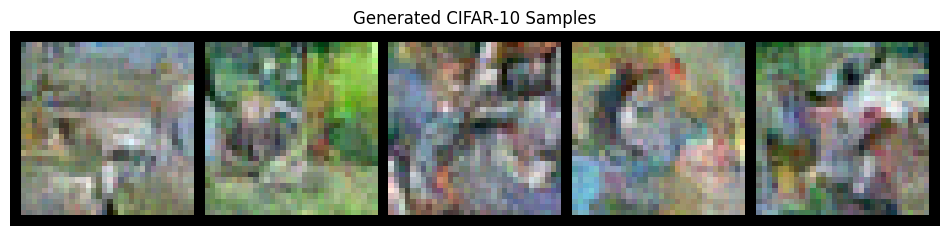

  Step 1050/1250, Loss: 0.1048
  Step 1100/1250, Loss: 0.0819
  Step 1150/1250, Loss: 0.0807
  Step 1200/1250, Loss: 0.0840
  Generating samples...


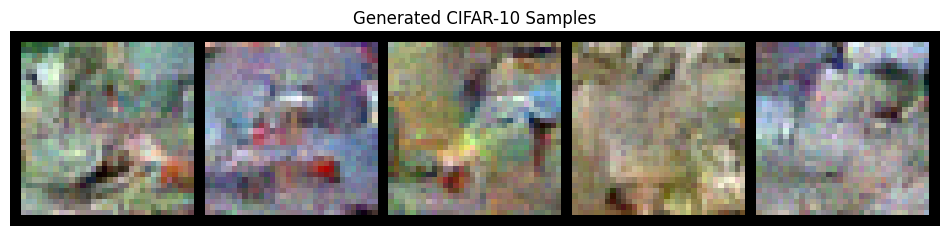


Training - Epoch 22 average loss: 0.1017
Running validation...
Validation - Epoch 22 average loss: 0.1000
Learning rate: 0.001000
No improvement for 1/15 epochs

Epoch 23/50
--------------------
  Step 0/1250, Loss: 0.0950
  Step 50/1250, Loss: 0.1177
  Step 100/1250, Loss: 0.0682
  Step 150/1250, Loss: 0.1169
  Step 200/1250, Loss: 0.0924
  Generating samples...


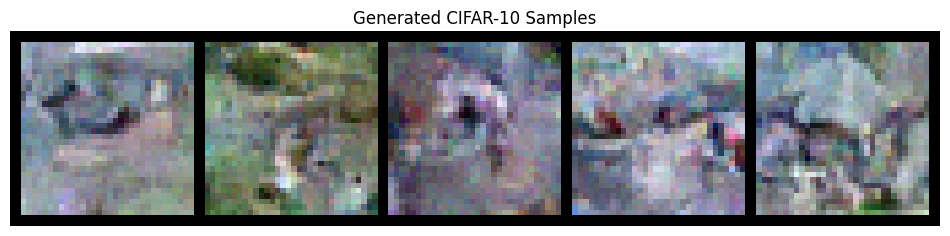

  Step 250/1250, Loss: 0.1190
  Step 300/1250, Loss: 0.1158
  Step 350/1250, Loss: 0.1023
  Step 400/1250, Loss: 0.1194
  Generating samples...


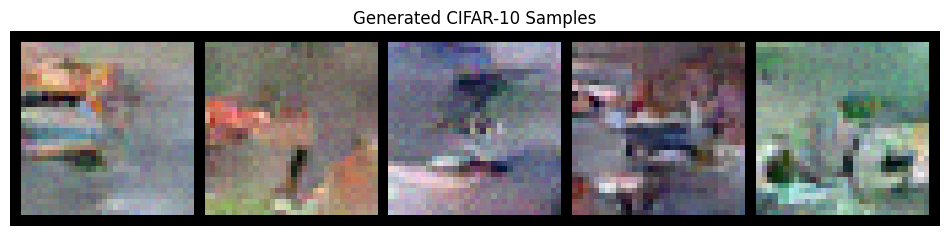

  Step 450/1250, Loss: 0.0954
  Step 500/1250, Loss: 0.0969
  Step 550/1250, Loss: 0.0840
  Step 600/1250, Loss: 0.1105
  Generating samples...


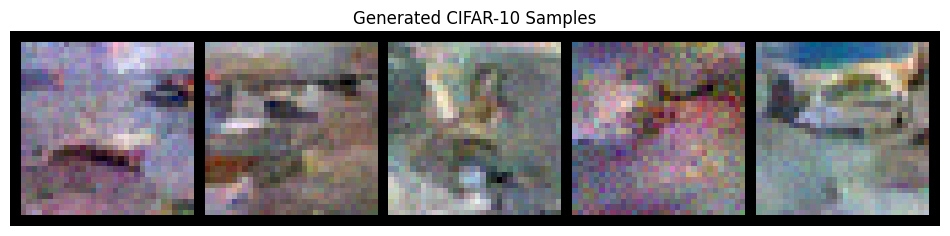

  Step 650/1250, Loss: 0.0760
  Step 700/1250, Loss: 0.1209
  Step 750/1250, Loss: 0.0977
  Step 800/1250, Loss: 0.0684
  Generating samples...


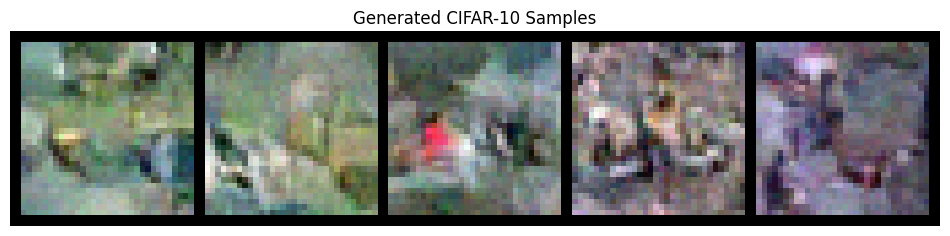

  Step 850/1250, Loss: 0.0892
  Step 900/1250, Loss: 0.0842
  Step 950/1250, Loss: 0.0899
  Step 1000/1250, Loss: 0.1400
  Generating samples...


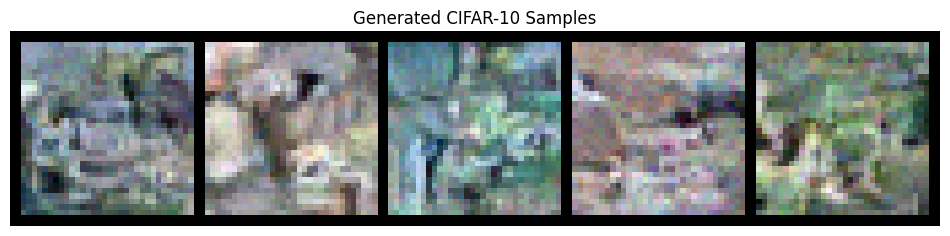

  Step 1050/1250, Loss: 0.1047
  Step 1100/1250, Loss: 0.0902
  Step 1150/1250, Loss: 0.1028
  Step 1200/1250, Loss: 0.1104
  Generating samples...


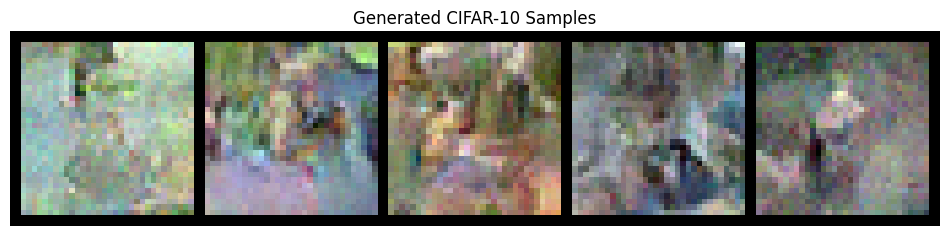


Training - Epoch 23 average loss: 0.1001
Running validation...
Validation - Epoch 23 average loss: 0.1004
Learning rate: 0.001000

Generating samples for visual progress check...


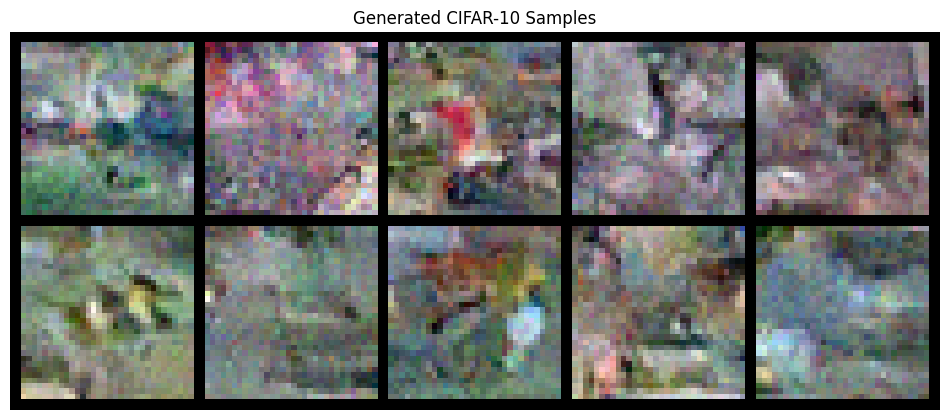

No improvement for 2/15 epochs

Epoch 24/50
--------------------
  Step 0/1250, Loss: 0.0975
  Step 50/1250, Loss: 0.0832
  Step 100/1250, Loss: 0.0818
  Step 150/1250, Loss: 0.0979
  Step 200/1250, Loss: 0.1090
  Generating samples...


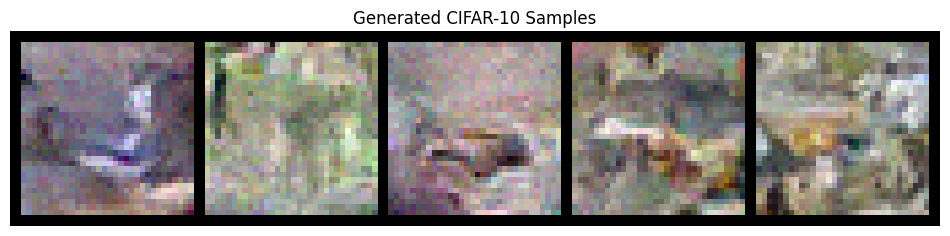

  Step 250/1250, Loss: 0.1221
  Step 300/1250, Loss: 0.1082
  Step 350/1250, Loss: 0.1431
  Step 400/1250, Loss: 0.0888
  Generating samples...


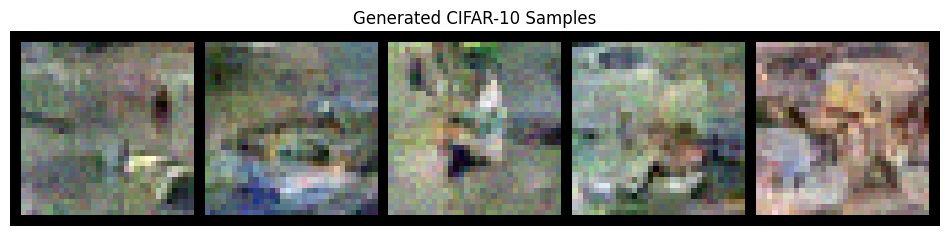

  Step 450/1250, Loss: 0.1044
  Step 500/1250, Loss: 0.1026
  Step 550/1250, Loss: 0.1123
  Step 600/1250, Loss: 0.0970
  Generating samples...


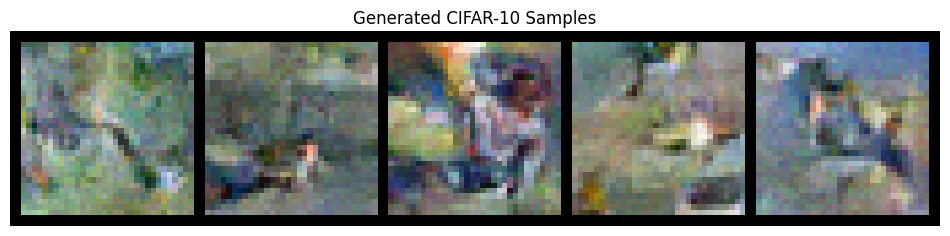

  Step 650/1250, Loss: 0.0909
  Step 700/1250, Loss: 0.0999
  Step 750/1250, Loss: 0.1105
  Step 800/1250, Loss: 0.1153
  Generating samples...


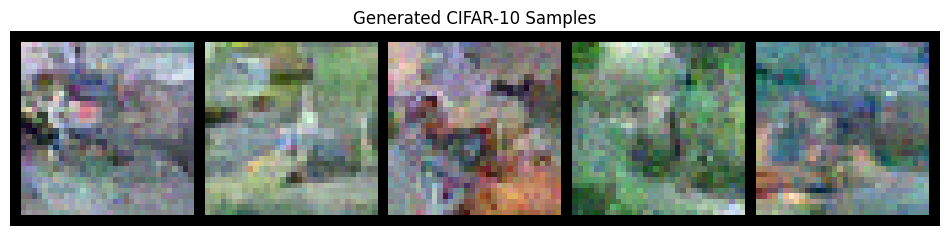

  Step 850/1250, Loss: 0.0756
  Step 900/1250, Loss: 0.0994
  Step 950/1250, Loss: 0.0979
  Step 1000/1250, Loss: 0.0842
  Generating samples...


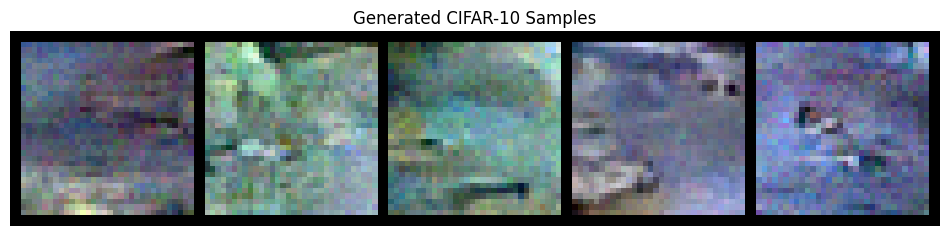

  Step 1050/1250, Loss: 0.0978
  Step 1100/1250, Loss: 0.0935
  Step 1150/1250, Loss: 0.1145
  Step 1200/1250, Loss: 0.1084
  Generating samples...


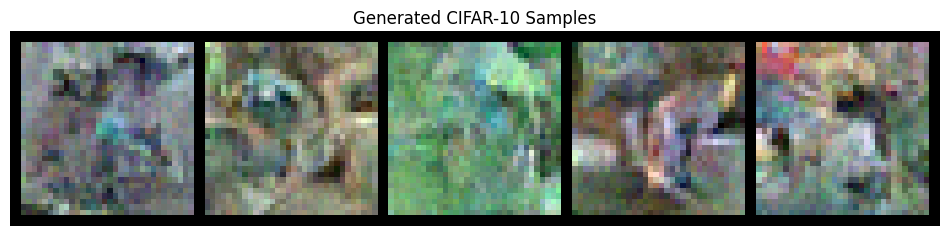


Training - Epoch 24 average loss: 0.1005
Running validation...
Validation - Epoch 24 average loss: 0.1029
Learning rate: 0.001000
No improvement for 3/15 epochs

Epoch 25/50
--------------------
  Step 0/1250, Loss: 0.1112
  Step 50/1250, Loss: 0.0743
  Step 100/1250, Loss: 0.1301
  Step 150/1250, Loss: 0.1214
  Step 200/1250, Loss: 0.0867
  Generating samples...


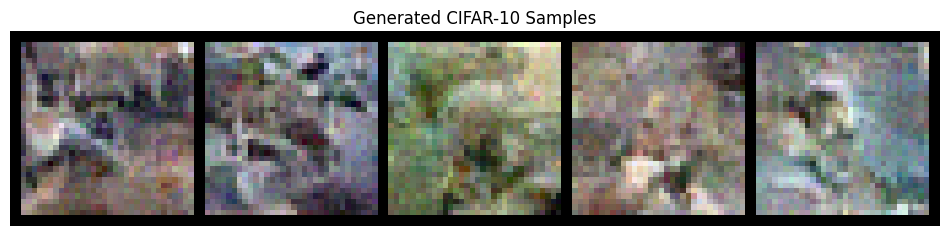

  Step 250/1250, Loss: 0.1457
  Step 300/1250, Loss: 0.1068
  Step 350/1250, Loss: 0.0777
  Step 400/1250, Loss: 0.0981
  Generating samples...


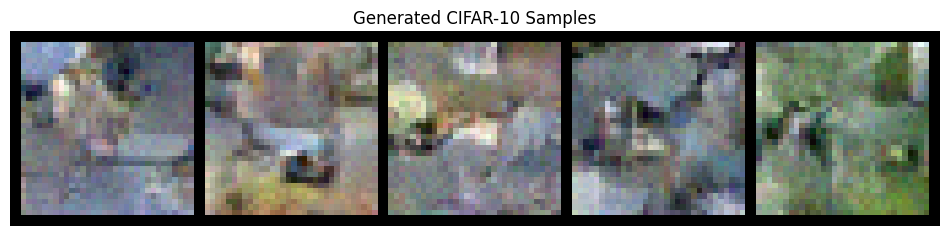

  Step 450/1250, Loss: 0.1042
  Step 500/1250, Loss: 0.0951
  Step 550/1250, Loss: 0.0745
  Step 600/1250, Loss: 0.0932
  Generating samples...


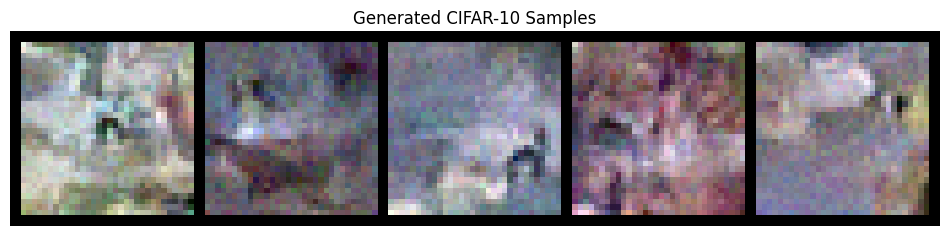

  Step 650/1250, Loss: 0.0740
  Step 700/1250, Loss: 0.0688
  Step 750/1250, Loss: 0.0704
  Step 800/1250, Loss: 0.0945
  Generating samples...


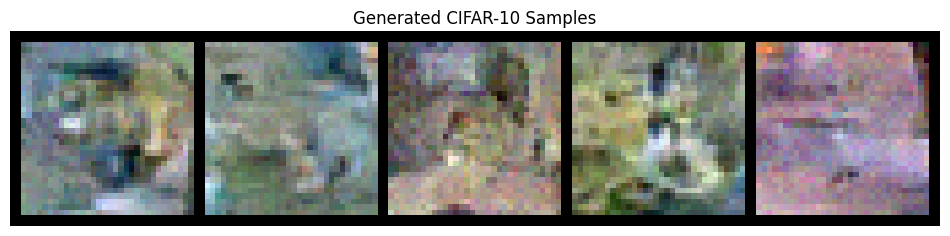

  Step 850/1250, Loss: 0.0953
  Step 900/1250, Loss: 0.1086
  Step 950/1250, Loss: 0.0738
  Step 1000/1250, Loss: 0.1022
  Generating samples...


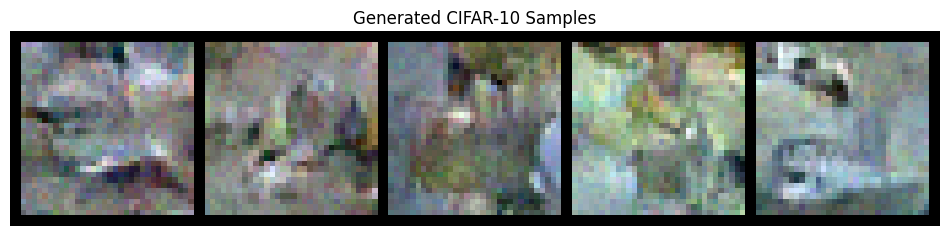

  Step 1050/1250, Loss: 0.1114
  Step 1100/1250, Loss: 0.1189
  Step 1150/1250, Loss: 0.0862
  Step 1200/1250, Loss: 0.0974
  Generating samples...


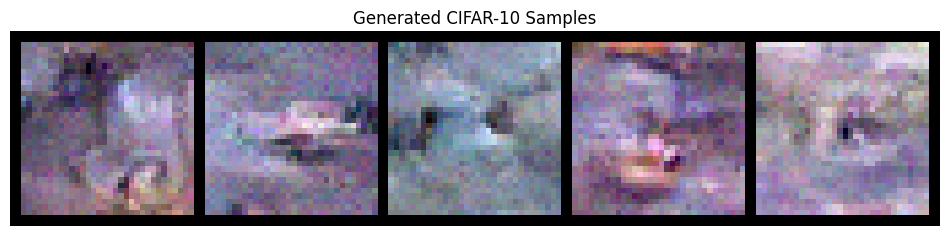


Training - Epoch 25 average loss: 0.1003
Running validation...
Validation - Epoch 25 average loss: 0.1005
Learning rate: 0.001000

Generating samples for visual progress check...


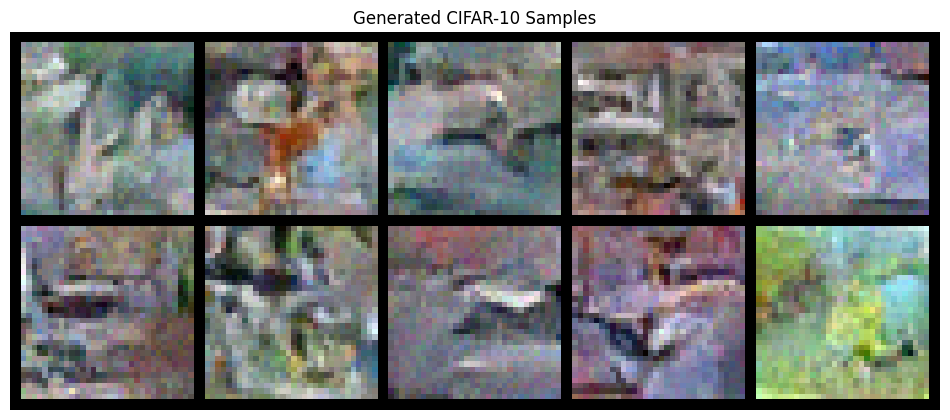

No improvement for 4/15 epochs

Epoch 26/50
--------------------
  Step 0/1250, Loss: 0.0993
  Step 50/1250, Loss: 0.1196
  Step 100/1250, Loss: 0.0728
  Step 150/1250, Loss: 0.0605
  Step 200/1250, Loss: 0.0762
  Generating samples...


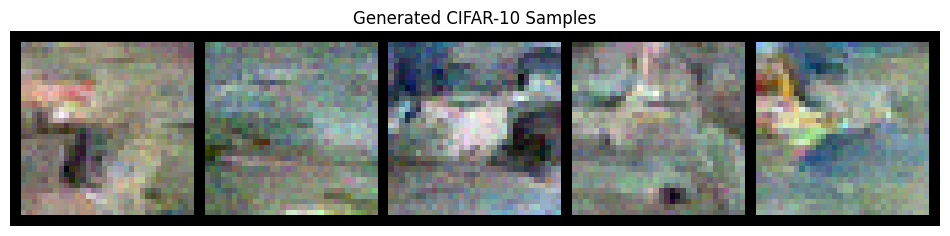

  Step 250/1250, Loss: 0.1026
  Step 300/1250, Loss: 0.1030
  Step 350/1250, Loss: 0.0915
  Step 400/1250, Loss: 0.1343
  Generating samples...


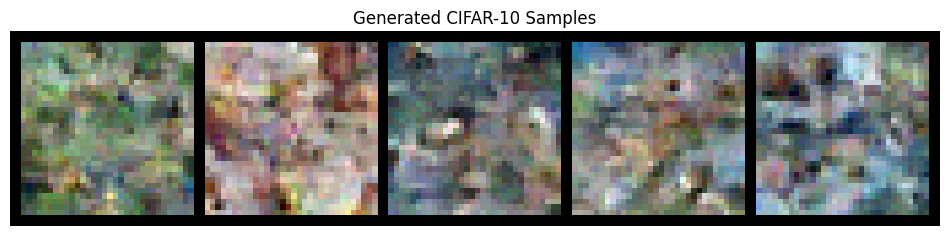

  Step 450/1250, Loss: 0.1280
  Step 500/1250, Loss: 0.0833
  Step 550/1250, Loss: 0.1039
  Step 600/1250, Loss: 0.0870
  Generating samples...


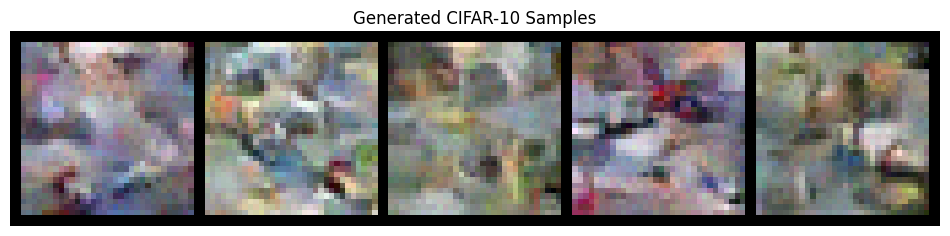

  Step 650/1250, Loss: 0.1240
  Step 700/1250, Loss: 0.0953
  Step 750/1250, Loss: 0.1214
  Step 800/1250, Loss: 0.0858
  Generating samples...


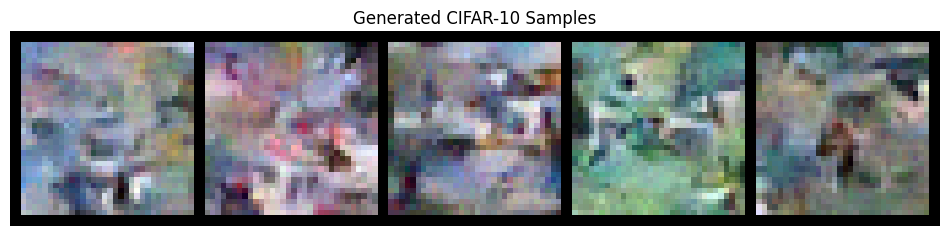

  Step 850/1250, Loss: 0.1016
  Step 900/1250, Loss: 0.0824
  Step 950/1250, Loss: 0.0745
  Step 1000/1250, Loss: 0.0877
  Generating samples...


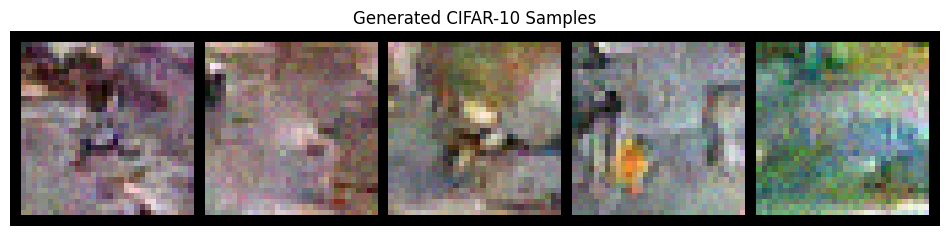

  Step 1050/1250, Loss: 0.0719
  Step 1100/1250, Loss: 0.1440
  Step 1150/1250, Loss: 0.0954
  Step 1200/1250, Loss: 0.1126
  Generating samples...


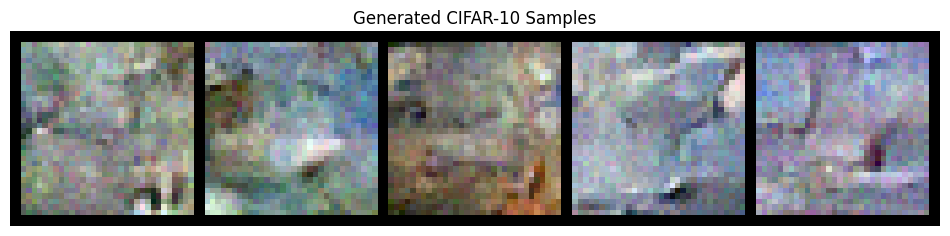


Training - Epoch 26 average loss: 0.1046
Running validation...
Validation - Epoch 26 average loss: 0.1028
Learning rate: 0.001000
No improvement for 5/15 epochs


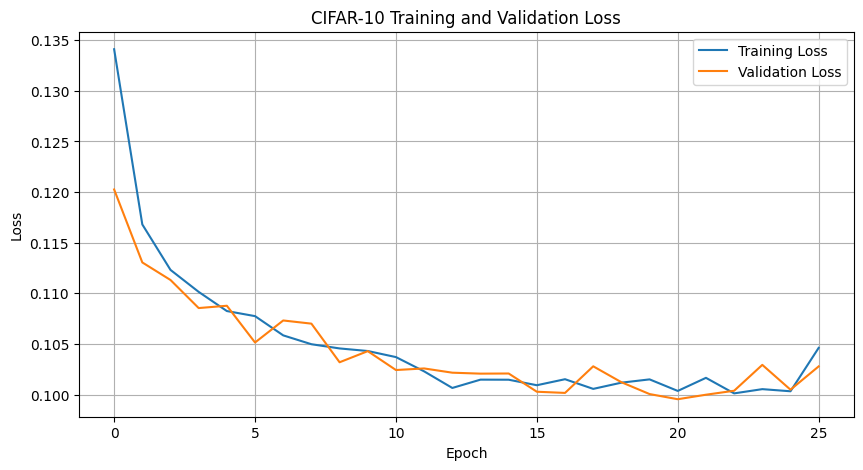


Epoch 27/50
--------------------
  Step 0/1250, Loss: 0.0691
  Step 50/1250, Loss: 0.1100
  Step 100/1250, Loss: 0.0794
  Step 150/1250, Loss: 0.0807
  Step 200/1250, Loss: 0.1114
  Generating samples...


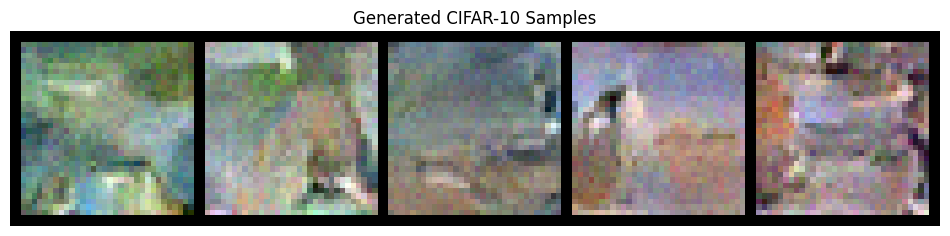

  Step 250/1250, Loss: 0.1268
  Step 300/1250, Loss: 0.0734
  Step 350/1250, Loss: 0.0908
  Step 400/1250, Loss: 0.0893
  Generating samples...


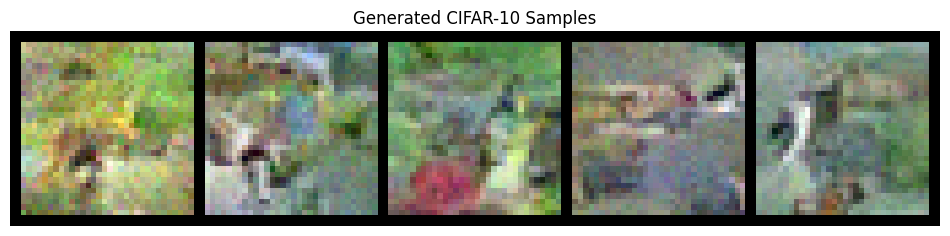

  Step 450/1250, Loss: 0.0826
  Step 500/1250, Loss: 0.0727
  Step 550/1250, Loss: 0.0876
  Step 600/1250, Loss: 0.0857
  Generating samples...


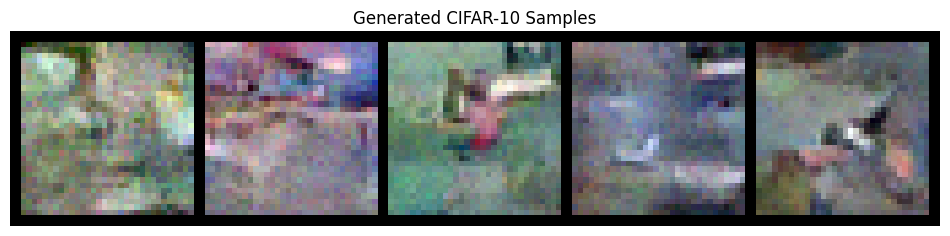

  Step 650/1250, Loss: 0.0980
  Step 700/1250, Loss: 0.0876
  Step 750/1250, Loss: 0.0980
  Step 800/1250, Loss: 0.0739
  Generating samples...


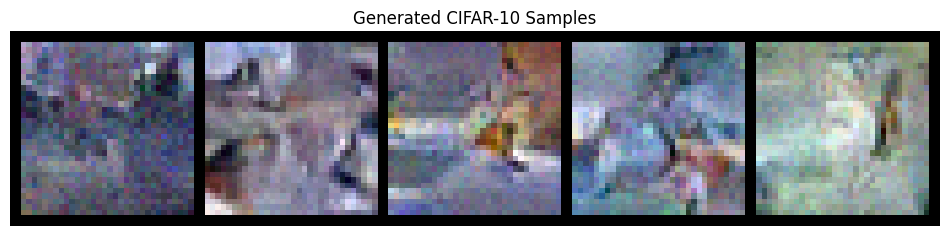

  Step 850/1250, Loss: 0.0803
  Step 900/1250, Loss: 0.0906
  Step 950/1250, Loss: 0.1096
  Step 1000/1250, Loss: 0.0962
  Generating samples...


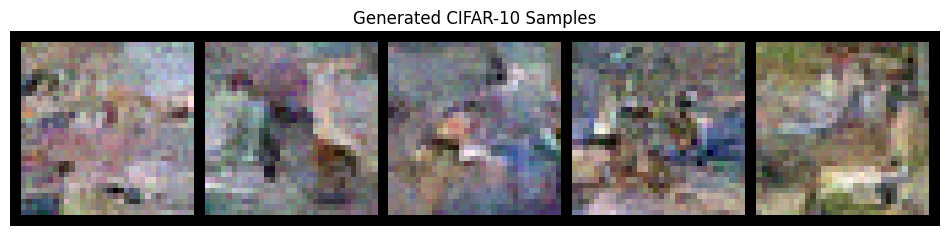

  Step 1050/1250, Loss: 0.0877
  Step 1100/1250, Loss: 0.0713
  Step 1150/1250, Loss: 0.0997
  Step 1200/1250, Loss: 0.0990
  Generating samples...


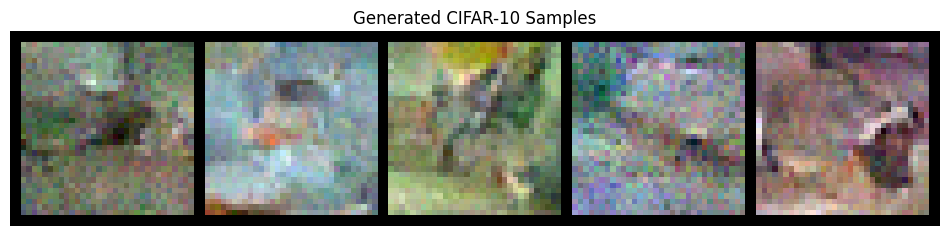


Training - Epoch 27 average loss: 0.1004
Running validation...
Validation - Epoch 27 average loss: 0.0995
Learning rate: 0.001000

Generating samples for visual progress check...


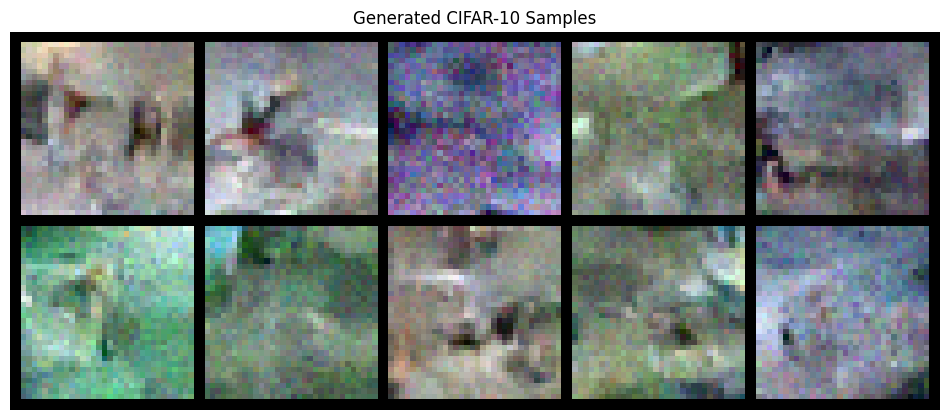

Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.0995)

Epoch 28/50
--------------------
  Step 0/1250, Loss: 0.0941
  Step 50/1250, Loss: 0.1613
  Step 100/1250, Loss: 0.0696
  Step 150/1250, Loss: 0.0991
  Step 200/1250, Loss: 0.1313
  Generating samples...


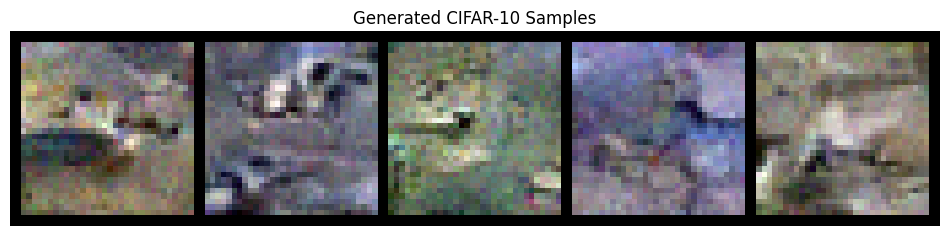

  Step 250/1250, Loss: 0.0814
  Step 300/1250, Loss: 0.0903
  Step 350/1250, Loss: 0.0845
  Step 400/1250, Loss: 0.0807
  Generating samples...


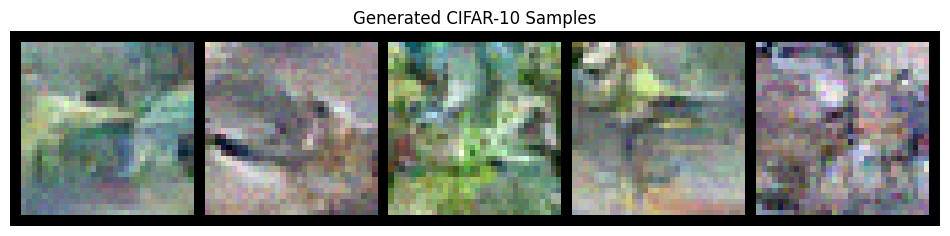

  Step 450/1250, Loss: 0.1077
  Step 500/1250, Loss: 0.1278
  Step 550/1250, Loss: 0.0950
  Step 600/1250, Loss: 0.0628
  Generating samples...


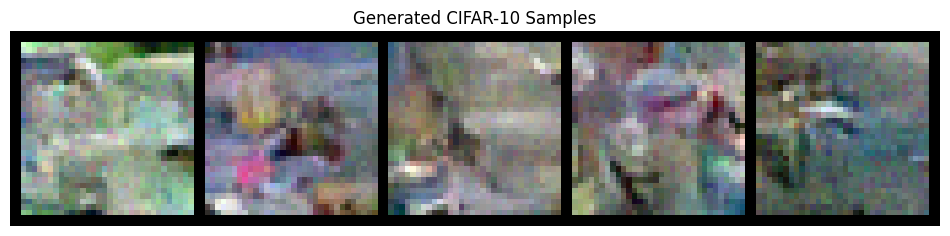

  Step 650/1250, Loss: 0.0832
  Step 700/1250, Loss: 0.0763
  Step 750/1250, Loss: 0.1241
  Step 800/1250, Loss: 0.1126
  Generating samples...


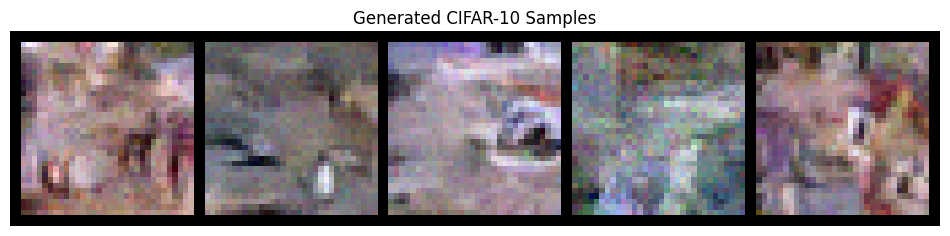

  Step 850/1250, Loss: 0.0844
  Step 900/1250, Loss: 0.1086
  Step 950/1250, Loss: 0.0848
  Step 1000/1250, Loss: 0.0939
  Generating samples...


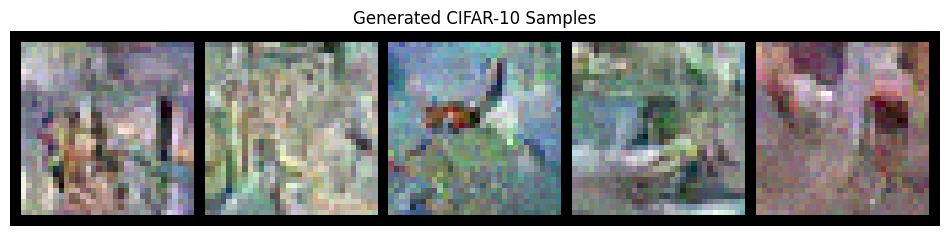

  Step 1050/1250, Loss: 0.1133
  Step 1100/1250, Loss: 0.1410
  Step 1150/1250, Loss: 0.1020
  Step 1200/1250, Loss: 0.0885
  Generating samples...


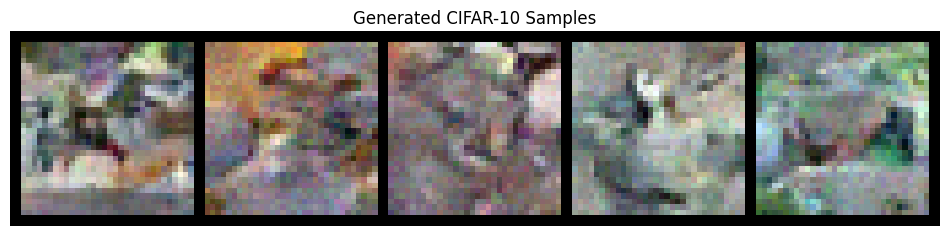


Training - Epoch 28 average loss: 0.1000
Running validation...
Validation - Epoch 28 average loss: 0.1014
Learning rate: 0.001000
No improvement for 1/15 epochs

Epoch 29/50
--------------------
  Step 0/1250, Loss: 0.0980
  Step 50/1250, Loss: 0.0937
  Step 100/1250, Loss: 0.0746
  Step 150/1250, Loss: 0.0929
  Step 200/1250, Loss: 0.0692
  Generating samples...


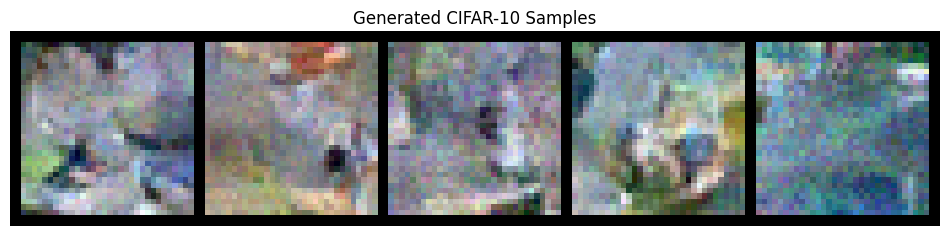

  Step 250/1250, Loss: 0.1046
  Step 300/1250, Loss: 0.1040
  Step 350/1250, Loss: 0.1079
  Step 400/1250, Loss: 0.0992
  Generating samples...


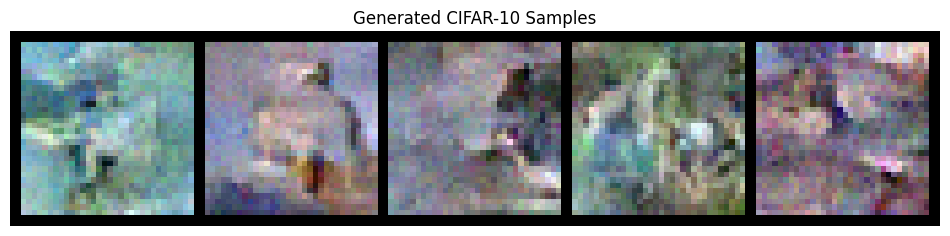

  Step 450/1250, Loss: 0.1178
  Step 500/1250, Loss: 0.1073
  Step 550/1250, Loss: 0.0902
  Step 600/1250, Loss: 0.0862
  Generating samples...


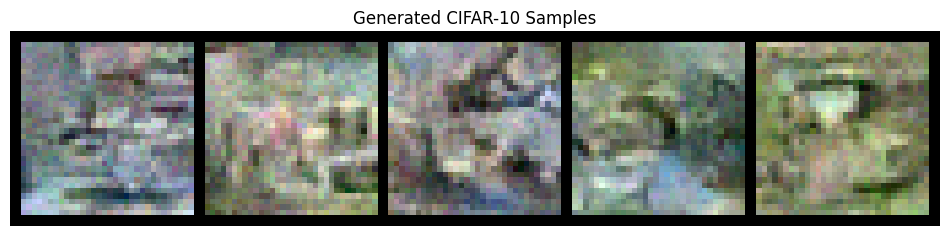

  Step 650/1250, Loss: 0.0540
  Step 700/1250, Loss: 0.1019
  Step 750/1250, Loss: 0.1022
  Step 800/1250, Loss: 0.0880
  Generating samples...


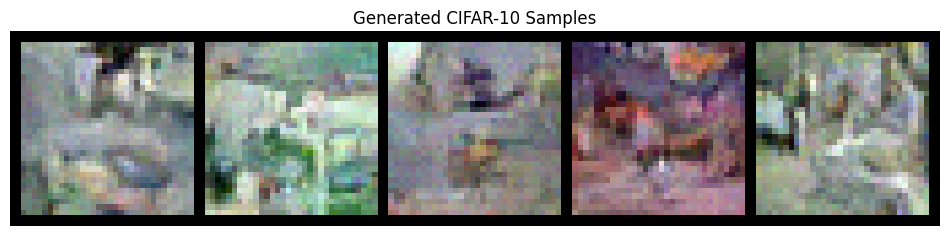

  Step 850/1250, Loss: 0.1144
  Step 900/1250, Loss: 0.1172
  Step 950/1250, Loss: 0.0998
  Step 1000/1250, Loss: 0.1590
  Generating samples...


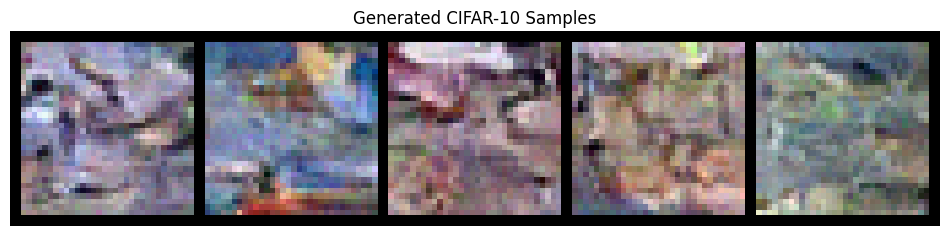

  Step 1050/1250, Loss: 0.1045
  Step 1100/1250, Loss: 0.1662
  Step 1150/1250, Loss: 0.0945
  Step 1200/1250, Loss: 0.0816
  Generating samples...


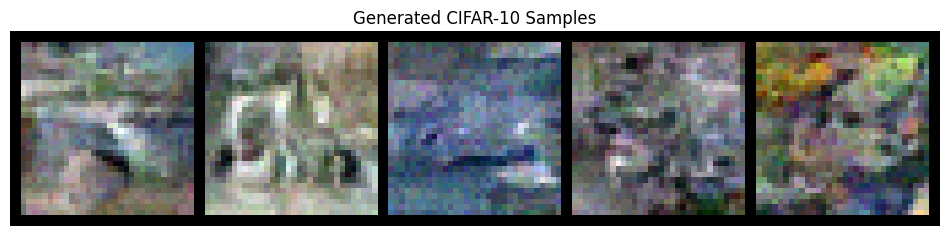


Training - Epoch 29 average loss: 0.0996
Running validation...
Validation - Epoch 29 average loss: 0.1022
Learning rate: 0.001000

Generating samples for visual progress check...


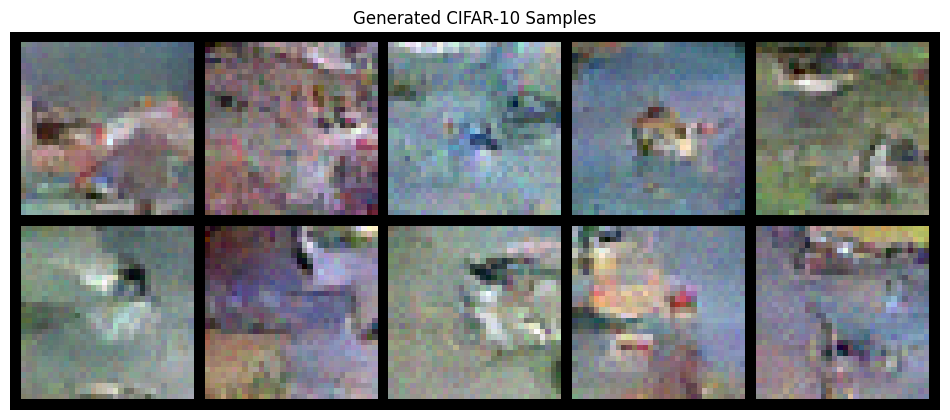

No improvement for 2/15 epochs

Epoch 30/50
--------------------
  Step 0/1250, Loss: 0.1333
  Step 50/1250, Loss: 0.0944
  Step 100/1250, Loss: 0.1326
  Step 150/1250, Loss: 0.0947
  Step 200/1250, Loss: 0.0849
  Generating samples...


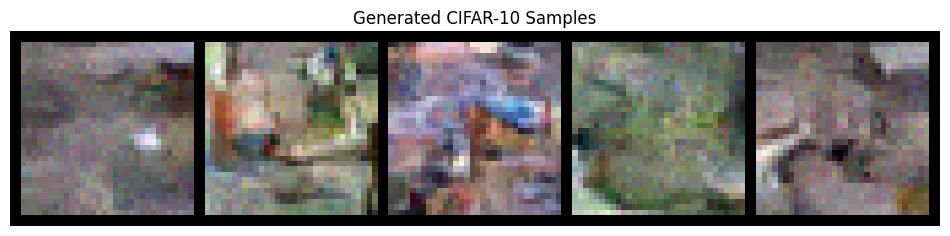

  Step 250/1250, Loss: 0.0763
  Step 300/1250, Loss: 0.0852
  Step 350/1250, Loss: 0.0725
  Step 400/1250, Loss: 0.1038
  Generating samples...


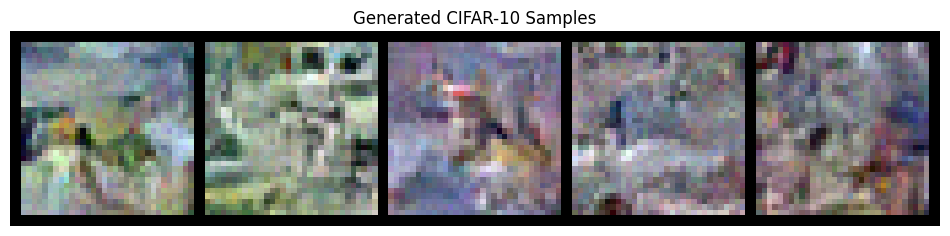

  Step 450/1250, Loss: 0.1024
  Step 500/1250, Loss: 0.0977
  Step 550/1250, Loss: 0.0914
  Step 600/1250, Loss: 0.0926
  Generating samples...


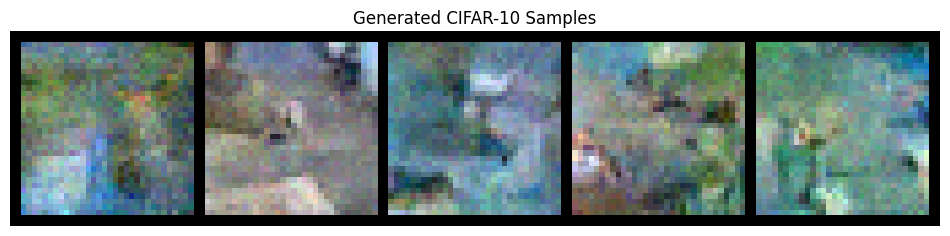

  Step 650/1250, Loss: 0.0992
  Step 700/1250, Loss: 0.1070
  Step 750/1250, Loss: 0.1070
  Step 800/1250, Loss: 0.1149
  Generating samples...


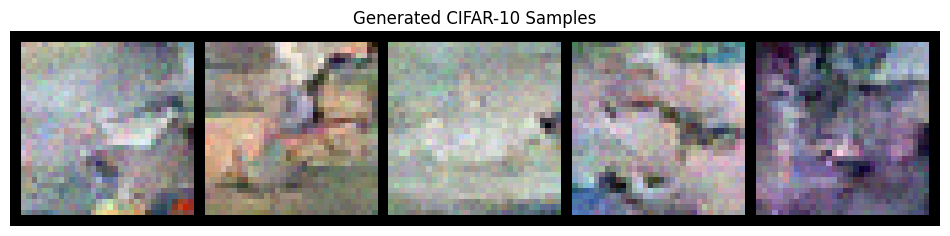

  Step 850/1250, Loss: 0.1081
  Step 900/1250, Loss: 0.1038
  Step 950/1250, Loss: 0.0712
  Step 1000/1250, Loss: 0.0648
  Generating samples...


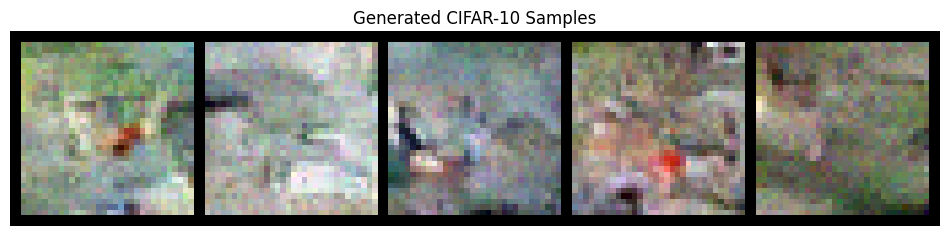

  Step 1050/1250, Loss: 0.1009
  Step 1100/1250, Loss: 0.1086
  Step 1150/1250, Loss: 0.0861
  Step 1200/1250, Loss: 0.0743
  Generating samples...


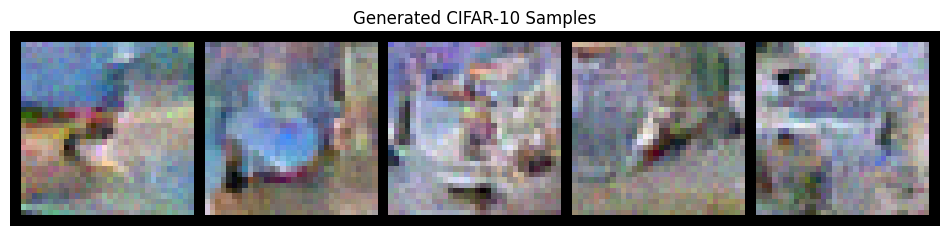


Training - Epoch 30 average loss: 0.1000
Running validation...
Validation - Epoch 30 average loss: 0.0994
Learning rate: 0.001000
Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.0994)

Epoch 31/50
--------------------
  Step 0/1250, Loss: 0.1018
  Step 50/1250, Loss: 0.0935
  Step 100/1250, Loss: 0.1033
  Step 150/1250, Loss: 0.0786
  Step 200/1250, Loss: 0.1002
  Generating samples...


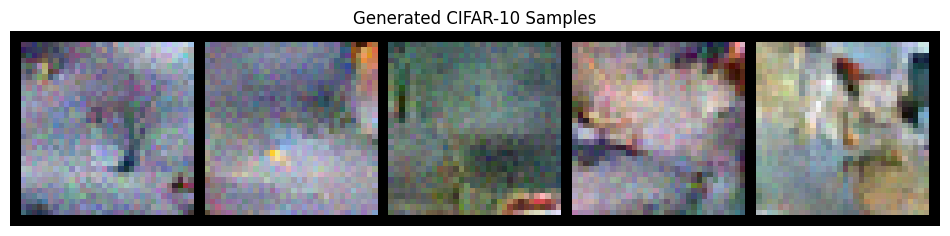

  Step 250/1250, Loss: 0.1032
  Step 300/1250, Loss: 0.0935
  Step 350/1250, Loss: 0.0914
  Step 400/1250, Loss: 0.0855
  Generating samples...


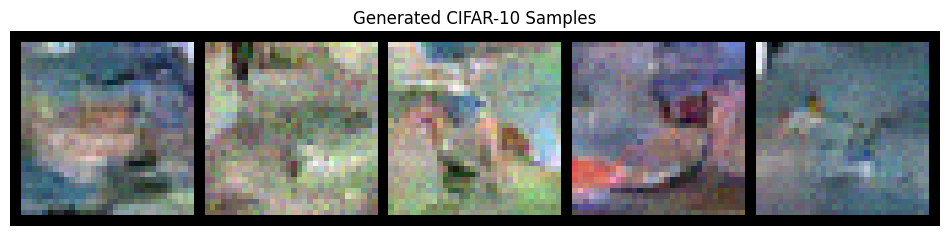

  Step 450/1250, Loss: 0.1073
  Step 500/1250, Loss: 0.1047
  Step 550/1250, Loss: 0.0805
  Step 600/1250, Loss: 0.0788
  Generating samples...


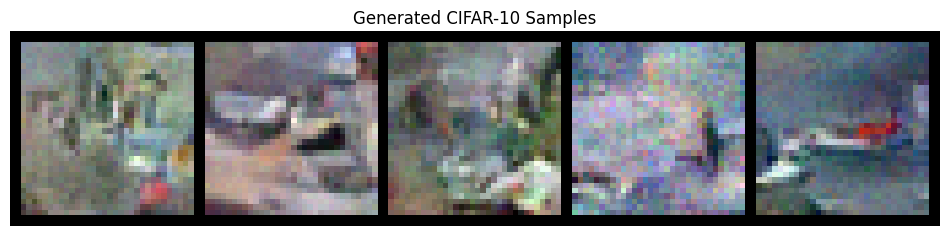

  Step 650/1250, Loss: 0.0748
  Step 700/1250, Loss: 0.1088
  Step 750/1250, Loss: 0.0941
  Step 800/1250, Loss: 0.0920
  Generating samples...


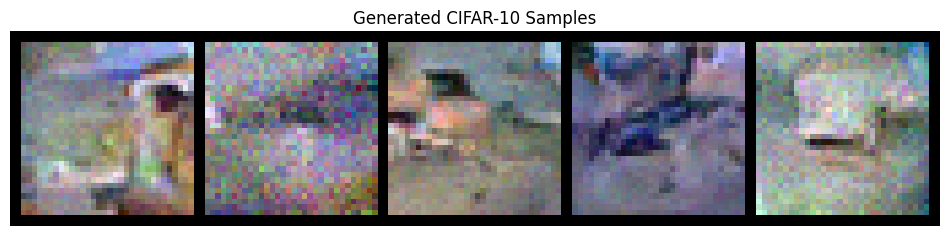

  Step 850/1250, Loss: 0.1031
  Step 900/1250, Loss: 0.0967
  Step 950/1250, Loss: 0.1323
  Step 1000/1250, Loss: 0.0780
  Generating samples...


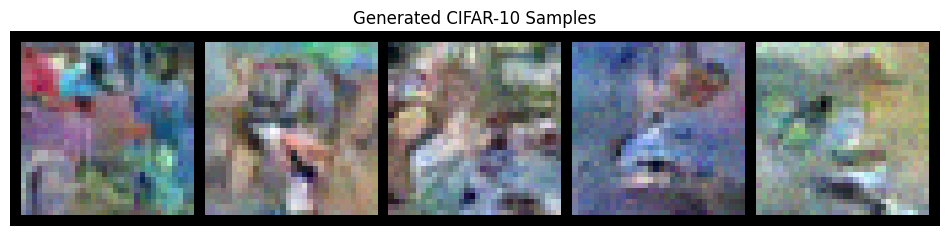

  Step 1050/1250, Loss: 0.0920
  Step 1100/1250, Loss: 0.1131
  Step 1150/1250, Loss: 0.1188
  Step 1200/1250, Loss: 0.0780
  Generating samples...


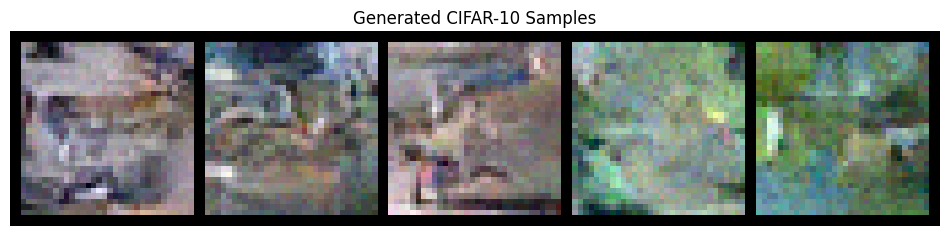


Training - Epoch 31 average loss: 0.0996
Running validation...
Validation - Epoch 31 average loss: 0.1001
Learning rate: 0.001000

Generating samples for visual progress check...


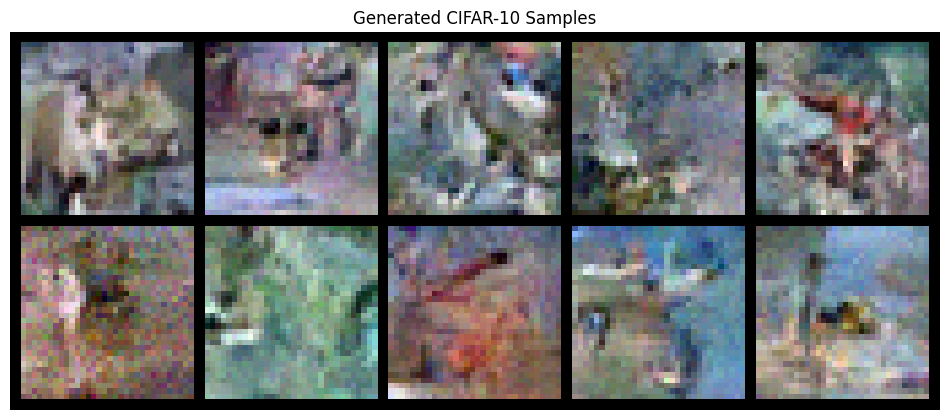

No improvement for 1/15 epochs


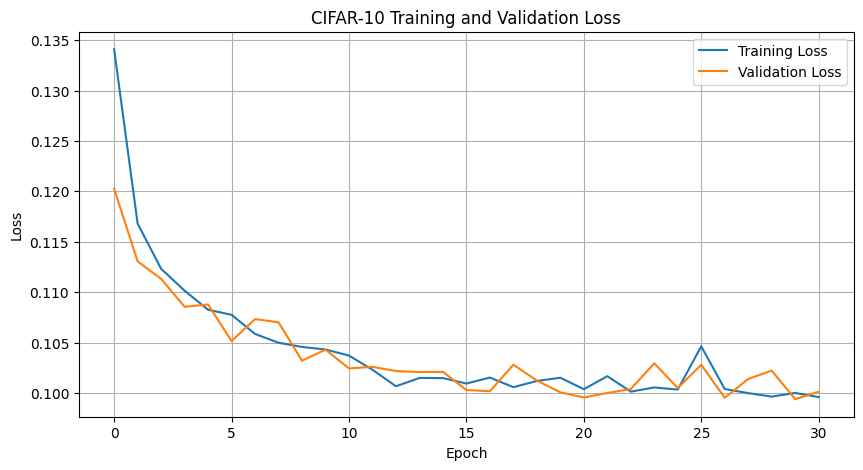


Epoch 32/50
--------------------
  Step 0/1250, Loss: 0.1029
  Step 50/1250, Loss: 0.0918
  Step 100/1250, Loss: 0.1077
  Step 150/1250, Loss: 0.0893
  Step 200/1250, Loss: 0.0640
  Generating samples...


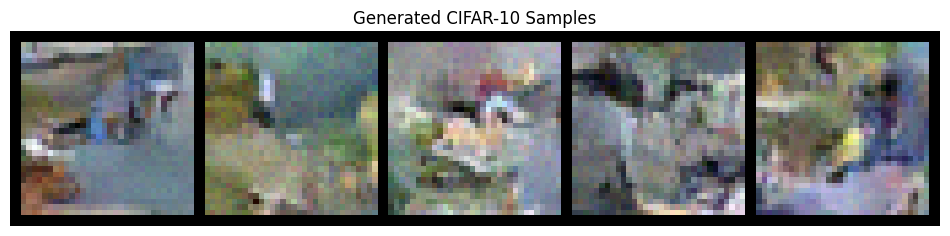

  Step 250/1250, Loss: 0.1067
  Step 300/1250, Loss: 0.0943
  Step 350/1250, Loss: 0.1302
  Step 400/1250, Loss: 0.1155
  Generating samples...


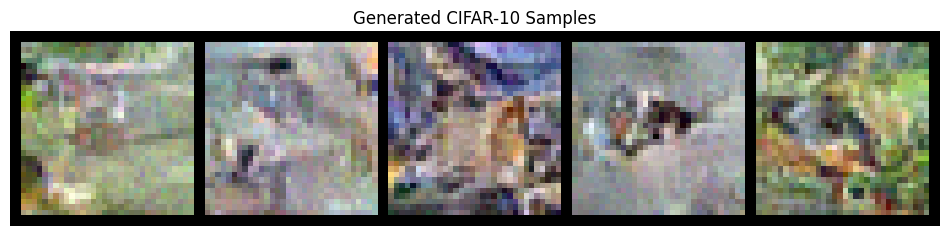

  Step 450/1250, Loss: 0.0929
  Step 500/1250, Loss: 0.0695
  Step 550/1250, Loss: 0.0889
  Step 600/1250, Loss: 0.1136
  Generating samples...


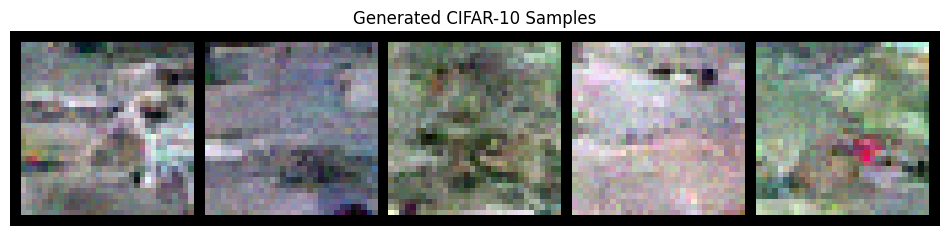

  Step 650/1250, Loss: 0.0954
  Step 700/1250, Loss: 0.0700
  Step 750/1250, Loss: 0.0713
  Step 800/1250, Loss: 0.0926
  Generating samples...


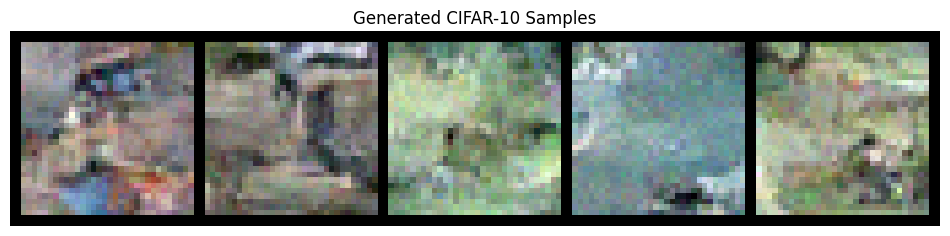

  Step 850/1250, Loss: 0.0855
  Step 900/1250, Loss: 0.1184
  Step 950/1250, Loss: 0.1014
  Step 1000/1250, Loss: 0.1223
  Generating samples...


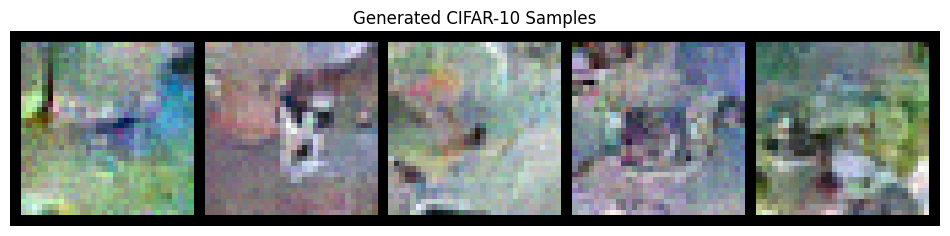

  Step 1050/1250, Loss: 0.0587
  Step 1100/1250, Loss: 0.1203
  Step 1150/1250, Loss: 0.0919
  Step 1200/1250, Loss: 0.0813
  Generating samples...


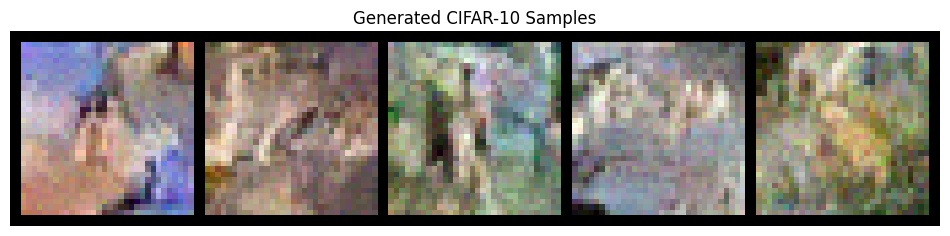


Training - Epoch 32 average loss: 0.1004
Running validation...
Validation - Epoch 32 average loss: 0.1002
Learning rate: 0.001000
No improvement for 2/15 epochs

Epoch 33/50
--------------------
  Step 0/1250, Loss: 0.1136
  Step 50/1250, Loss: 0.1142
  Step 100/1250, Loss: 0.1164
  Step 150/1250, Loss: 0.1190
  Step 200/1250, Loss: 0.1348
  Generating samples...


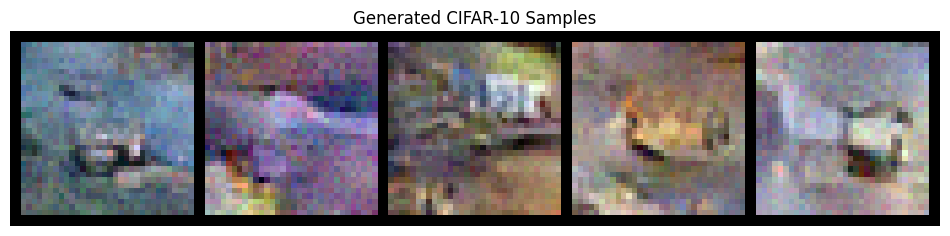

  Step 250/1250, Loss: 0.1093
  Step 300/1250, Loss: 0.1127
  Step 350/1250, Loss: 0.0715
  Step 400/1250, Loss: 0.1002
  Generating samples...


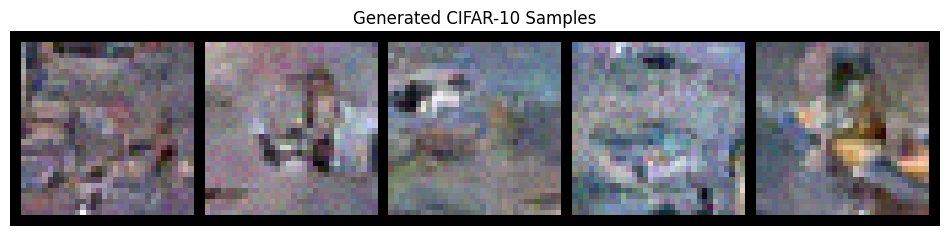

  Step 450/1250, Loss: 0.0852
  Step 500/1250, Loss: 0.0686
  Step 550/1250, Loss: 0.1267
  Step 600/1250, Loss: 0.1054
  Generating samples...


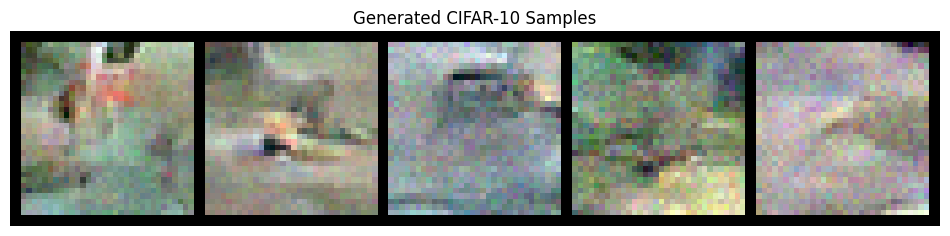

  Step 650/1250, Loss: 0.1020
  Step 700/1250, Loss: 0.1385
  Step 750/1250, Loss: 0.0954
  Step 800/1250, Loss: 0.0858
  Generating samples...


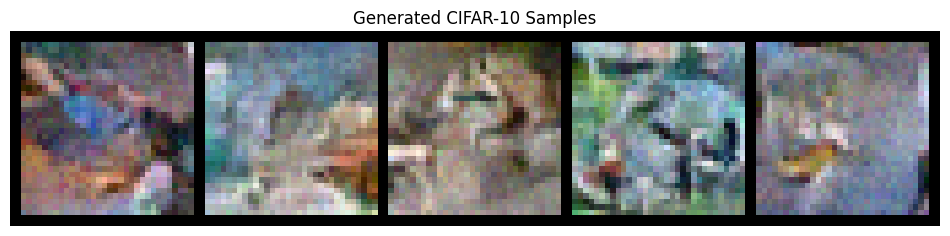

  Step 850/1250, Loss: 0.0983
  Step 900/1250, Loss: 0.0967
  Step 950/1250, Loss: 0.1162
  Step 1000/1250, Loss: 0.0651
  Generating samples...


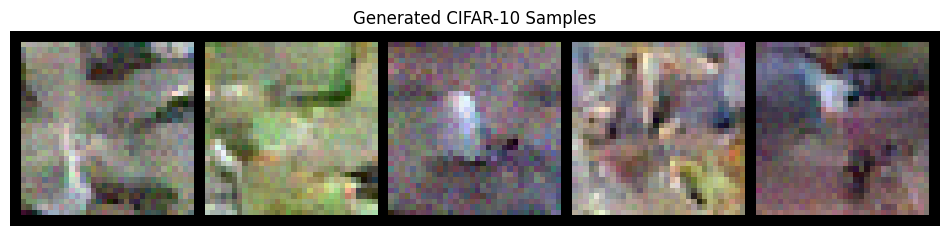

  Step 1050/1250, Loss: 0.1177
  Step 1100/1250, Loss: 0.1088
  Step 1150/1250, Loss: 0.1021
  Step 1200/1250, Loss: 0.1163
  Generating samples...


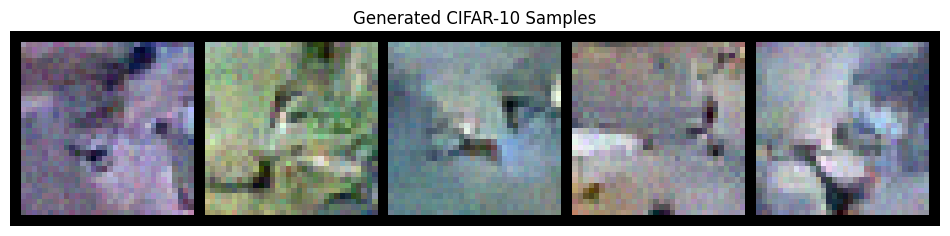


Training - Epoch 33 average loss: 0.0989
Running validation...
Validation - Epoch 33 average loss: 0.0980
Learning rate: 0.001000

Generating samples for visual progress check...


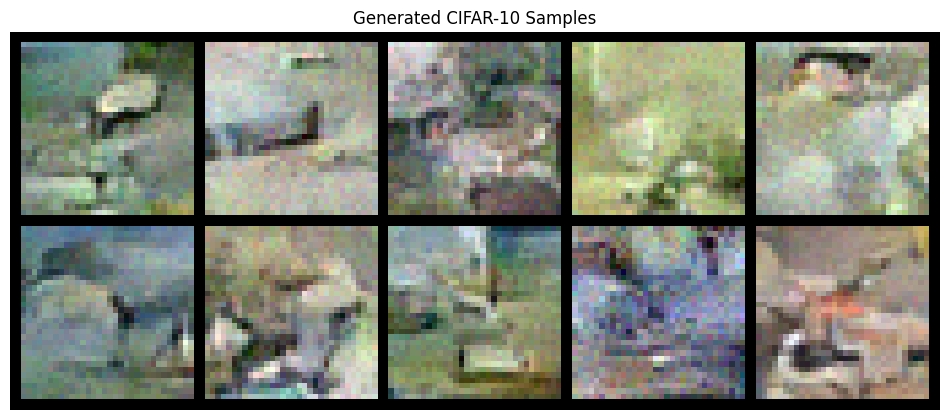

Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.0980)

Epoch 34/50
--------------------
  Step 0/1250, Loss: 0.0898
  Step 50/1250, Loss: 0.1164
  Step 100/1250, Loss: 0.1278
  Step 150/1250, Loss: 0.0803
  Step 200/1250, Loss: 0.0839
  Generating samples...


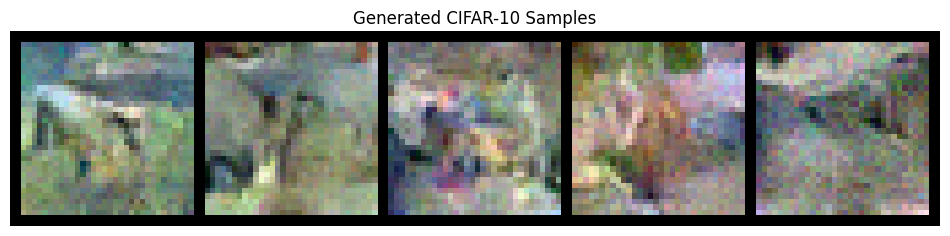

  Step 250/1250, Loss: 0.1122
  Step 300/1250, Loss: 0.1129
  Step 350/1250, Loss: 0.1324
  Step 400/1250, Loss: 0.1273
  Generating samples...


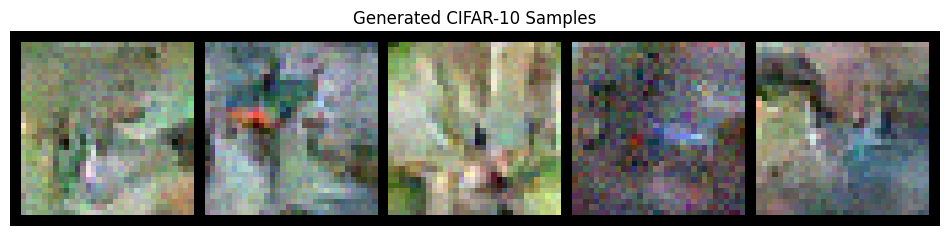

  Step 450/1250, Loss: 0.0987
  Step 500/1250, Loss: 0.0742
  Step 550/1250, Loss: 0.0847
  Step 600/1250, Loss: 0.1089
  Generating samples...


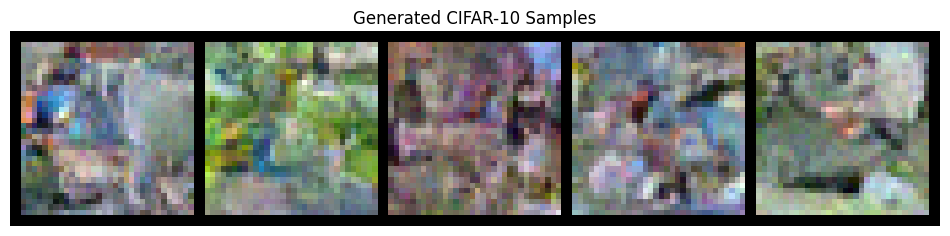

  Step 650/1250, Loss: 0.1123
  Step 700/1250, Loss: 0.0918
  Step 750/1250, Loss: 0.0983
  Step 800/1250, Loss: 0.0864
  Generating samples...


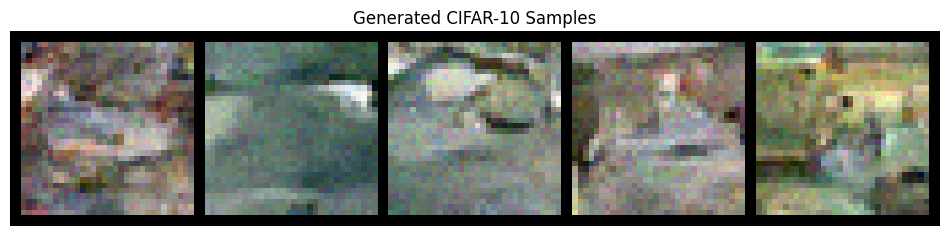

  Step 850/1250, Loss: 0.1466
  Step 900/1250, Loss: 0.1334
  Step 950/1250, Loss: 0.0787
  Step 1000/1250, Loss: 0.0766
  Generating samples...


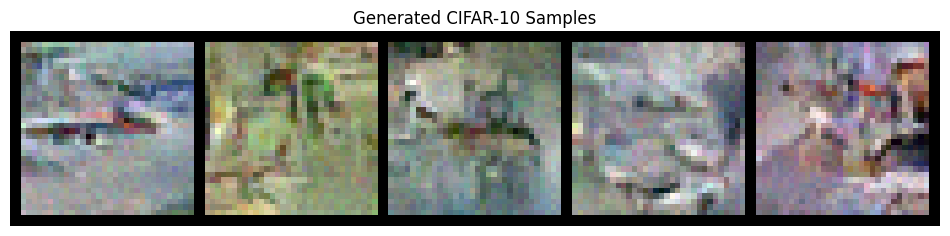

  Step 1050/1250, Loss: 0.1090
  Step 1100/1250, Loss: 0.0777
  Step 1150/1250, Loss: 0.1296
  Step 1200/1250, Loss: 0.0924
  Generating samples...


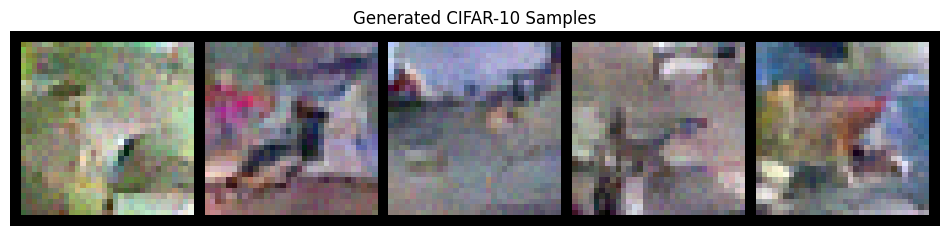


Training - Epoch 34 average loss: 0.0998
Running validation...
Validation - Epoch 34 average loss: 0.1006
Learning rate: 0.001000
No improvement for 1/15 epochs

Epoch 35/50
--------------------
  Step 0/1250, Loss: 0.0893
  Step 50/1250, Loss: 0.0870
  Step 100/1250, Loss: 0.1507
  Step 150/1250, Loss: 0.1321
  Step 200/1250, Loss: 0.1270
  Generating samples...


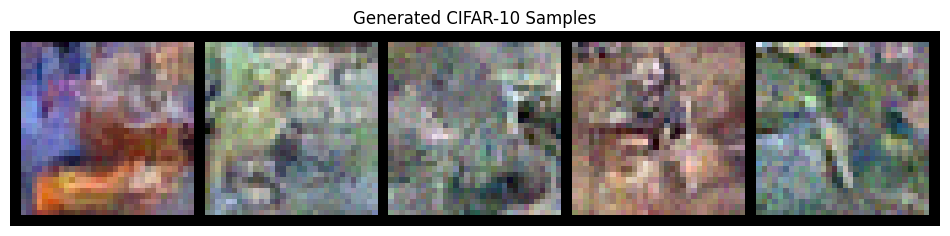

  Step 250/1250, Loss: 0.0931
  Step 300/1250, Loss: 0.0735
  Step 350/1250, Loss: 0.1233
  Step 400/1250, Loss: 0.0969
  Generating samples...


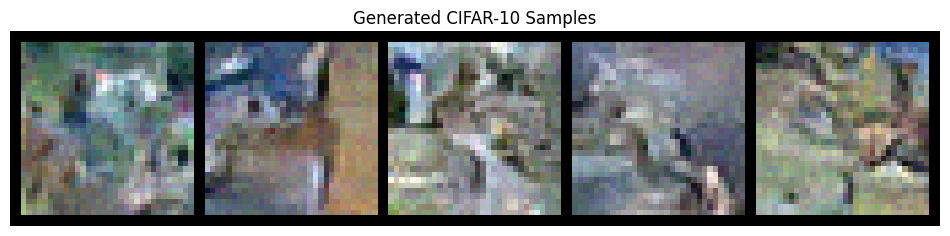

  Step 450/1250, Loss: 0.0973
  Step 500/1250, Loss: 0.1377
  Step 550/1250, Loss: 0.1095
  Step 600/1250, Loss: 0.0624
  Generating samples...


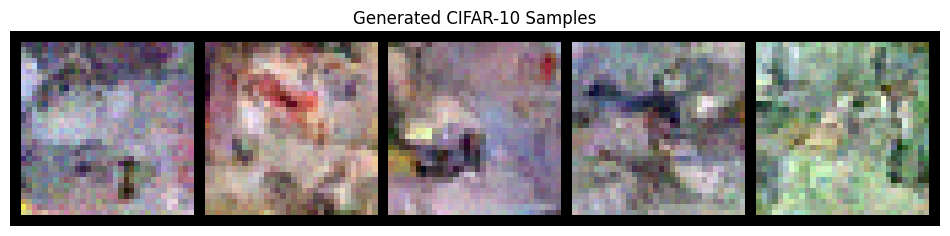

  Step 650/1250, Loss: 0.1036
  Step 700/1250, Loss: 0.1275
  Step 750/1250, Loss: 0.0842
  Step 800/1250, Loss: 0.1014
  Generating samples...


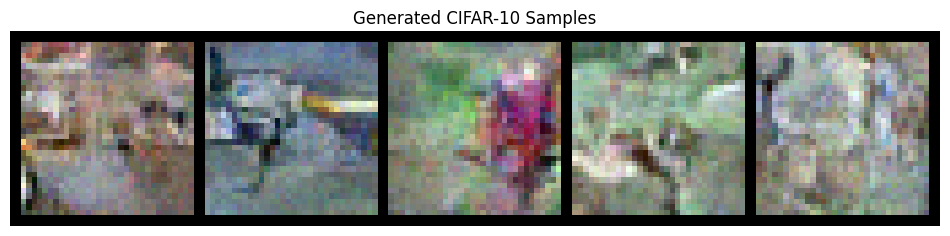

  Step 850/1250, Loss: 0.1053
  Step 900/1250, Loss: 0.0917
  Step 950/1250, Loss: 0.0943
  Step 1000/1250, Loss: 0.1115
  Generating samples...


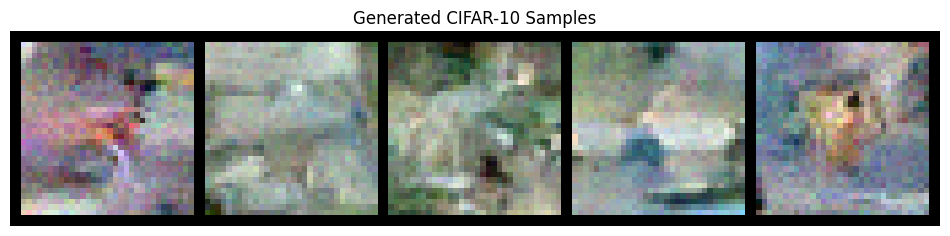

  Step 1050/1250, Loss: 0.0880
  Step 1100/1250, Loss: 0.0998
  Step 1150/1250, Loss: 0.1039
  Step 1200/1250, Loss: 0.1099
  Generating samples...


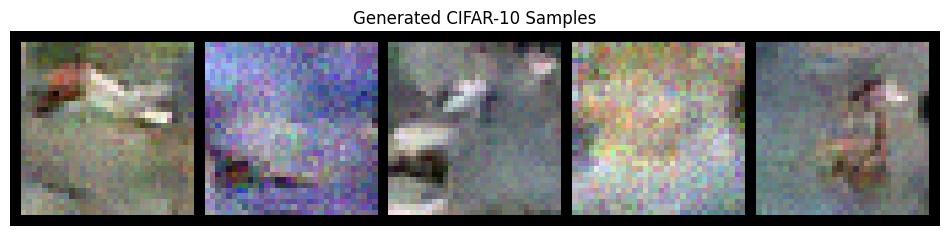


Training - Epoch 35 average loss: 0.0995
Running validation...
Validation - Epoch 35 average loss: 0.0992
Learning rate: 0.001000

Generating samples for visual progress check...


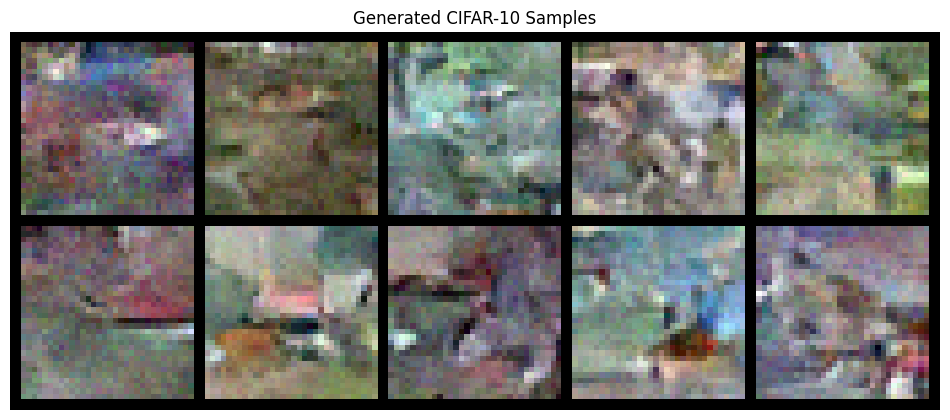

No improvement for 2/15 epochs

Epoch 36/50
--------------------
  Step 0/1250, Loss: 0.0744
  Step 50/1250, Loss: 0.0892
  Step 100/1250, Loss: 0.0886
  Step 150/1250, Loss: 0.1127
  Step 200/1250, Loss: 0.1278
  Generating samples...


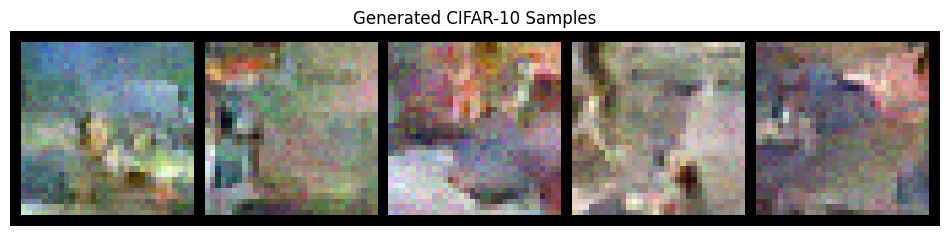

  Step 250/1250, Loss: 0.1211
  Step 300/1250, Loss: 0.0712
  Step 350/1250, Loss: 0.0674
  Step 400/1250, Loss: 0.1135
  Generating samples...


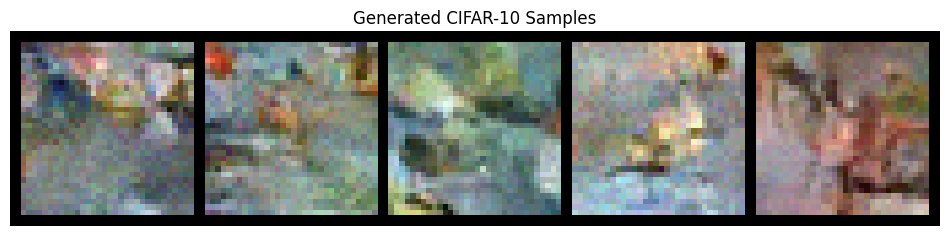

  Step 450/1250, Loss: 0.0817
  Step 500/1250, Loss: 0.0933
  Step 550/1250, Loss: 0.0986
  Step 600/1250, Loss: 0.0960
  Generating samples...


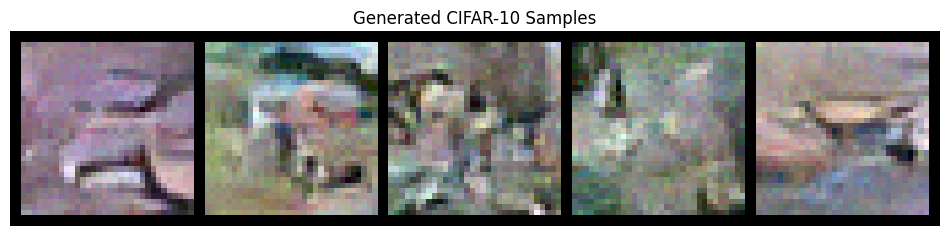

  Step 650/1250, Loss: 0.1255
  Step 700/1250, Loss: 0.0960
  Step 750/1250, Loss: 0.0946
  Step 800/1250, Loss: 0.0867
  Generating samples...


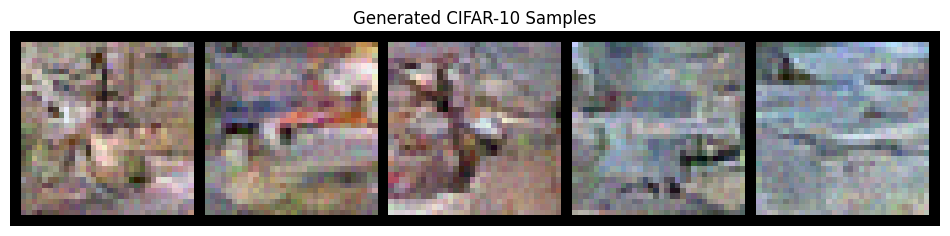

  Step 850/1250, Loss: 0.0860
  Step 900/1250, Loss: 0.1397
  Step 950/1250, Loss: 0.1011
  Step 1000/1250, Loss: 0.1100
  Generating samples...


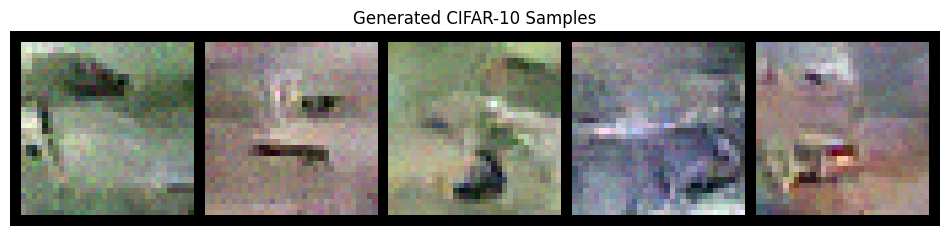

  Step 1050/1250, Loss: 0.1290
  Step 1100/1250, Loss: 0.1125
  Step 1150/1250, Loss: 0.0906
  Step 1200/1250, Loss: 0.0987
  Generating samples...


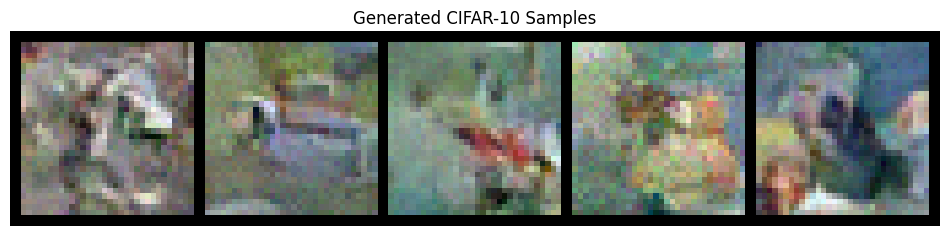


Training - Epoch 36 average loss: 0.0988
Running validation...
Validation - Epoch 36 average loss: 0.0998
Learning rate: 0.001000
No improvement for 3/15 epochs


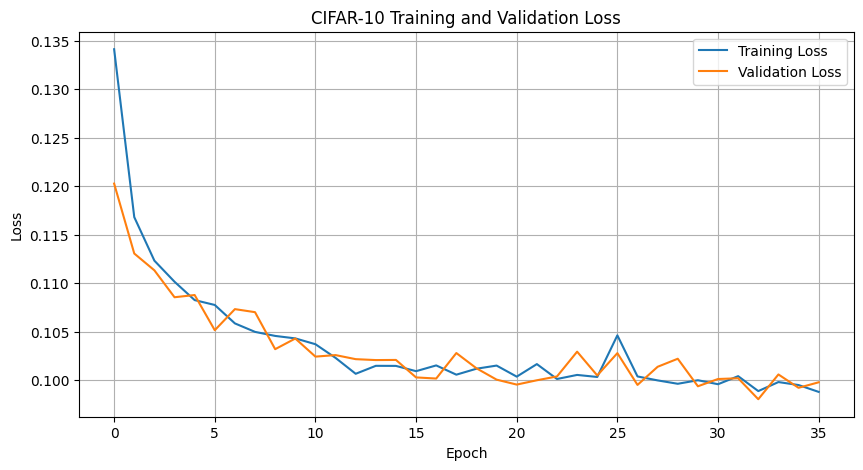


Epoch 37/50
--------------------
  Step 0/1250, Loss: 0.1355
  Step 50/1250, Loss: 0.1221
  Step 100/1250, Loss: 0.0977
  Step 150/1250, Loss: 0.0998
  Step 200/1250, Loss: 0.0865
  Generating samples...


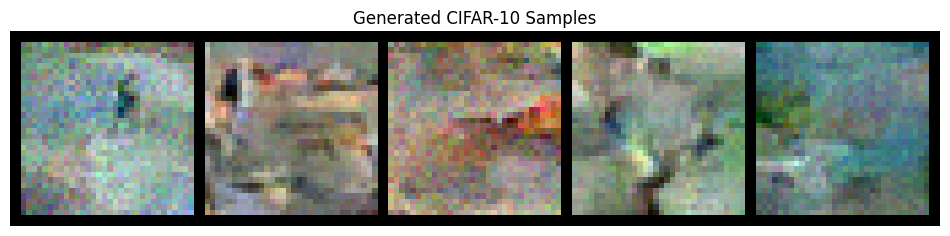

  Step 250/1250, Loss: 0.0933
  Step 300/1250, Loss: 0.1086
  Step 350/1250, Loss: 0.0855
  Step 400/1250, Loss: 0.1023
  Generating samples...


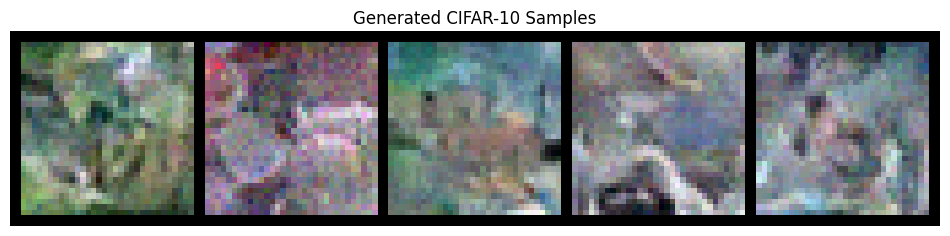

  Step 450/1250, Loss: 0.0926
  Step 500/1250, Loss: 0.1106
  Step 550/1250, Loss: 0.0954
  Step 600/1250, Loss: 0.0775
  Generating samples...


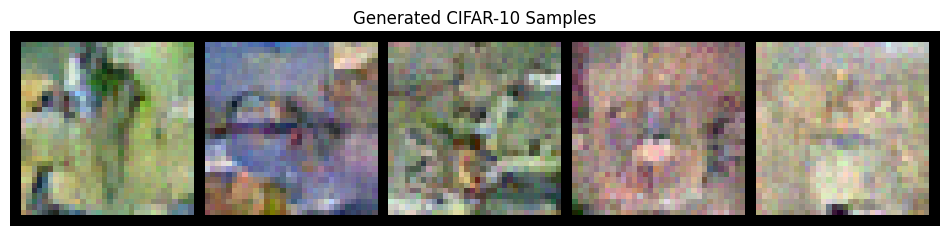

  Step 650/1250, Loss: 0.0934
  Step 700/1250, Loss: 0.1073
  Step 750/1250, Loss: 0.1048
  Step 800/1250, Loss: 0.0815
  Generating samples...


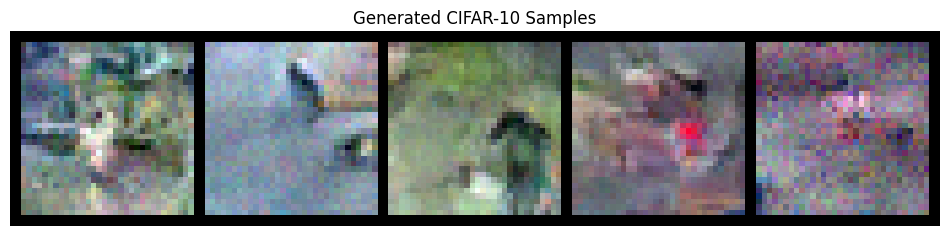

  Step 850/1250, Loss: 0.0865
  Step 900/1250, Loss: 0.0718
  Step 950/1250, Loss: 0.0963
  Step 1000/1250, Loss: 0.1151
  Generating samples...


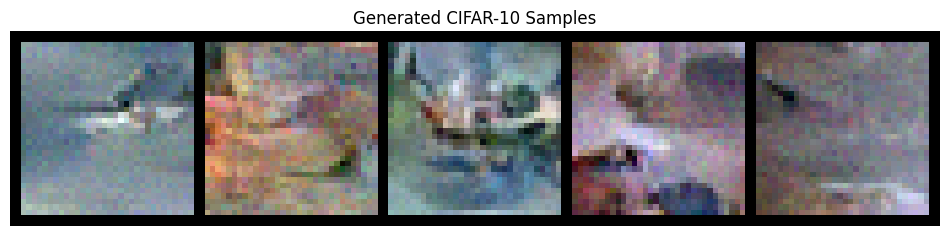

  Step 1050/1250, Loss: 0.0852
  Step 1100/1250, Loss: 0.0833
  Step 1150/1250, Loss: 0.0967
  Step 1200/1250, Loss: 0.1656
  Generating samples...


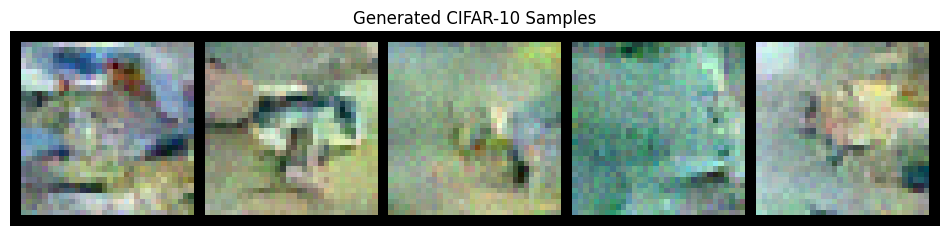


Training - Epoch 37 average loss: 0.0998
Running validation...
Validation - Epoch 37 average loss: 0.1002
Learning rate: 0.001000

Generating samples for visual progress check...


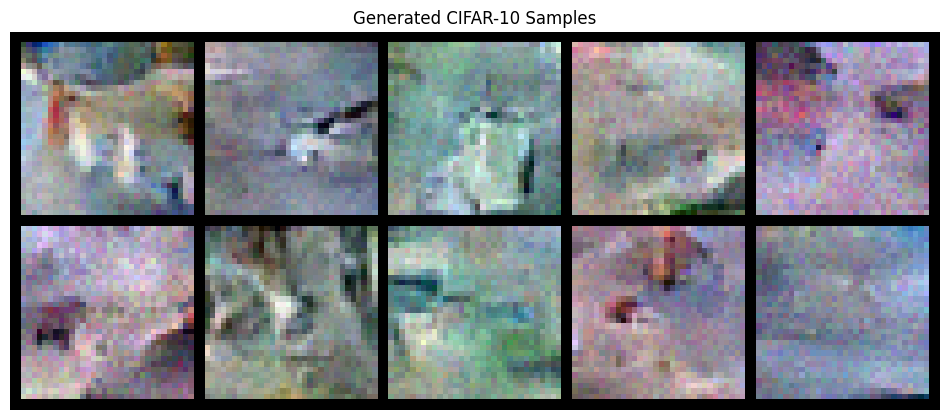

No improvement for 4/15 epochs

Epoch 38/50
--------------------
  Step 0/1250, Loss: 0.1127
  Step 50/1250, Loss: 0.1144
  Step 100/1250, Loss: 0.1013
  Step 150/1250, Loss: 0.1337
  Step 200/1250, Loss: 0.0998
  Generating samples...


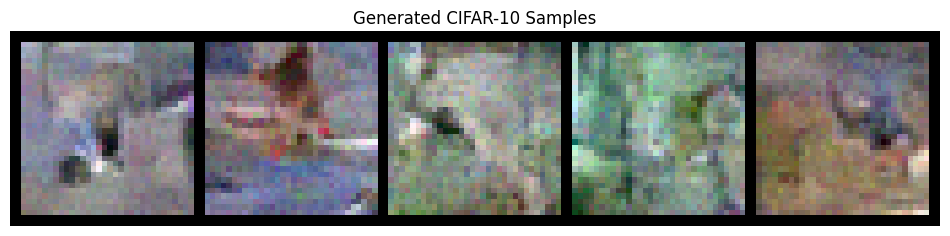

  Step 250/1250, Loss: 0.0890
  Step 300/1250, Loss: 0.0844
  Step 350/1250, Loss: 0.1005
  Step 400/1250, Loss: 0.0887
  Generating samples...


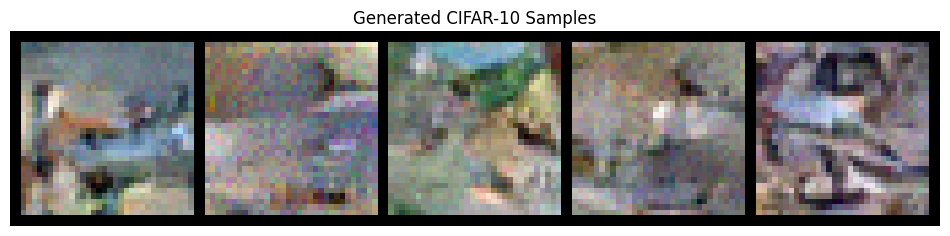

  Step 450/1250, Loss: 0.0984
  Step 500/1250, Loss: 0.0727
  Step 550/1250, Loss: 0.1099
  Step 600/1250, Loss: 0.0911
  Generating samples...


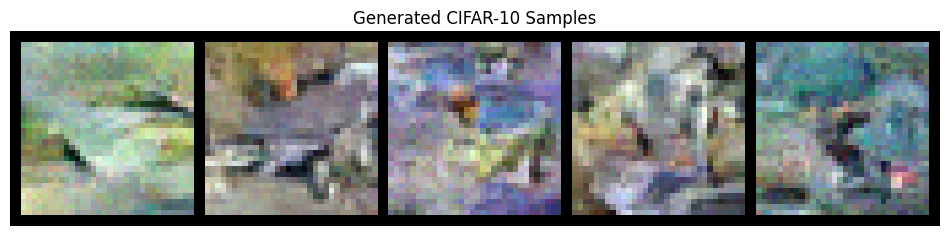

  Step 650/1250, Loss: 0.1271
  Step 700/1250, Loss: 0.1191
  Step 750/1250, Loss: 0.0955
  Step 800/1250, Loss: 0.1035
  Generating samples...


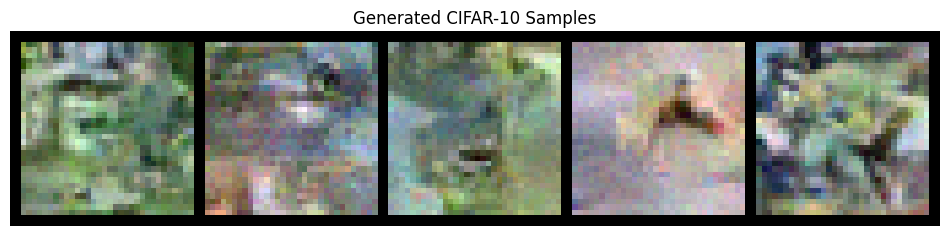

  Step 850/1250, Loss: 0.1323
  Step 900/1250, Loss: 0.0838
  Step 950/1250, Loss: 0.0989
  Step 1000/1250, Loss: 0.0873
  Generating samples...


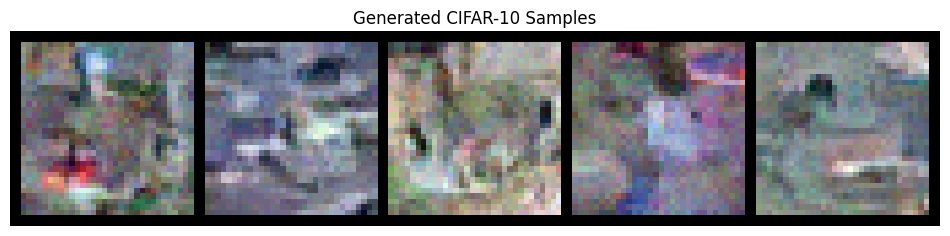

  Step 1050/1250, Loss: 0.1045
  Step 1100/1250, Loss: 0.0711
  Step 1150/1250, Loss: 0.1023
  Step 1200/1250, Loss: 0.1370
  Generating samples...


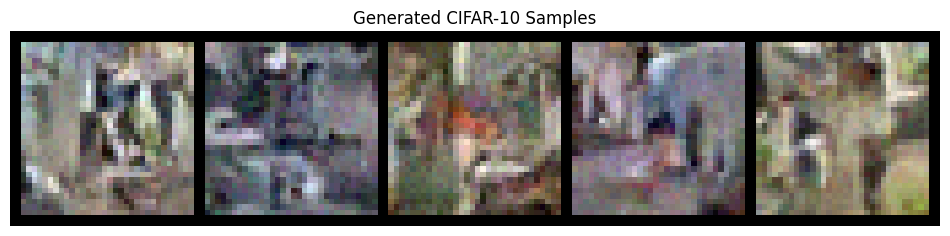


Training - Epoch 38 average loss: 0.0998
Running validation...
Validation - Epoch 38 average loss: 0.1007
Learning rate: 0.001000
No improvement for 5/15 epochs

Epoch 39/50
--------------------
  Step 0/1250, Loss: 0.0677
  Step 50/1250, Loss: 0.1134
  Step 100/1250, Loss: 0.1342
  Step 150/1250, Loss: 0.0720
  Step 200/1250, Loss: 0.1130
  Generating samples...


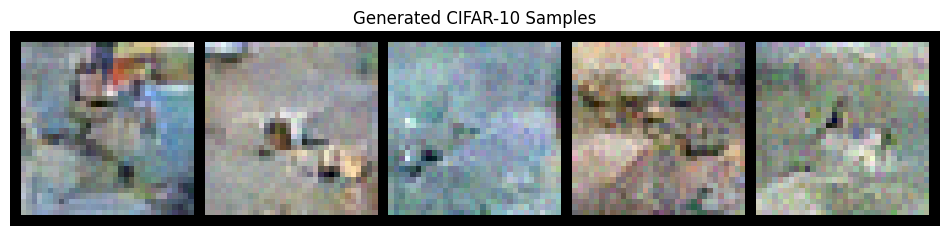

  Step 250/1250, Loss: 0.0807
  Step 300/1250, Loss: 0.1011
  Step 350/1250, Loss: 0.1025
  Step 400/1250, Loss: 0.0998
  Generating samples...


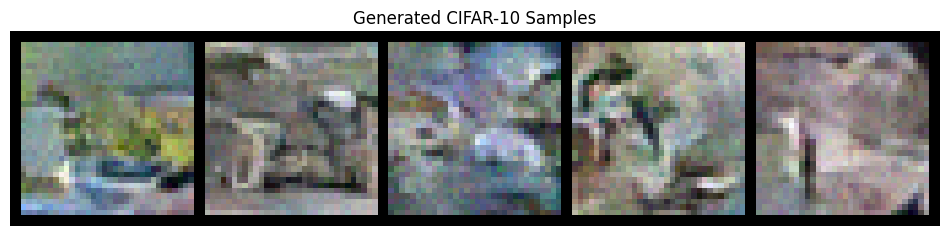

  Step 450/1250, Loss: 0.1049
  Step 500/1250, Loss: 0.0980
  Step 550/1250, Loss: 0.1088
  Step 600/1250, Loss: 0.1076
  Generating samples...


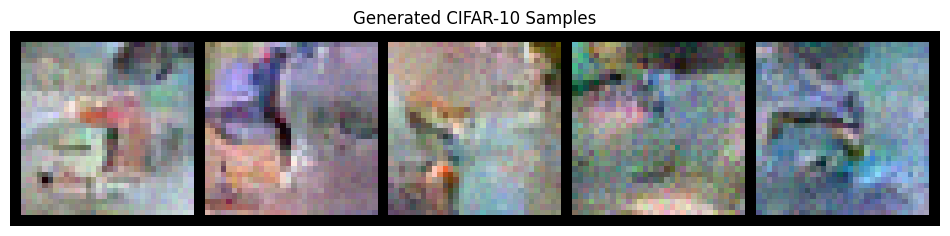

  Step 650/1250, Loss: 0.0775
  Step 700/1250, Loss: 0.1178
  Step 750/1250, Loss: 0.1108
  Step 800/1250, Loss: 0.1185
  Generating samples...


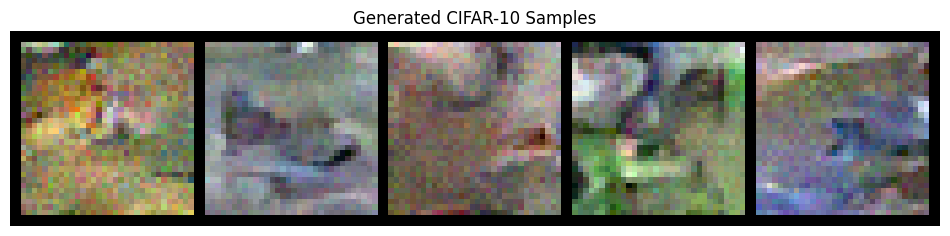

  Step 850/1250, Loss: 0.1044
  Step 900/1250, Loss: 0.1107
  Step 950/1250, Loss: 0.1280
  Step 1000/1250, Loss: 0.0971
  Generating samples...


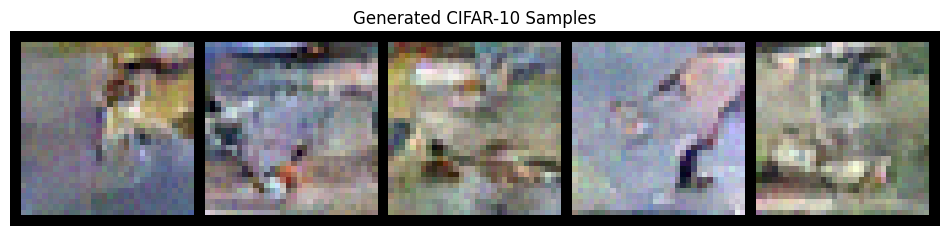

  Step 1050/1250, Loss: 0.0765
  Step 1100/1250, Loss: 0.1012
  Step 1150/1250, Loss: 0.1119
  Step 1200/1250, Loss: 0.1291
  Generating samples...


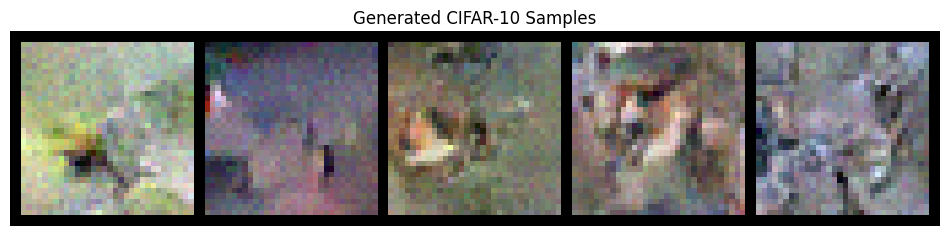


Training - Epoch 39 average loss: 0.0999
Running validation...
Validation - Epoch 39 average loss: 0.1011
Learning rate: 0.000500

Generating samples for visual progress check...


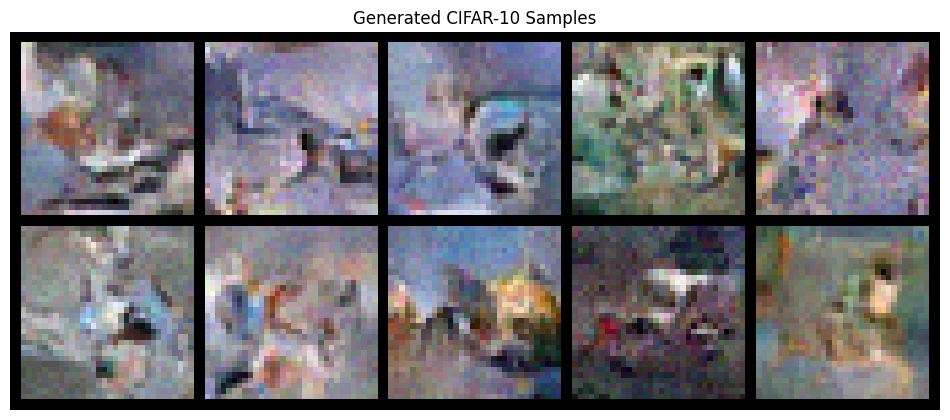

No improvement for 6/15 epochs

Epoch 40/50
--------------------
  Step 0/1250, Loss: 0.1418
  Step 50/1250, Loss: 0.0929
  Step 100/1250, Loss: 0.0871
  Step 150/1250, Loss: 0.0942
  Step 200/1250, Loss: 0.0808
  Generating samples...


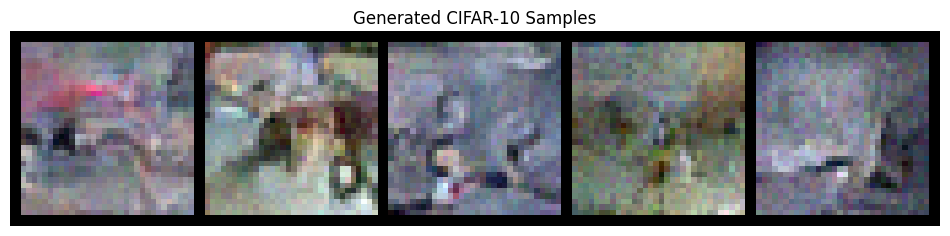

  Step 250/1250, Loss: 0.1128
  Step 300/1250, Loss: 0.0777
  Step 350/1250, Loss: 0.1040
  Step 400/1250, Loss: 0.1301
  Generating samples...


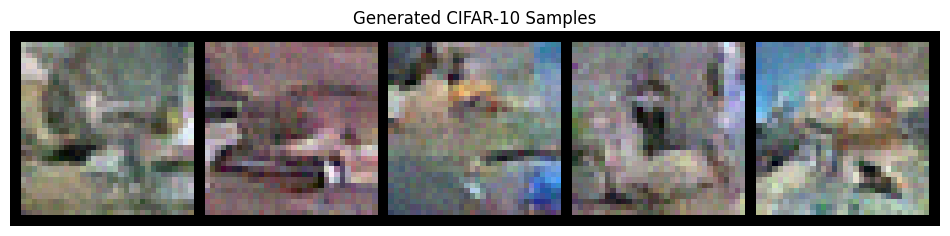

  Step 450/1250, Loss: 0.0800
  Step 500/1250, Loss: 0.1026
  Step 550/1250, Loss: 0.1044
  Step 600/1250, Loss: 0.1299
  Generating samples...


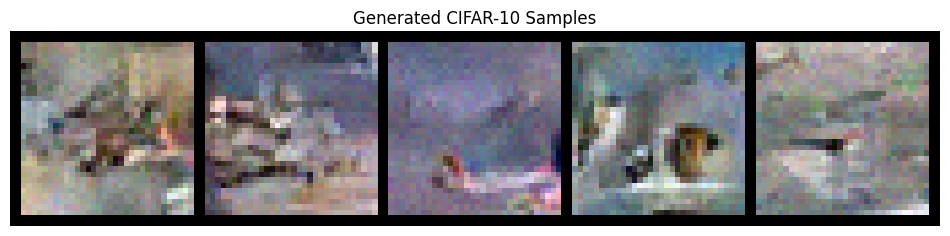

  Step 650/1250, Loss: 0.1513
  Step 700/1250, Loss: 0.0592
  Step 750/1250, Loss: 0.1225
  Step 800/1250, Loss: 0.0843
  Generating samples...


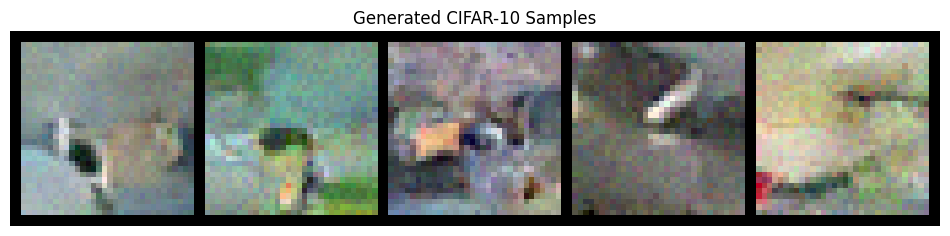

  Step 850/1250, Loss: 0.1192
  Step 900/1250, Loss: 0.0778
  Step 950/1250, Loss: 0.1014
  Step 1000/1250, Loss: 0.0827
  Generating samples...


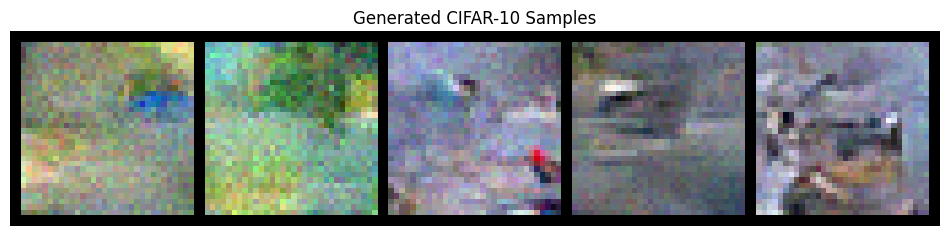

  Step 1050/1250, Loss: 0.0798
  Step 1100/1250, Loss: 0.0975
  Step 1150/1250, Loss: 0.0810
  Step 1200/1250, Loss: 0.1269
  Generating samples...


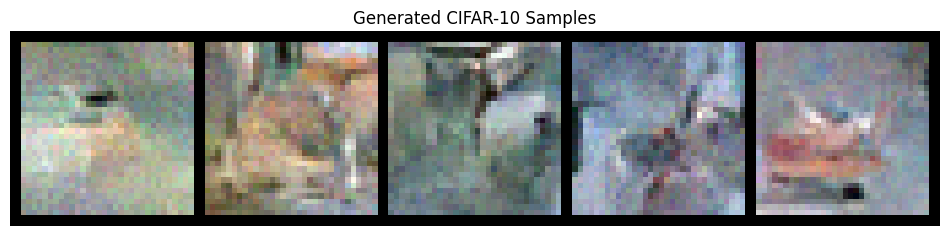


Training - Epoch 40 average loss: 0.0983
Running validation...
Validation - Epoch 40 average loss: 0.0990
Learning rate: 0.000500
No improvement for 7/15 epochs

Epoch 41/50
--------------------
  Step 0/1250, Loss: 0.0829
  Step 50/1250, Loss: 0.0974
  Step 100/1250, Loss: 0.1240
  Step 150/1250, Loss: 0.0788
  Step 200/1250, Loss: 0.1104
  Generating samples...


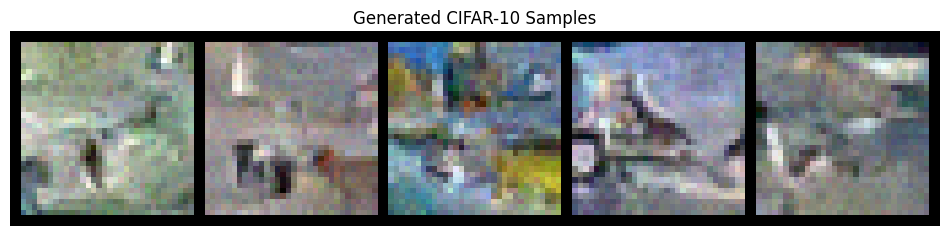

  Step 250/1250, Loss: 0.0819
  Step 300/1250, Loss: 0.0872
  Step 350/1250, Loss: 0.1081
  Step 400/1250, Loss: 0.0901
  Generating samples...


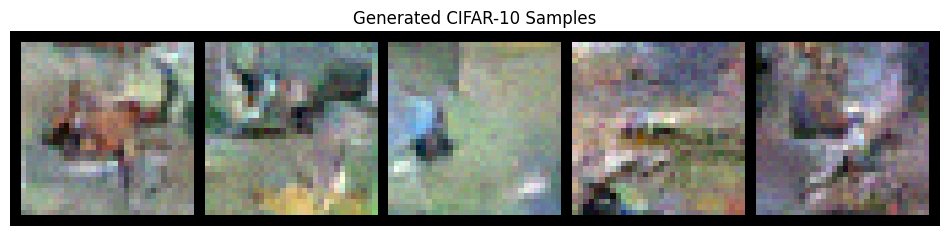

  Step 450/1250, Loss: 0.0839
  Step 500/1250, Loss: 0.0848
  Step 550/1250, Loss: 0.0861
  Step 600/1250, Loss: 0.1022
  Generating samples...


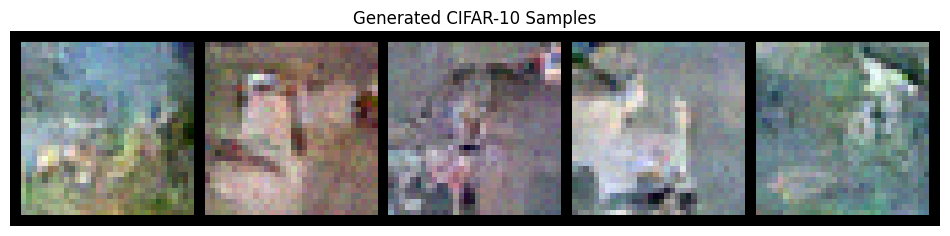

  Step 650/1250, Loss: 0.1087
  Step 700/1250, Loss: 0.0901
  Step 750/1250, Loss: 0.0653
  Step 800/1250, Loss: 0.1089
  Generating samples...


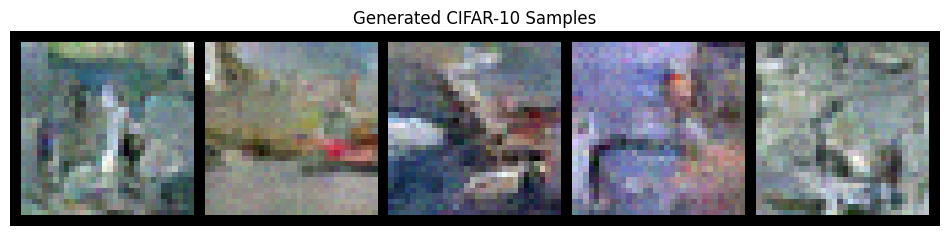

  Step 850/1250, Loss: 0.0652
  Step 900/1250, Loss: 0.0885
  Step 950/1250, Loss: 0.0874
  Step 1000/1250, Loss: 0.1118
  Generating samples...


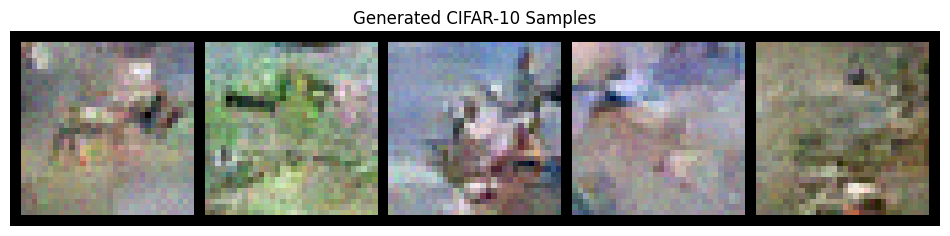

  Step 1050/1250, Loss: 0.0996
  Step 1100/1250, Loss: 0.1160
  Step 1150/1250, Loss: 0.0807
  Step 1200/1250, Loss: 0.0875
  Generating samples...


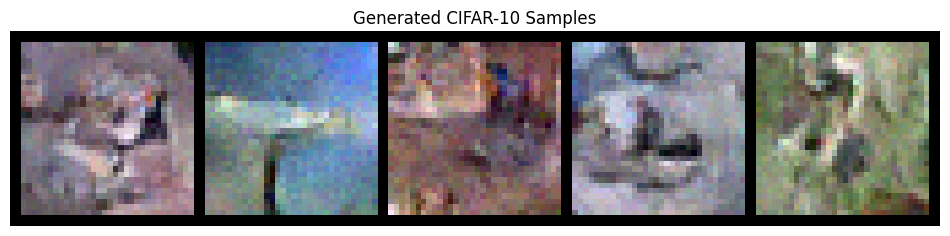


Training - Epoch 41 average loss: 0.0985
Running validation...
Validation - Epoch 41 average loss: 0.1004
Learning rate: 0.000500

Generating samples for visual progress check...


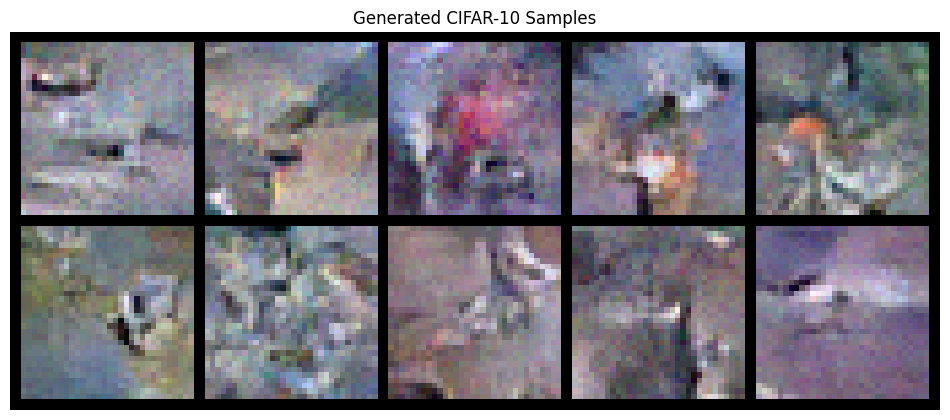

No improvement for 8/15 epochs


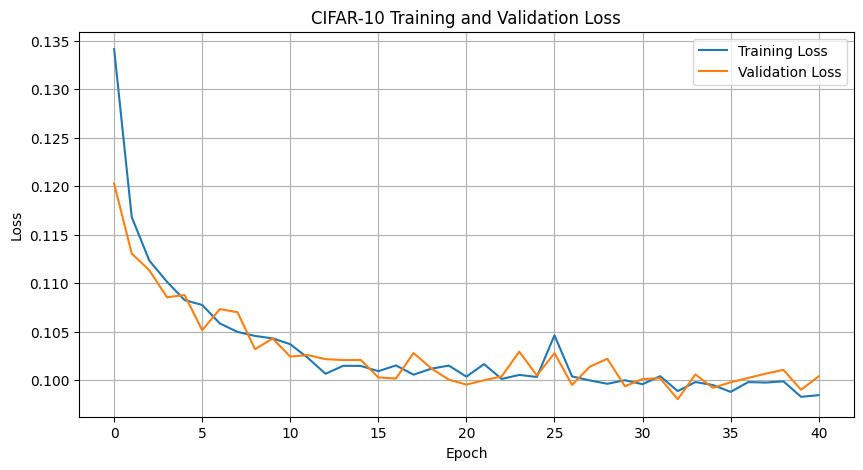


Epoch 42/50
--------------------
  Step 0/1250, Loss: 0.0876
  Step 50/1250, Loss: 0.0908
  Step 100/1250, Loss: 0.0800
  Step 150/1250, Loss: 0.0923
  Step 200/1250, Loss: 0.1131
  Generating samples...


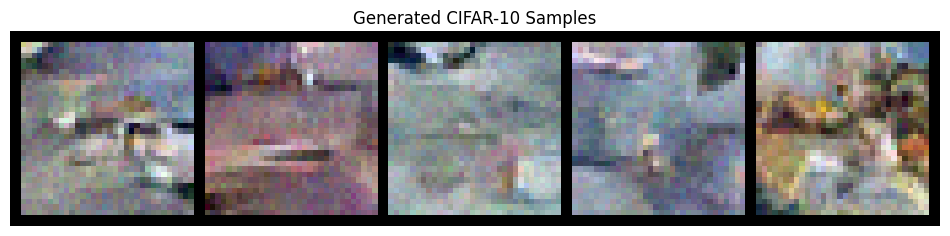

  Step 250/1250, Loss: 0.0896
  Step 300/1250, Loss: 0.0896
  Step 350/1250, Loss: 0.0774
  Step 400/1250, Loss: 0.1092
  Generating samples...


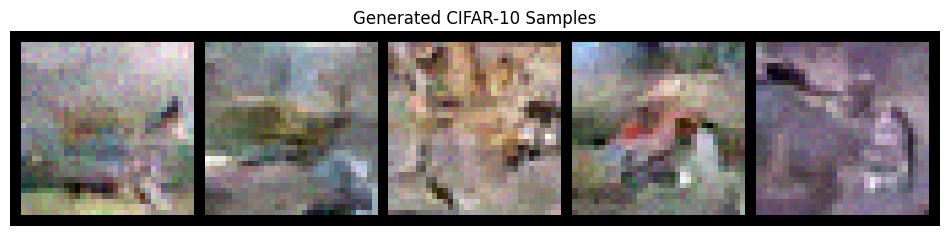

  Step 450/1250, Loss: 0.0919
  Step 500/1250, Loss: 0.1441
  Step 550/1250, Loss: 0.0960
  Step 600/1250, Loss: 0.1077
  Generating samples...


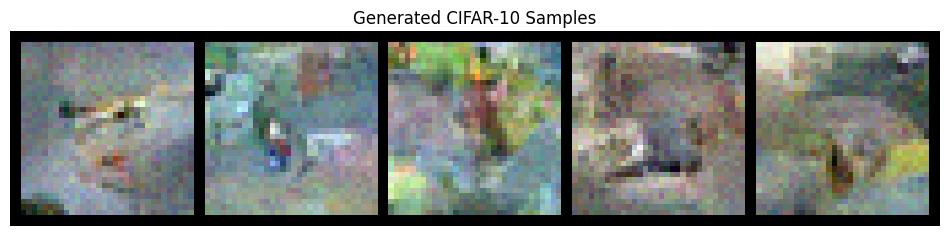

  Step 650/1250, Loss: 0.0943
  Step 700/1250, Loss: 0.0977
  Step 750/1250, Loss: 0.0922
  Step 800/1250, Loss: 0.0906
  Generating samples...


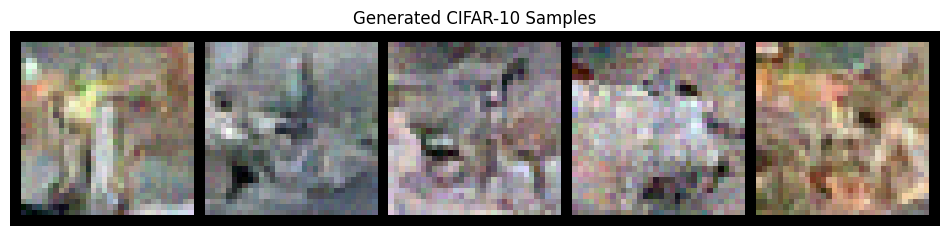

  Step 850/1250, Loss: 0.1113
  Step 900/1250, Loss: 0.0743
  Step 950/1250, Loss: 0.1128
  Step 1000/1250, Loss: 0.0644
  Generating samples...


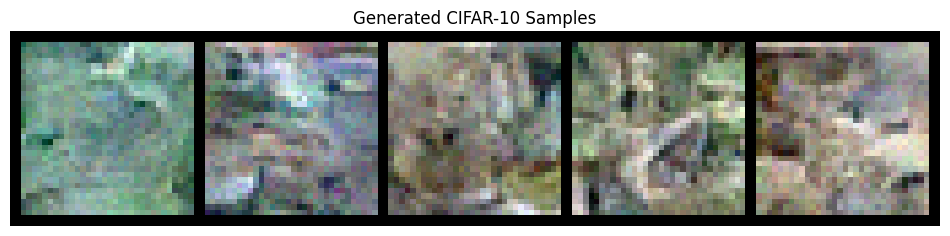

  Step 1050/1250, Loss: 0.0916
  Step 1100/1250, Loss: 0.0581
  Step 1150/1250, Loss: 0.0701
  Step 1200/1250, Loss: 0.0955
  Generating samples...


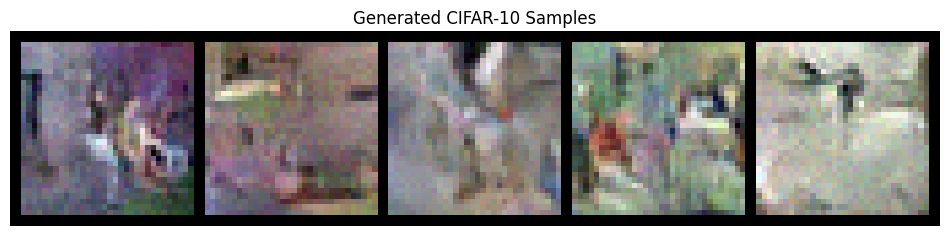


Training - Epoch 42 average loss: 0.0981
Running validation...
Validation - Epoch 42 average loss: 0.0979
Learning rate: 0.000500
Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.0979)

Epoch 43/50
--------------------
  Step 0/1250, Loss: 0.0799
  Step 50/1250, Loss: 0.1338
  Step 100/1250, Loss: 0.0935
  Step 150/1250, Loss: 0.0786
  Step 200/1250, Loss: 0.1089
  Generating samples...


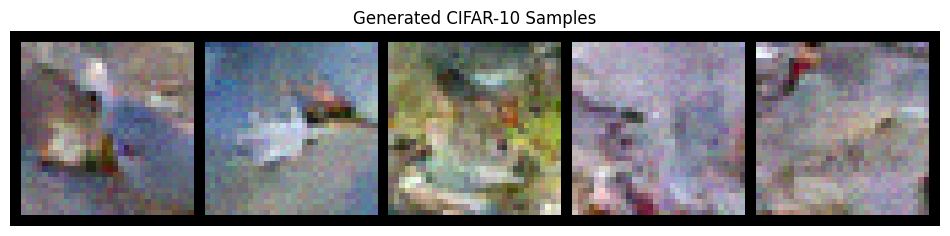

  Step 250/1250, Loss: 0.0995
  Step 300/1250, Loss: 0.1313
  Step 350/1250, Loss: 0.0759
  Step 400/1250, Loss: 0.0714
  Generating samples...


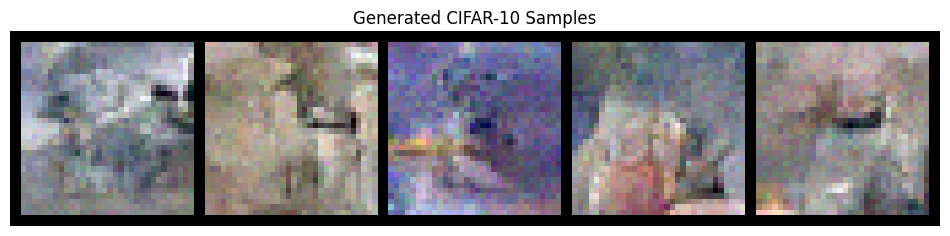

  Step 450/1250, Loss: 0.1070
  Step 500/1250, Loss: 0.1081
  Step 550/1250, Loss: 0.1123
  Step 600/1250, Loss: 0.0740
  Generating samples...


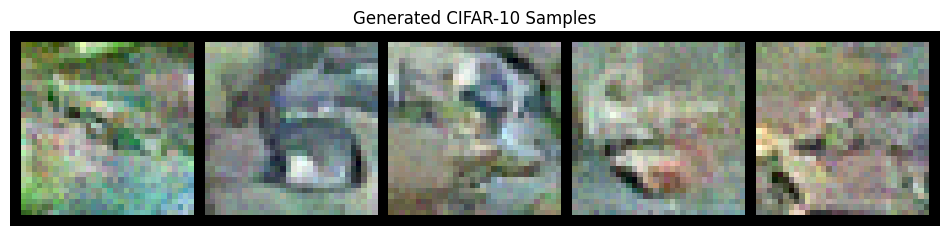

  Step 650/1250, Loss: 0.1039
  Step 700/1250, Loss: 0.0949
  Step 750/1250, Loss: 0.0935
  Step 800/1250, Loss: 0.0867
  Generating samples...


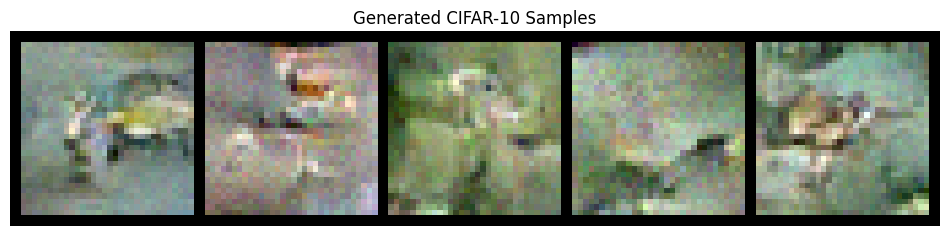

  Step 850/1250, Loss: 0.1190
  Step 900/1250, Loss: 0.0829
  Step 950/1250, Loss: 0.1083
  Step 1000/1250, Loss: 0.1342
  Generating samples...


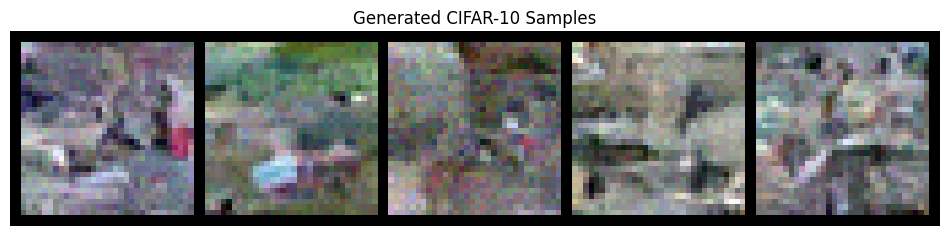

  Step 1050/1250, Loss: 0.0890
  Step 1100/1250, Loss: 0.0942
  Step 1150/1250, Loss: 0.1000
  Step 1200/1250, Loss: 0.1209
  Generating samples...


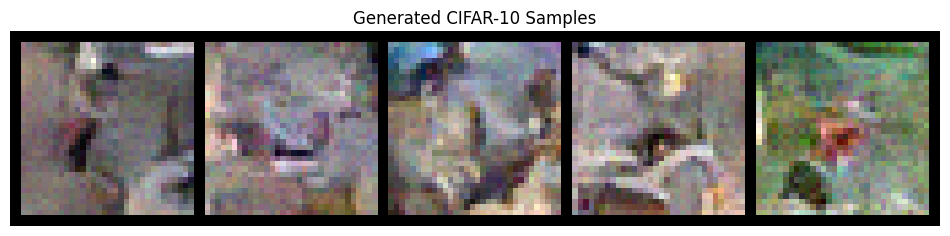


Training - Epoch 43 average loss: 0.0974
Running validation...
Validation - Epoch 43 average loss: 0.0979
Learning rate: 0.000500

Generating samples for visual progress check...


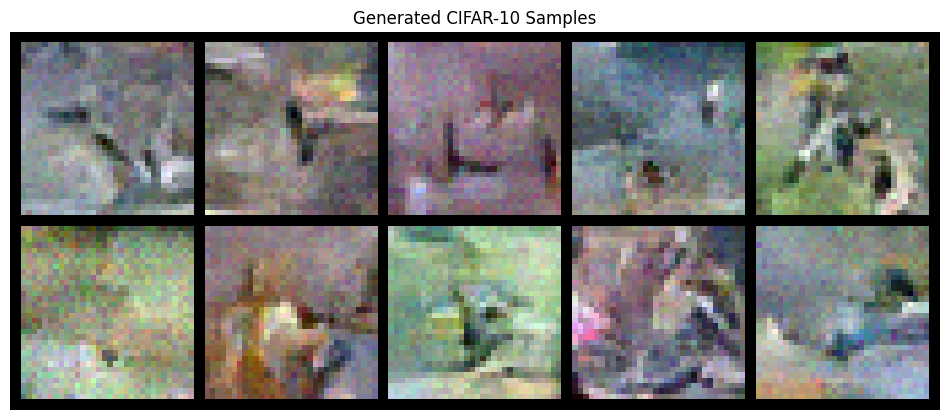

No improvement for 1/15 epochs

Epoch 44/50
--------------------
  Step 0/1250, Loss: 0.1144
  Step 50/1250, Loss: 0.0921
  Step 100/1250, Loss: 0.1178
  Step 150/1250, Loss: 0.0895
  Step 200/1250, Loss: 0.0985
  Generating samples...


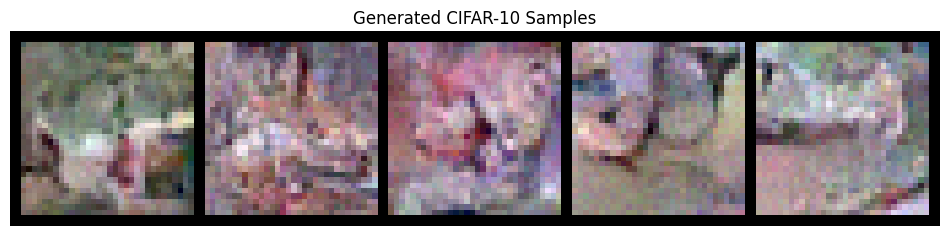

  Step 250/1250, Loss: 0.0940
  Step 300/1250, Loss: 0.1352
  Step 350/1250, Loss: 0.1067
  Step 400/1250, Loss: 0.1021
  Generating samples...


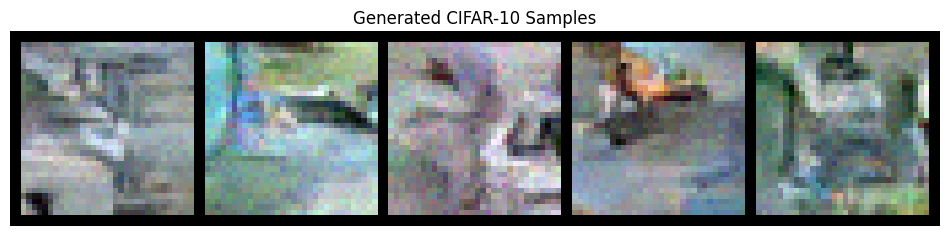

  Step 450/1250, Loss: 0.0812
  Step 500/1250, Loss: 0.1265
  Step 550/1250, Loss: 0.0939
  Step 600/1250, Loss: 0.1111
  Generating samples...


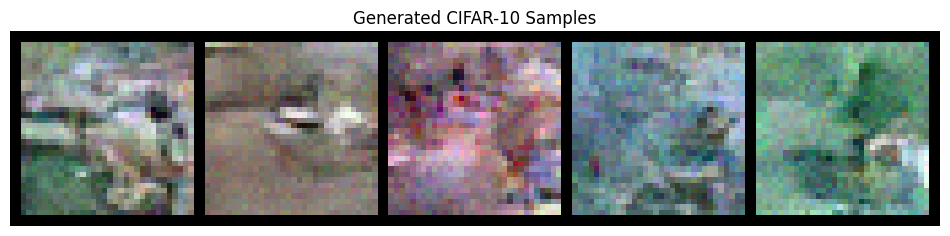

  Step 650/1250, Loss: 0.0972
  Step 700/1250, Loss: 0.1043
  Step 750/1250, Loss: 0.1126
  Step 800/1250, Loss: 0.1049
  Generating samples...


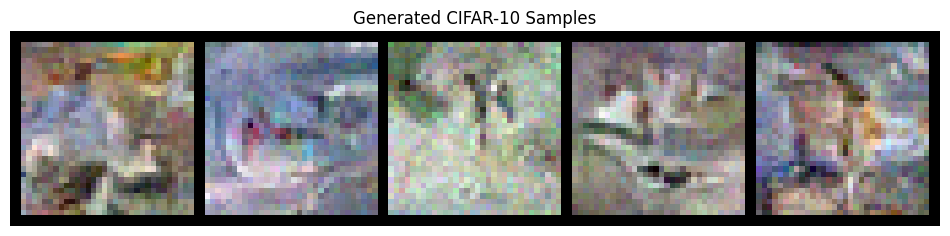

  Step 850/1250, Loss: 0.0683
  Step 900/1250, Loss: 0.1345
  Step 950/1250, Loss: 0.0845
  Step 1000/1250, Loss: 0.1100
  Generating samples...


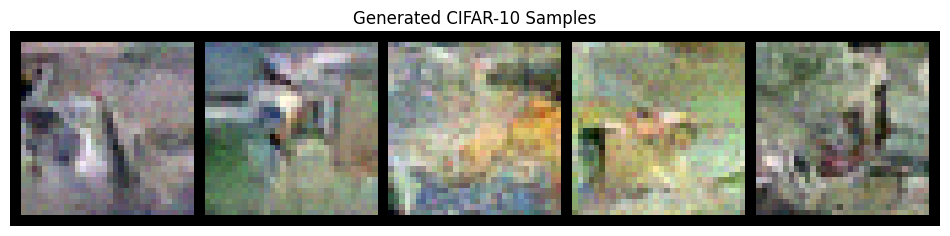

  Step 1050/1250, Loss: 0.1089
  Step 1100/1250, Loss: 0.0872
  Step 1150/1250, Loss: 0.1056
  Step 1200/1250, Loss: 0.1034
  Generating samples...


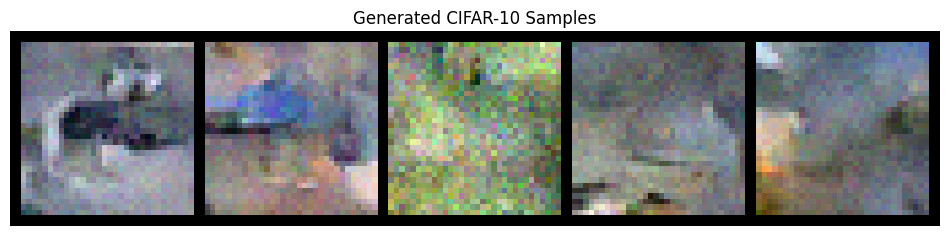


Training - Epoch 44 average loss: 0.0980
Running validation...
Validation - Epoch 44 average loss: 0.0992
Learning rate: 0.000500
No improvement for 2/15 epochs

Epoch 45/50
--------------------
  Step 0/1250, Loss: 0.1075
  Step 50/1250, Loss: 0.1053
  Step 100/1250, Loss: 0.1162
  Step 150/1250, Loss: 0.1254
  Step 200/1250, Loss: 0.0986
  Generating samples...


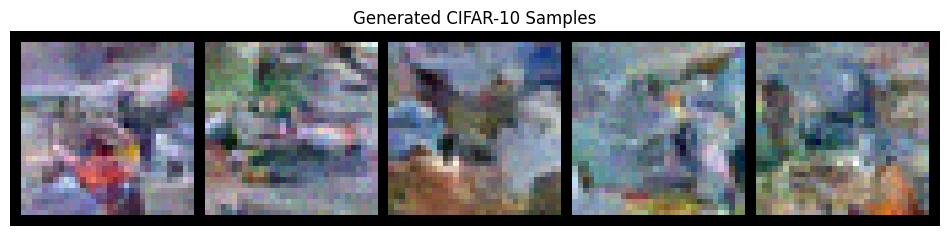

  Step 250/1250, Loss: 0.0780
  Step 300/1250, Loss: 0.1036
  Step 350/1250, Loss: 0.1219
  Step 400/1250, Loss: 0.0838
  Generating samples...


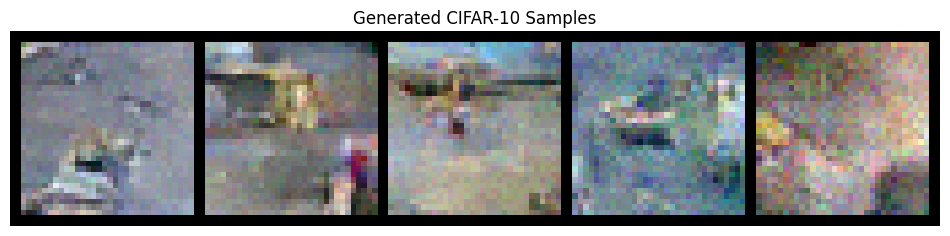

  Step 450/1250, Loss: 0.0739
  Step 500/1250, Loss: 0.0775
  Step 550/1250, Loss: 0.1026
  Step 600/1250, Loss: 0.1133
  Generating samples...


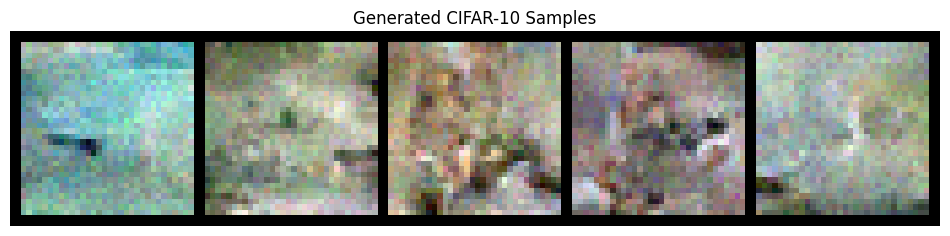

  Step 650/1250, Loss: 0.1138
  Step 700/1250, Loss: 0.1236
  Step 750/1250, Loss: 0.1096
  Step 800/1250, Loss: 0.0975
  Generating samples...


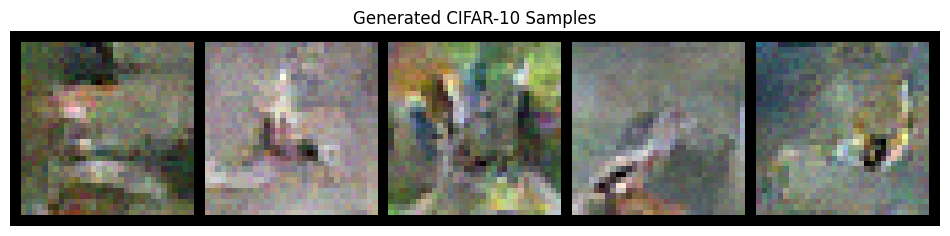

  Step 850/1250, Loss: 0.0974
  Step 900/1250, Loss: 0.0901
  Step 950/1250, Loss: 0.0710
  Step 1000/1250, Loss: 0.0632
  Generating samples...


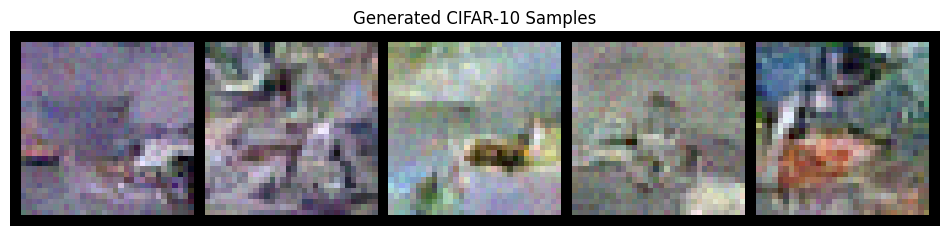

  Step 1050/1250, Loss: 0.0753
  Step 1100/1250, Loss: 0.1147
  Step 1150/1250, Loss: 0.0793
  Step 1200/1250, Loss: 0.0796
  Generating samples...


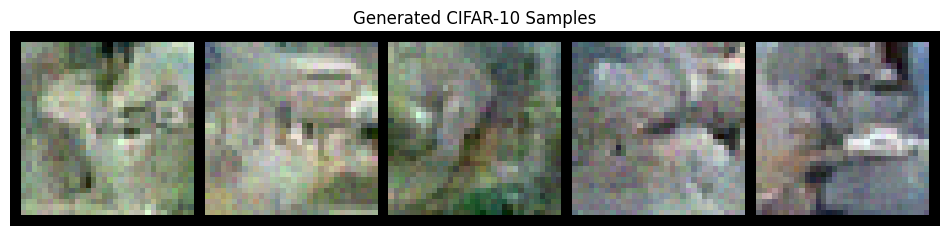


Training - Epoch 45 average loss: 0.0977
Running validation...
Validation - Epoch 45 average loss: 0.0985
Learning rate: 0.000500

Generating samples for visual progress check...


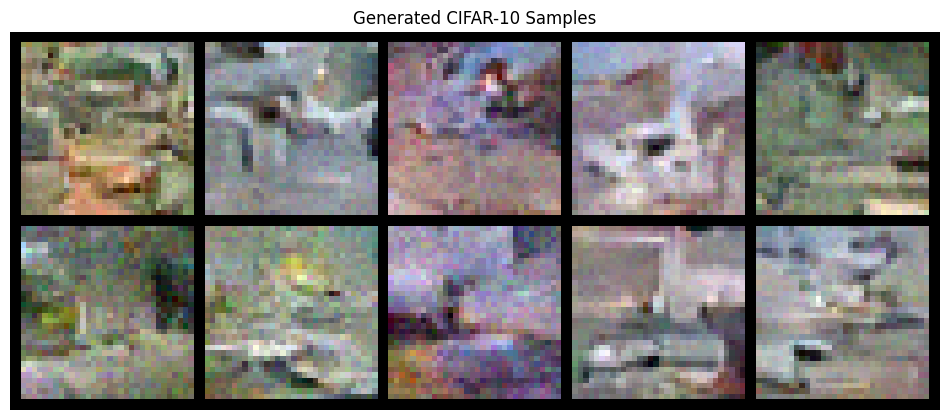

No improvement for 3/15 epochs

Epoch 46/50
--------------------
  Step 0/1250, Loss: 0.1092
  Step 50/1250, Loss: 0.0899
  Step 100/1250, Loss: 0.0689
  Step 150/1250, Loss: 0.1141
  Step 200/1250, Loss: 0.0791
  Generating samples...


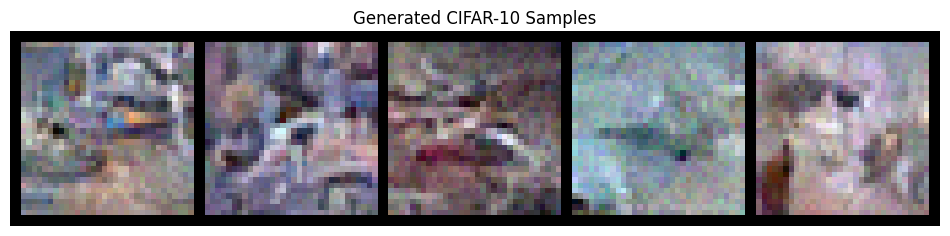

  Step 250/1250, Loss: 0.1092
  Step 300/1250, Loss: 0.1066
  Step 350/1250, Loss: 0.0999
  Step 400/1250, Loss: 0.0841
  Generating samples...


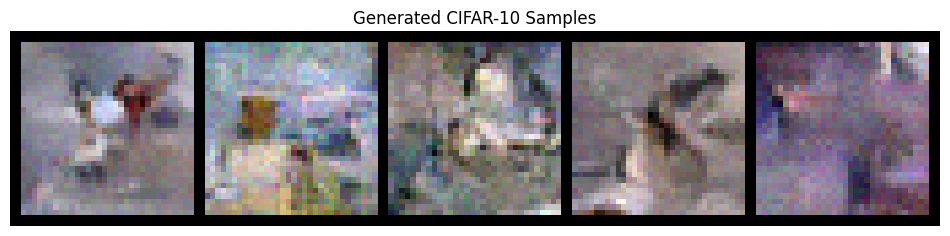

  Step 450/1250, Loss: 0.0836
  Step 500/1250, Loss: 0.1166
  Step 550/1250, Loss: 0.0972
  Step 600/1250, Loss: 0.0909
  Generating samples...


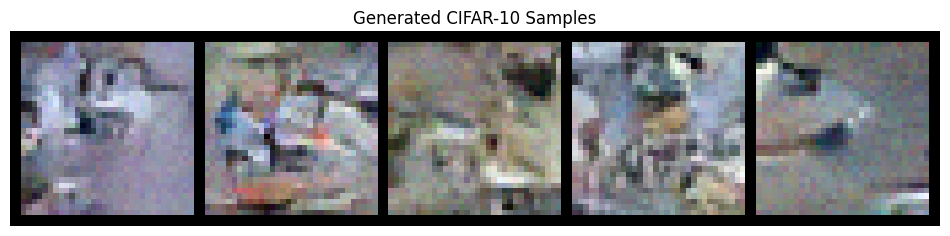

  Step 650/1250, Loss: 0.0799
  Step 700/1250, Loss: 0.0980
  Step 750/1250, Loss: 0.0688
  Step 800/1250, Loss: 0.0990
  Generating samples...


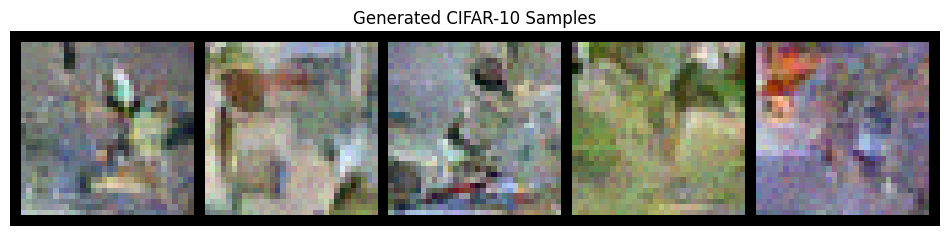

  Step 850/1250, Loss: 0.0889
  Step 900/1250, Loss: 0.1323
  Step 950/1250, Loss: 0.0707
  Step 1000/1250, Loss: 0.1030
  Generating samples...


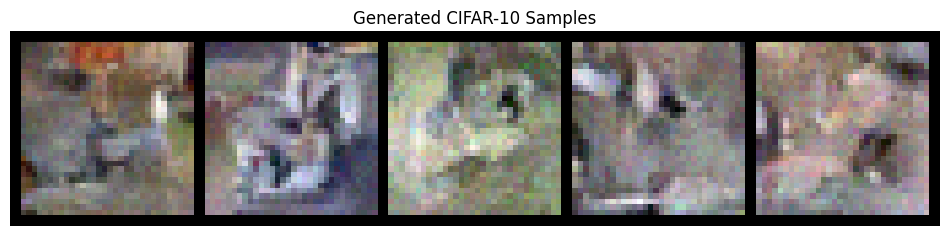

  Step 1050/1250, Loss: 0.0736
  Step 1100/1250, Loss: 0.0775
  Step 1150/1250, Loss: 0.1138
  Step 1200/1250, Loss: 0.0768
  Generating samples...


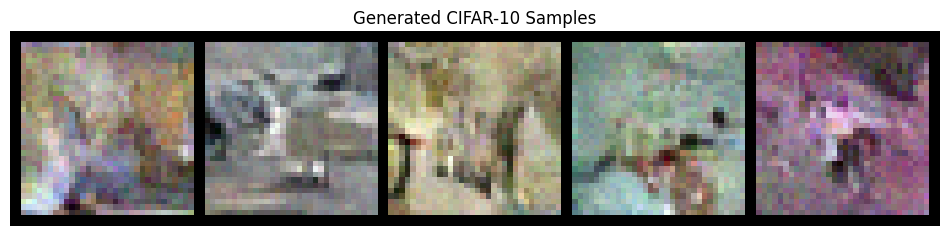


Training - Epoch 46 average loss: 0.0981
Running validation...
Validation - Epoch 46 average loss: 0.1001
Learning rate: 0.000500
No improvement for 4/15 epochs


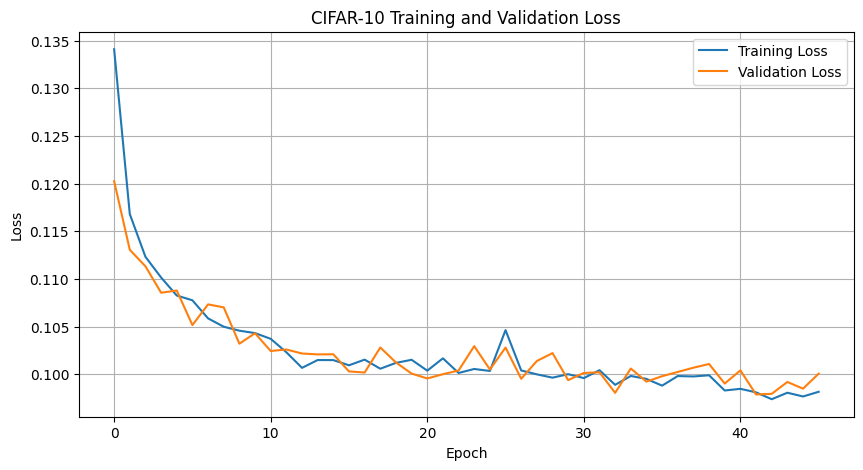


Epoch 47/50
--------------------
  Step 0/1250, Loss: 0.0847
  Step 50/1250, Loss: 0.0972
  Step 100/1250, Loss: 0.1040
  Step 150/1250, Loss: 0.0997
  Step 200/1250, Loss: 0.0995
  Generating samples...


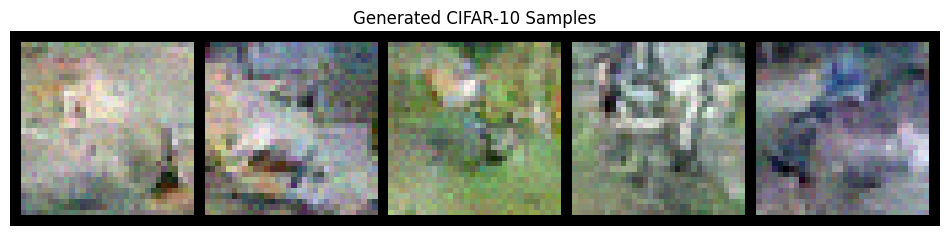

  Step 250/1250, Loss: 0.0980
  Step 300/1250, Loss: 0.0954
  Step 350/1250, Loss: 0.1100
  Step 400/1250, Loss: 0.0793
  Generating samples...


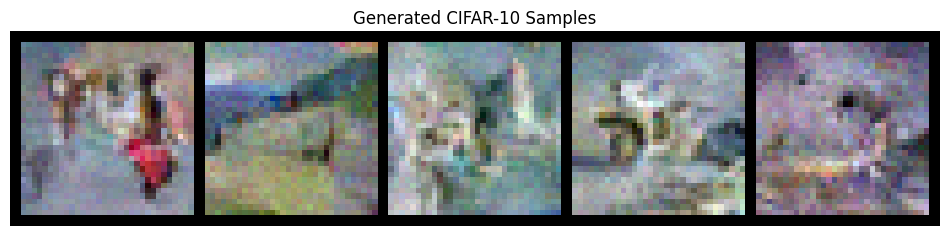

  Step 450/1250, Loss: 0.0899
  Step 500/1250, Loss: 0.0742
  Step 550/1250, Loss: 0.1005
  Step 600/1250, Loss: 0.0911
  Generating samples...


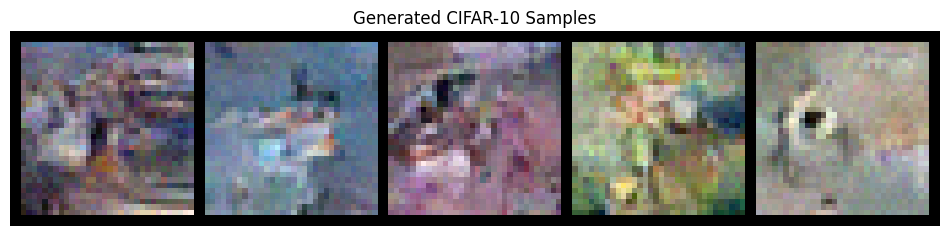

  Step 650/1250, Loss: 0.0868
  Step 700/1250, Loss: 0.1255
  Step 750/1250, Loss: 0.0653
  Step 800/1250, Loss: 0.0975
  Generating samples...


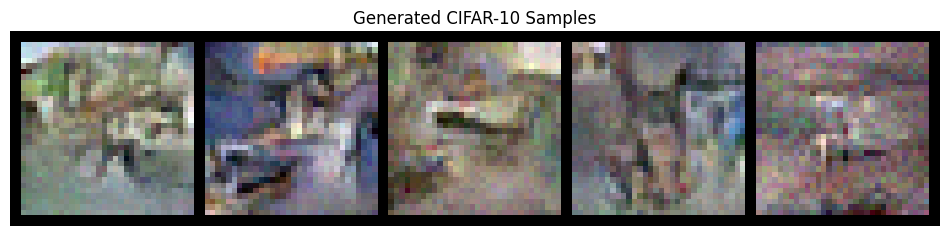

  Step 850/1250, Loss: 0.0936
  Step 900/1250, Loss: 0.1263
  Step 950/1250, Loss: 0.0665
  Step 1000/1250, Loss: 0.0673
  Generating samples...


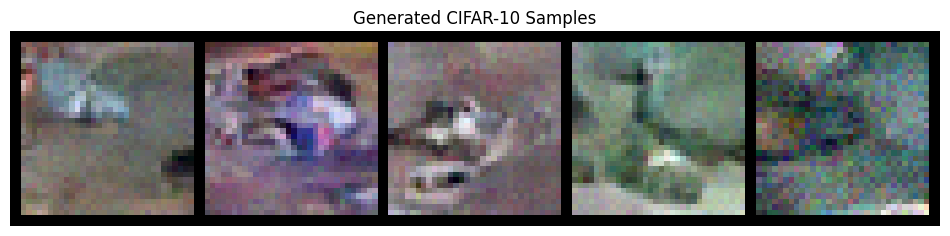

  Step 1050/1250, Loss: 0.1072
  Step 1100/1250, Loss: 0.1115
  Step 1150/1250, Loss: 0.0786
  Step 1200/1250, Loss: 0.0884
  Generating samples...


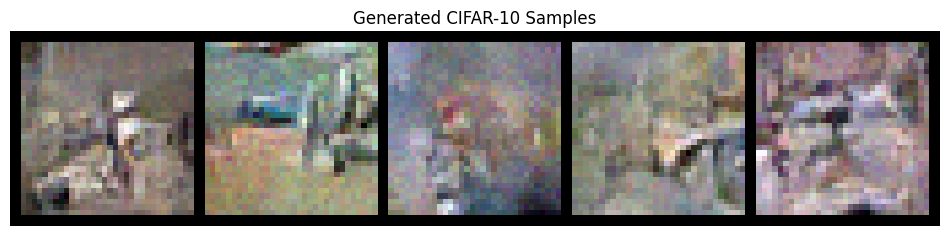


Training - Epoch 47 average loss: 0.0974
Running validation...
Validation - Epoch 47 average loss: 0.0999
Learning rate: 0.000500

Generating samples for visual progress check...


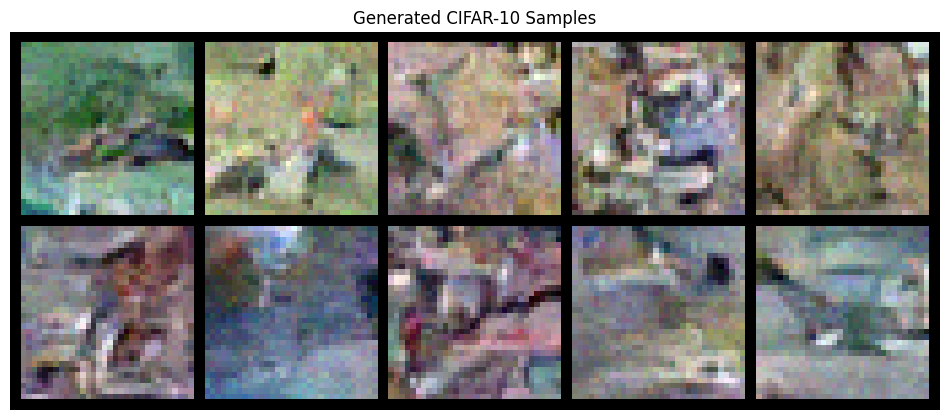

No improvement for 5/15 epochs

Epoch 48/50
--------------------
  Step 0/1250, Loss: 0.1337
  Step 50/1250, Loss: 0.0944
  Step 100/1250, Loss: 0.1326
  Step 150/1250, Loss: 0.0959
  Step 200/1250, Loss: 0.0931
  Generating samples...


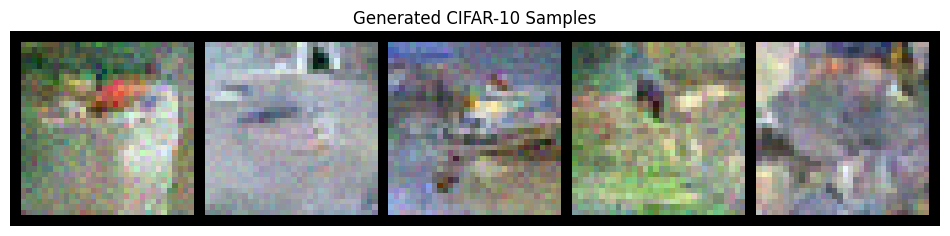

  Step 250/1250, Loss: 0.1188
  Step 300/1250, Loss: 0.1145
  Step 350/1250, Loss: 0.0843
  Step 400/1250, Loss: 0.0939
  Generating samples...


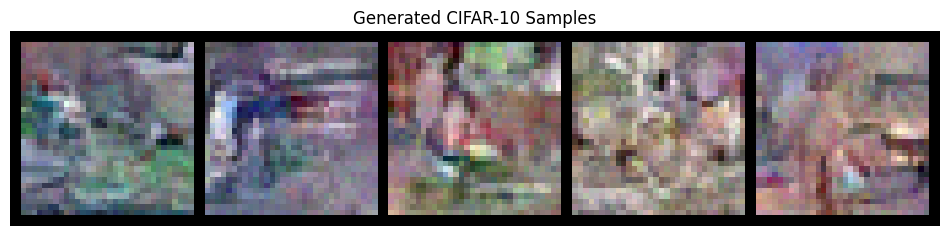

  Step 450/1250, Loss: 0.0760
  Step 500/1250, Loss: 0.0890
  Step 550/1250, Loss: 0.0772
  Step 600/1250, Loss: 0.0984
  Generating samples...


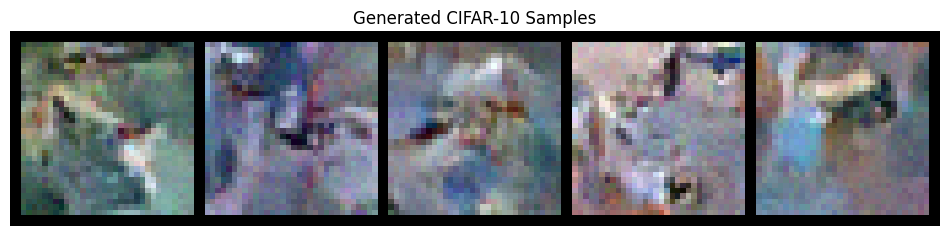

  Step 650/1250, Loss: 0.0686
  Step 700/1250, Loss: 0.0836
  Step 750/1250, Loss: 0.1067
  Step 800/1250, Loss: 0.1022
  Generating samples...


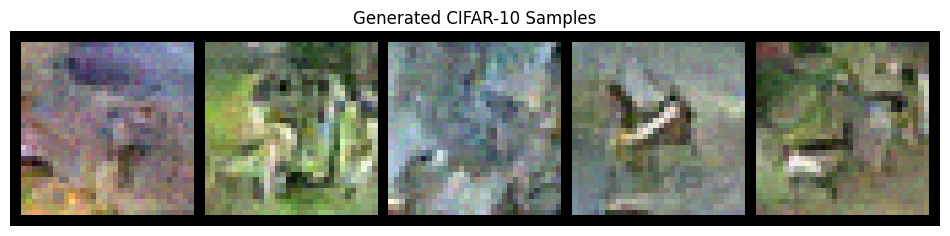

  Step 850/1250, Loss: 0.0754
  Step 900/1250, Loss: 0.1154
  Step 950/1250, Loss: 0.1636
  Step 1000/1250, Loss: 0.0933
  Generating samples...


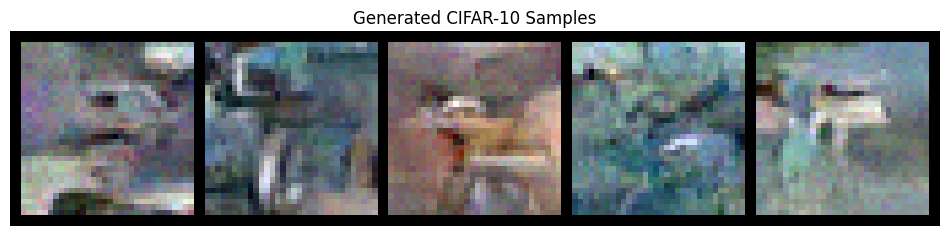

  Step 1050/1250, Loss: 0.0736
  Step 1100/1250, Loss: 0.1026
  Step 1150/1250, Loss: 0.0909
  Step 1200/1250, Loss: 0.1225
  Generating samples...


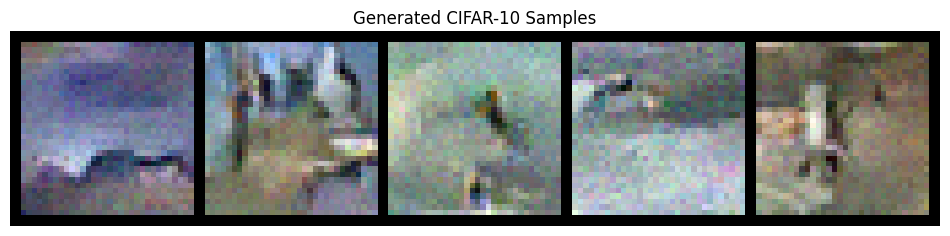


Training - Epoch 48 average loss: 0.0975
Running validation...
Validation - Epoch 48 average loss: 0.0978
Learning rate: 0.000500
Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.0978)

Epoch 49/50
--------------------
  Step 0/1250, Loss: 0.1142
  Step 50/1250, Loss: 0.0595
  Step 100/1250, Loss: 0.1105
  Step 150/1250, Loss: 0.1134
  Step 200/1250, Loss: 0.0695
  Generating samples...


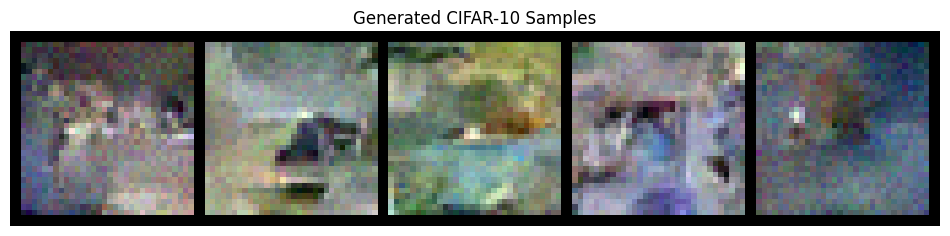

  Step 250/1250, Loss: 0.1186
  Step 300/1250, Loss: 0.0944
  Step 350/1250, Loss: 0.1067
  Step 400/1250, Loss: 0.0789
  Generating samples...


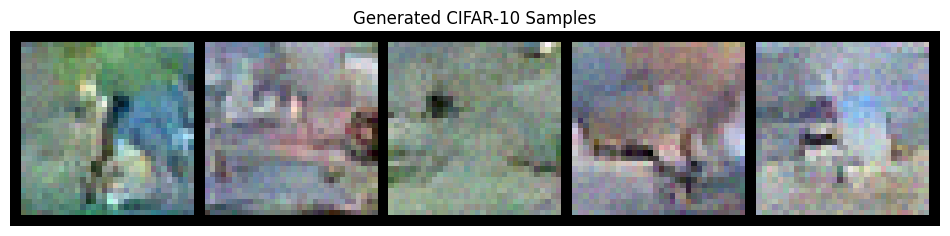

  Step 450/1250, Loss: 0.1163
  Step 500/1250, Loss: 0.1246
  Step 550/1250, Loss: 0.0758
  Step 600/1250, Loss: 0.0907
  Generating samples...


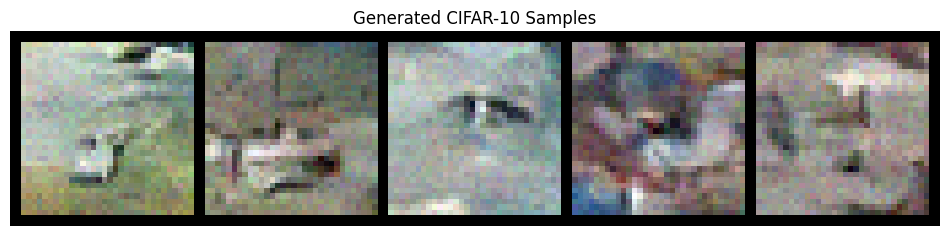

  Step 650/1250, Loss: 0.1069
  Step 700/1250, Loss: 0.1071
  Step 750/1250, Loss: 0.0962
  Step 800/1250, Loss: 0.0932
  Generating samples...


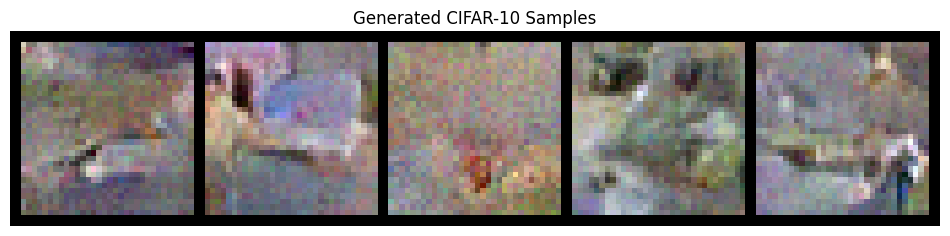

  Step 850/1250, Loss: 0.0776
  Step 900/1250, Loss: 0.0815
  Step 950/1250, Loss: 0.1188
  Step 1000/1250, Loss: 0.0852
  Generating samples...


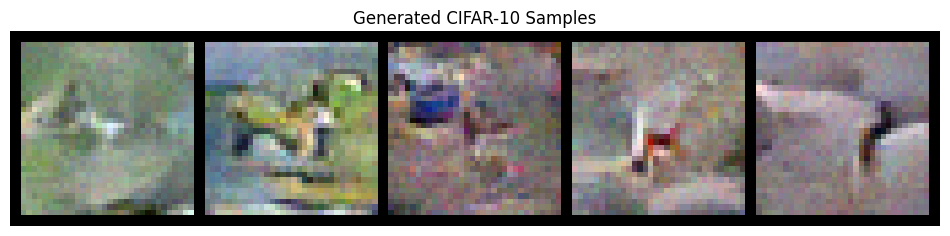

  Step 1050/1250, Loss: 0.0770
  Step 1100/1250, Loss: 0.0916
  Step 1150/1250, Loss: 0.1302
  Step 1200/1250, Loss: 0.0970
  Generating samples...


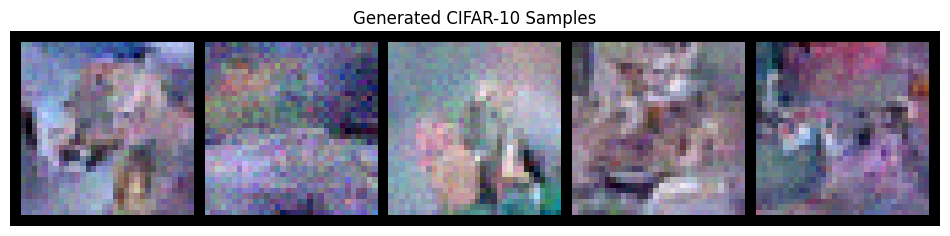


Training - Epoch 49 average loss: 0.0982
Running validation...
Validation - Epoch 49 average loss: 0.0974
Learning rate: 0.000500

Generating samples for visual progress check...


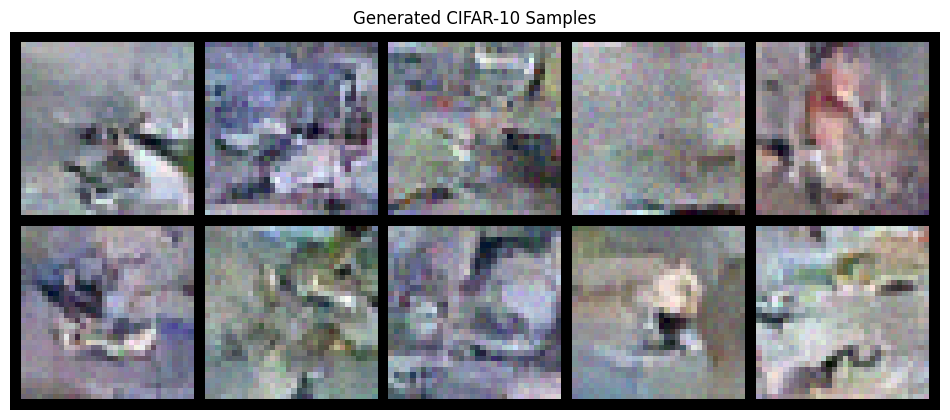

Created backup at best_cifar10_diffusion_model.pt.backup
Model successfully saved to best_cifar10_diffusion_model.pt
✓ New best model saved! (Val Loss: 0.0974)

Epoch 50/50
--------------------
  Step 0/1250, Loss: 0.0994
  Step 50/1250, Loss: 0.1149
  Step 100/1250, Loss: 0.1146
  Step 150/1250, Loss: 0.1232
  Step 200/1250, Loss: 0.1239
  Generating samples...


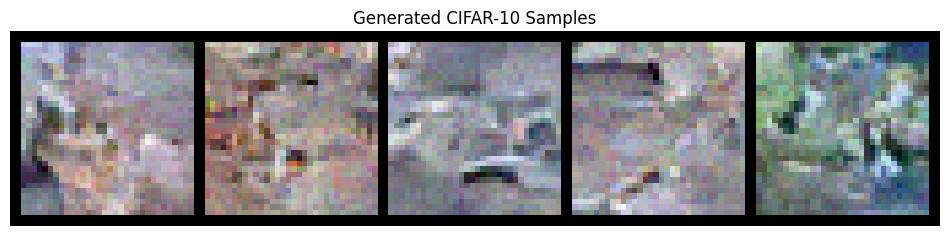

  Step 250/1250, Loss: 0.0958
  Step 300/1250, Loss: 0.0869
  Step 350/1250, Loss: 0.0776
  Step 400/1250, Loss: 0.1048
  Generating samples...


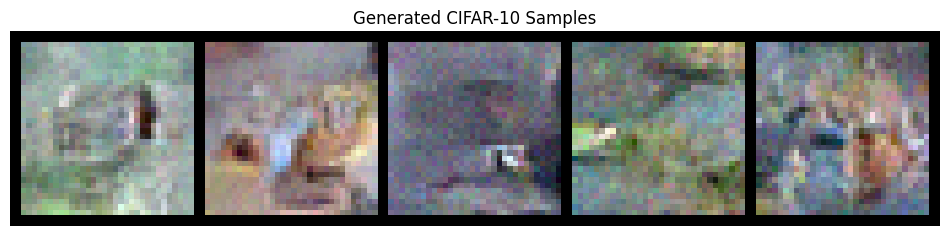

  Step 450/1250, Loss: 0.0919
  Step 500/1250, Loss: 0.0863
  Step 550/1250, Loss: 0.0993
  Step 600/1250, Loss: 0.0715
  Generating samples...


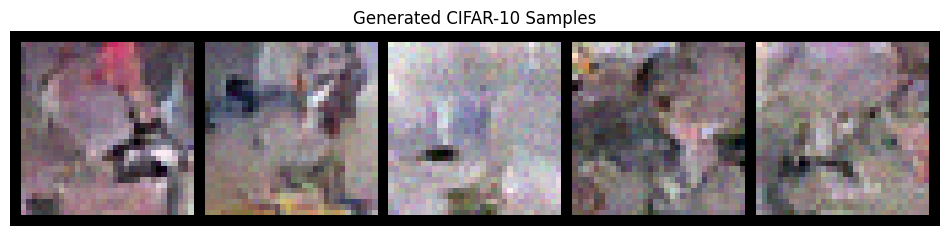

  Step 650/1250, Loss: 0.1083
  Step 700/1250, Loss: 0.1509
  Step 750/1250, Loss: 0.1030
  Step 800/1250, Loss: 0.0739
  Generating samples...


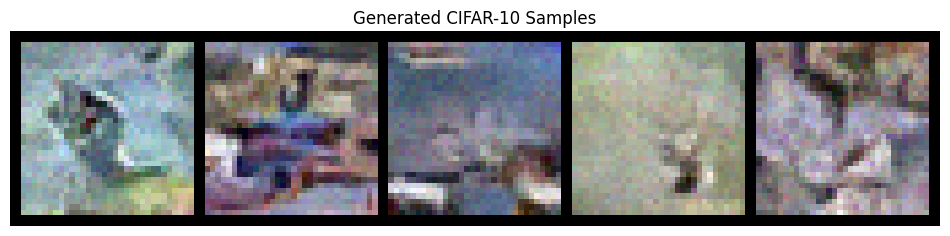

  Step 850/1250, Loss: 0.1032
  Step 900/1250, Loss: 0.0862
  Step 950/1250, Loss: 0.0801
  Step 1000/1250, Loss: 0.0973
  Generating samples...


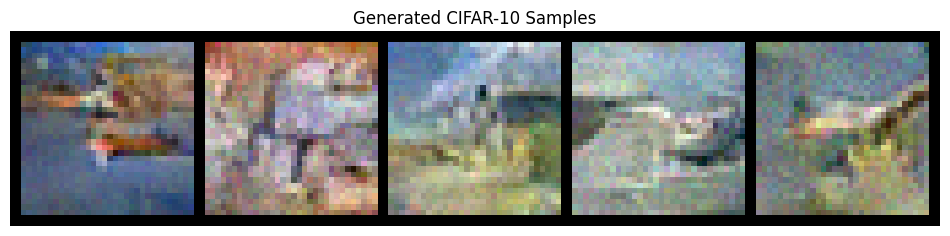

  Step 1050/1250, Loss: 0.1238
  Step 1100/1250, Loss: 0.0734
  Step 1150/1250, Loss: 0.0818
  Step 1200/1250, Loss: 0.1037
  Generating samples...


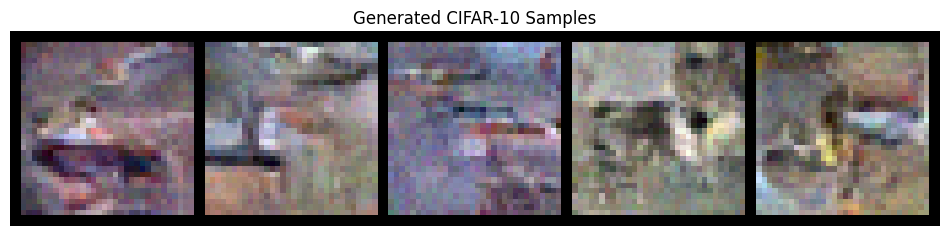


Training - Epoch 50 average loss: 0.0981
Running validation...
Validation - Epoch 50 average loss: 0.0980
Learning rate: 0.000500

Generating samples for visual progress check...


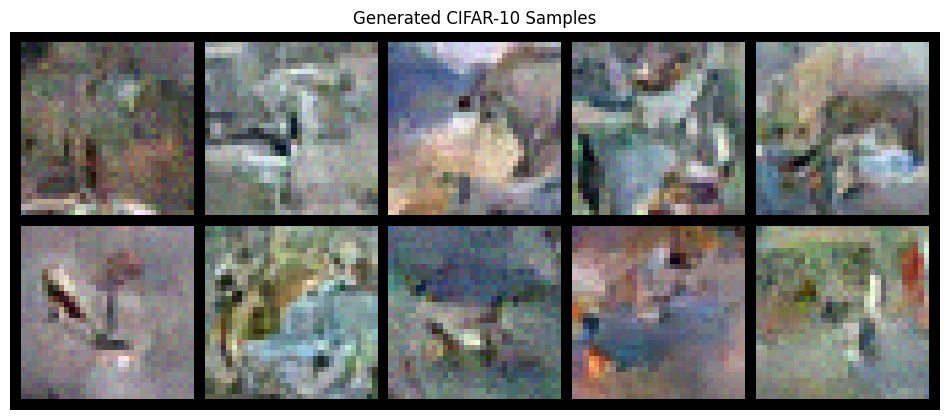

No improvement for 1/15 epochs


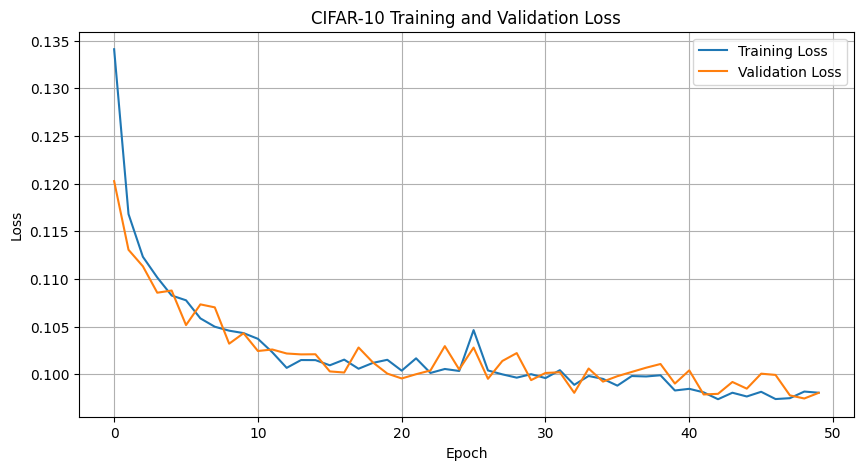


TRAINING COMPLETE
Best validation loss: 0.0974
Generating final samples...


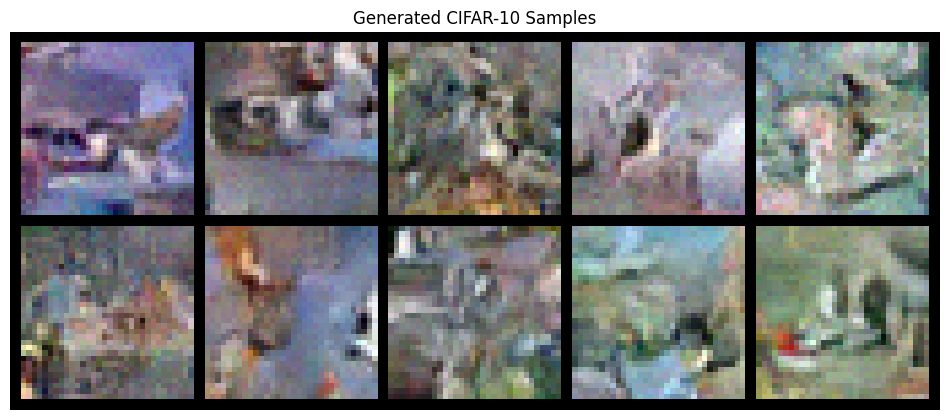

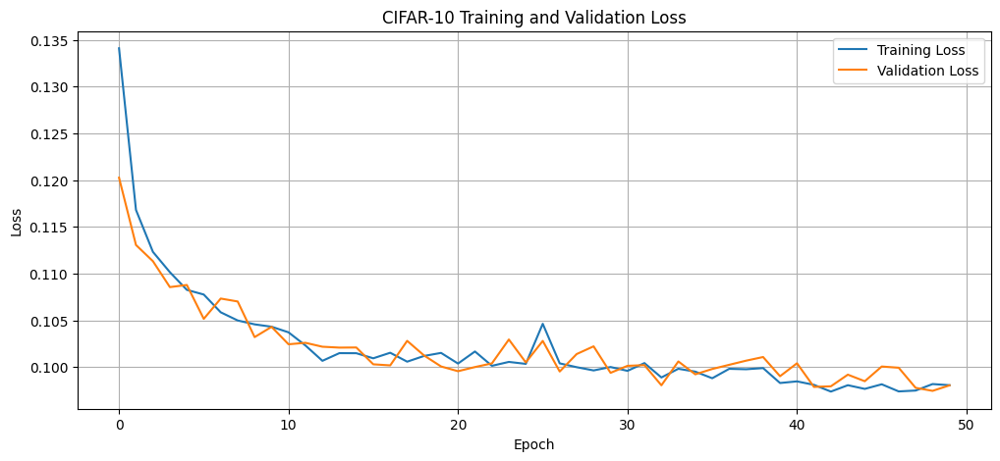

In [ ]:
# Implementation of the main training loop
# Training configuration for CIFAR-10
early_stopping_patience = 15  # More patience for complex dataset
gradient_clip_value = 1.0
display_frequency = 50       # More frequent display for longer training
generate_frequency = 200     # Less frequent generation to save time

# Progress tracking variables
best_loss = float('inf')
train_losses = []
val_losses = []
no_improve_epochs = 0

# Training loop
print("\n" + "="*50)
print("STARTING CIFAR-10 TRAINING")
print("="*50)

try:
    for epoch in range(EPOCHS):
        print(f"\nEpoch {epoch+1}/{EPOCHS}")
        print("-" * 20)

        # Training phase
        model.train()
        epoch_losses = []

        # Process each batch
        for step, (images, labels) in enumerate(train_dataloader):
            images = images.to(device)
            labels = labels.to(device)

            # Training step
            optimizer.zero_grad()
            loss = train_step(images, labels)
            loss.backward()

            # Add gradient clipping for stability
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=gradient_clip_value)

            optimizer.step()
            epoch_losses.append(loss.item())

            # Show progress at regular intervals
            if step % display_frequency == 0:
                print(f"  Step {step}/{len(train_dataloader)}, Loss: {loss.item():.4f}")

                # Generate samples less frequently to save time
                if step % generate_frequency == 0 and step > 0:
                    print("  Generating samples...")
                    generate_samples(model, n_samples=5)

        # End of epoch - calculate average training loss
        avg_train_loss = sum(epoch_losses) / len(epoch_losses)
        train_losses.append(avg_train_loss)
        print(f"\nTraining - Epoch {epoch+1} average loss: {avg_train_loss:.4f}")

        # Validation phase
        model.eval()
        val_epoch_losses = []
        print("Running validation...")

        with torch.no_grad():
            for val_images, val_labels in val_dataloader:
                val_images = val_images.to(device)
                val_labels = val_labels.to(device)

                # Calculate validation loss
                val_loss = train_step(val_images, val_labels)
                val_epoch_losses.append(val_loss.item())

        # Calculate average validation loss
        avg_val_loss = sum(val_epoch_losses) / len(val_epoch_losses)
        val_losses.append(avg_val_loss)
        print(f"Validation - Epoch {epoch+1} average loss: {avg_val_loss:.4f}")

        # Learning rate scheduling based on validation loss
        scheduler.step(avg_val_loss)
        current_lr = optimizer.param_groups[0]['lr']
        print(f"Learning rate: {current_lr:.6f}")

        # Generate samples at the end of each epoch
        if epoch % 2 == 0 or epoch == EPOCHS - 1:
            print("\nGenerating samples for visual progress check...")
            generate_samples(model, n_samples=10)

        # Save best model based on validation loss
        if avg_val_loss < best_loss:
            best_loss = avg_val_loss
            safe_save_model(model, 'best_cifar10_diffusion_model.pt', optimizer, epoch, best_loss)
            print(f"✓ New best model saved! (Val Loss: {best_loss:.4f})")
            no_improve_epochs = 0
        else:
            no_improve_epochs += 1
            print(f"No improvement for {no_improve_epochs}/{early_stopping_patience} epochs")

        # Early stopping
        if no_improve_epochs >= early_stopping_patience:
            print("\nEarly stopping triggered! No improvement in validation loss.")
            break

        # Plot loss curves every few epochs
        if epoch % 5 == 0 or epoch == EPOCHS - 1:
            plt.figure(figsize=(10, 5))
            plt.plot(train_losses, label='Training Loss')
            plt.plot(val_losses, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('CIFAR-10 Training and Validation Loss')
            plt.legend()
            plt.grid(True)
            plt.show()

except Exception as e:
    print(f"Error during training: {e}")
    import traceback
    traceback.print_exc()

# Final wrap-up
print("\n" + "="*50)
print("TRAINING COMPLETE")
print("="*50)
print(f"Best validation loss: {best_loss:.4f}")

# Generate final samples
print("Generating final samples...")
generate_samples(model, n_samples=10)

# Display final loss curves
plt.figure(figsize=(12, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('CIFAR-10 Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

# Clean up memory
torch.cuda.empty_cache()

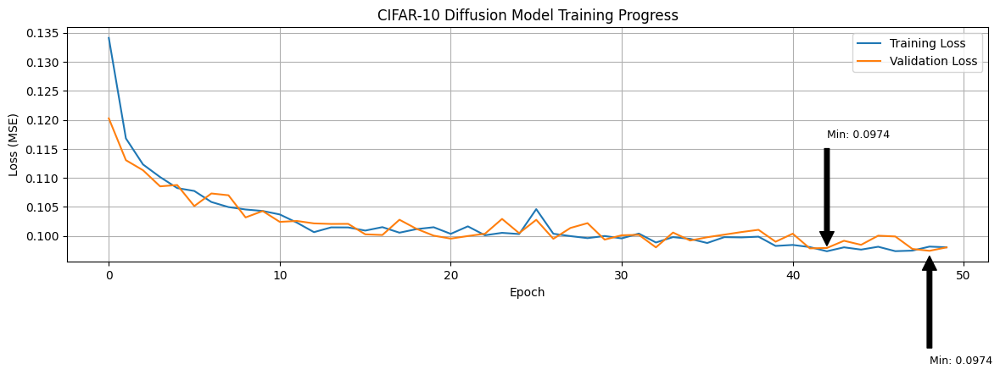


Training Statistics:
------------------------------
Starting training loss:    0.1341
Final training loss:       0.0981
Best training loss:        0.0974
Training loss improvement: 27.4%

Validation Statistics:
------------------------------
Starting validation loss: 0.1203
Final validation loss:    0.0980
Best validation loss:     0.0974


In [ ]:
# Plot training progress
plt.figure(figsize=(12, 5))

# Plot training and validation losses for comparison
plt.plot(train_losses, label='Training Loss')
if len(val_losses) > 0:
    plt.plot(val_losses, label='Validation Loss')

# Improve the plot with better labels and styling
plt.title('CIFAR-10 Diffusion Model Training Progress')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.grid(True)

# Add annotations for key points
if len(train_losses) > 1:
    min_train_idx = train_losses.index(min(train_losses))
    plt.annotate(f'Min: {min(train_losses):.4f}',
                 xy=(min_train_idx, min(train_losses)),
                 xytext=(min_train_idx, min(train_losses)*1.2),
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 fontsize=9)

# Add validation min point if available
if len(val_losses) > 1:
    min_val_idx = val_losses.index(min(val_losses))
    plt.annotate(f'Min: {min(val_losses):.4f}',
                xy=(min_val_idx, min(val_losses)),
                xytext=(min_val_idx, min(val_losses)*0.8),
                arrowprops=dict(facecolor='black', shrink=0.05),
                fontsize=9)

plt.tight_layout()
plt.show()

# Add statistics summary for students to analyze
print("\nTraining Statistics:")
print("-" * 30)
if train_losses:
    print(f"Starting training loss:    {train_losses[0]:.4f}")
    print(f"Final training loss:       {train_losses[-1]:.4f}")
    print(f"Best training loss:        {min(train_losses):.4f}")
    print(f"Training loss improvement: {((train_losses[0] - min(train_losses)) / train_losses[0] * 100):.1f}%")

if val_losses:
    print("\nValidation Statistics:")
    print("-" * 30)
    print(f"Starting validation loss: {val_losses[0]:.4f}")
    print(f"Final validation loss:    {val_losses[-1]:.4f}")
    print(f"Best validation loss:     {min(val_losses):.4f}")

## Step 6: Generating New CIFAR-10 Images

Now that our model is trained, let's generate some new CIFAR-10 images!

Generating 4 versions of airplane...
  Denoising step 19/99 completed
  Denoising step 39/99 completed
  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed
Generating 4 versions of automobile...
  Denoising step 19/99 completed
  Denoising step 39/99 completed
  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed
Generating 4 versions of bird...
  Denoising step 19/99 completed
  Denoising step 39/99 completed
  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed
Generating 4 versions of cat...
  Denoising step 19/99 completed
  Denoising step 39/99 completed


  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed
Generating 4 versions of deer...
  Denoising step 19/99 completed
  Denoising step 39/99 completed
  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed
Generating 4 versions of dog...
  Denoising step 19/99 completed
  Denoising step 39/99 completed
  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed
Generating 4 versions of frog...
  Denoising step 19/99 completed
  Denoising step 39/99 completed
  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed
Generating 4 versions of horse...
  Denoising step 19/99 completed
  Denoising step 39/99 completed
  Denoising step 59/99 completed


  Denoising step 79/99 completed
  Denoising step 99/99 completed
Generating 4 versions of ship...
  Denoising step 19/99 completed
  Denoising step 39/99 completed
  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed
Generating 4 versions of truck...
  Denoising step 19/99 completed
  Denoising step 39/99 completed
  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed


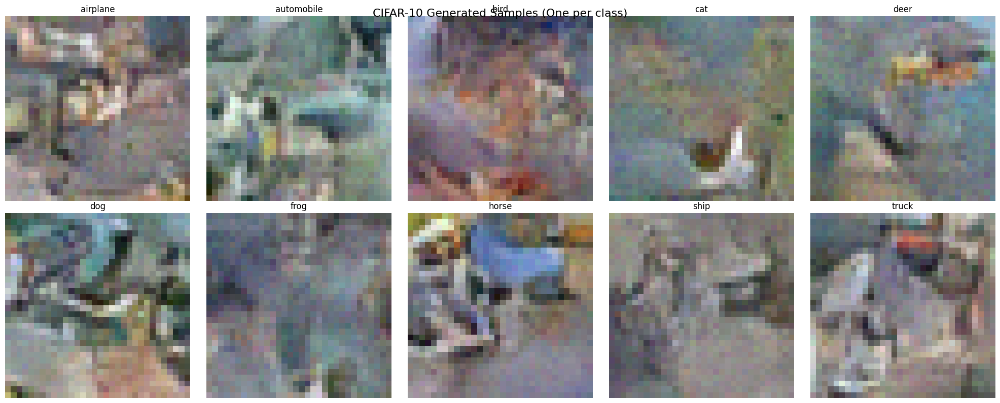


Generating multiple samples for specific classes:
Generating 6 versions of airplane...
  Denoising step 19/99 completed
  Denoising step 39/99 completed


  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed


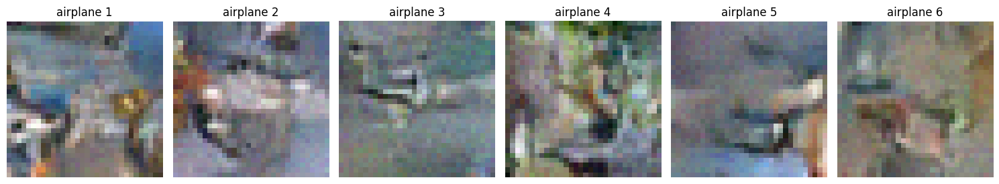

Generating 6 versions of automobile...
  Denoising step 19/99 completed
  Denoising step 39/99 completed


  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed


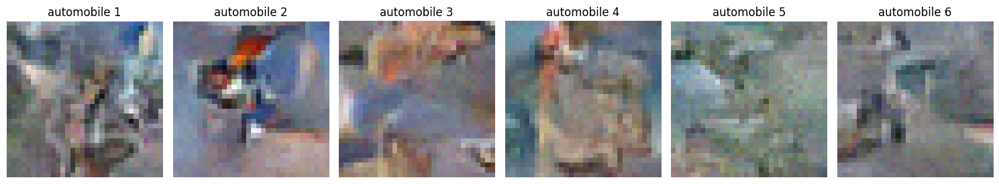

Generating 6 versions of bird...
  Denoising step 19/99 completed
  Denoising step 39/99 completed


  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed


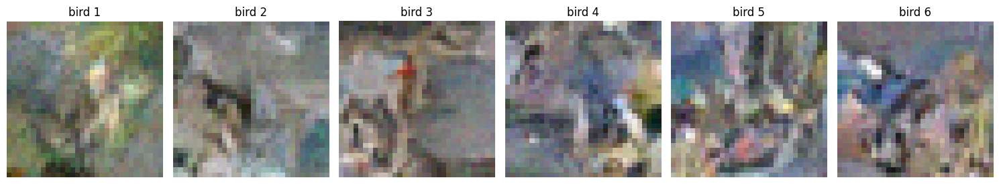

In [ ]:
def generate_number(model, number, n_samples=4):
    """
    Generate multiple versions of a specific CIFAR-10 class.
    """
    model.eval()
    with torch.no_grad():
        # Start with random noise
        samples = torch.randn(n_samples, IMG_CH, IMG_SIZE, IMG_SIZE).to(device)

        # Set up the class we want to generate
        c = torch.full((n_samples,), number).to(device)
        c_one_hot = F.one_hot(c, N_CLASSES).float().to(device)
        c_mask = torch.ones_like(c.unsqueeze(-1)).to(device)

        # Display progress information
        class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
        print(f"Generating {n_samples} versions of {class_names[number]}...")

        # Remove noise step by step
        for t in range(n_steps-1, -1, -1):
            t_batch = torch.full((n_samples,), t).to(device)
            samples = remove_noise(samples, t_batch, model, c_one_hot, c_mask)

            # Optional: Display occasional progress updates
            if t % (n_steps // 5) == 0:
                print(f"  Denoising step {n_steps-1-t}/{n_steps-1} completed")

        return samples

# Generate samples for all CIFAR-10 classes
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

plt.figure(figsize=(20, 8))
for i in range(10):
    # Generate samples for current class
    samples = generate_number(model, i, n_samples=4)

    # Display each sample
    for j in range(4):
        plt.subplot(2, 5, i+1)  # Show one class per subplot
        if j == 0:  # Only show one sample per class in this view
            img = samples[j].permute(1, 2, 0).cpu()
            img = (img + 1) / 2  # Denormalize from [-1,1] to [0,1]
            plt.imshow(img)
            plt.title(f'{class_names[i]}')
            plt.axis('off')
            break

plt.tight_layout()
plt.suptitle('CIFAR-10 Generated Samples (One per class)', fontsize=16)
plt.show()

# Show multiple samples for specific classes
print("\nGenerating multiple samples for specific classes:")
specific_classes = [0, 1, 2]  # airplane, automobile, bird
for class_id in specific_classes:
    samples = generate_number(model, class_id, n_samples=6)

    plt.figure(figsize=(15, 3))
    for j in range(6):
        plt.subplot(1, 6, j+1)
        img = samples[j].permute(1, 2, 0).cpu()
        img = (img + 1) / 2  # Denormalize
        plt.imshow(img)
        plt.title(f'{class_names[class_id]} {j+1}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


STUDENT ACTIVITY: Generating CIFAR-10 classes with different noise seeds
Generating 10 versions of automobile...
  Denoising step 19/99 completed
  Denoising step 39/99 completed


  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed


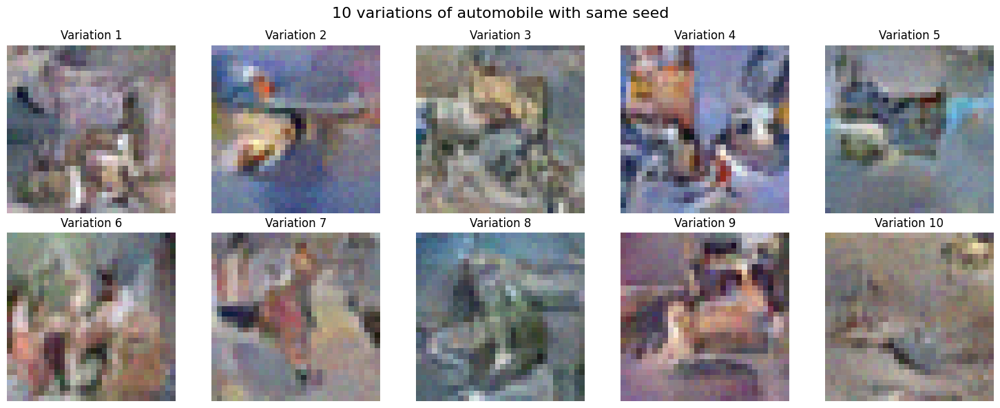

In [ ]:
# STUDENT ACTIVITY: Try generating the same class with different noise seeds
print("\nSTUDENT ACTIVITY: Generating CIFAR-10 classes with different noise seeds")

# Helper function to generate with seed
def generate_with_seed(class_id, seed_value=42, n_samples=10):
    torch.manual_seed(seed_value)
    return generate_number(model, class_id, n_samples)

# Pick a CIFAR-10 class and show many variations
class_id = 1  # automobile - change this to any class 0-9
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
variations = generate_with_seed(class_id, seed_value=42, n_samples=10)

# Display the variations
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    img = variations[i].permute(1, 2, 0).cpu()
    img = (img + 1) / 2  # Denormalize
    plt.imshow(img)
    plt.title(f'Variation {i+1}')
    plt.axis('off')
plt.suptitle(f'10 variations of {class_names[class_id]} with same seed', fontsize=16)
plt.tight_layout()
plt.show()

## Step 7: Watching the Generation Process

Let's see how our model turns random noise into clear CIFAR-10 images, step by step.


Generating airplane:


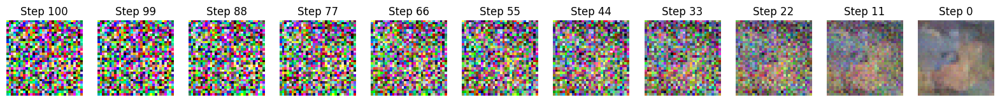


Generating automobile:


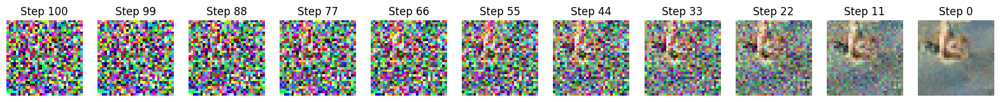


Generating bird:


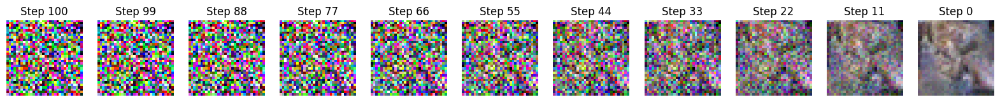

In [ ]:
def visualize_generation_steps(model, number, n_preview_steps=10):
    """
    Show how an image evolves from noise to a clear CIFAR-10 object
    """
    model.eval()
    with torch.no_grad():
        # Start with random noise
        x = torch.randn(1, IMG_CH, IMG_SIZE, IMG_SIZE).to(device)

        # Set up which class to generate
        c = torch.tensor([number]).to(device)
        c_one_hot = F.one_hot(c, N_CLASSES).float().to(device)
        c_mask = torch.ones_like(c_one_hot).to(device)

        # Calculate which steps to show
        steps_to_show = torch.linspace(n_steps-1, 0, n_preview_steps).long()

        # Store images for visualization
        images = []
        images.append(x[0].cpu())

        # Remove noise step by step
        for t in range(n_steps-1, -1, -1):
            t_batch = torch.full((1,), t).to(device)
            x = remove_noise(x, t_batch, model, c_one_hot, c_mask)

            if t in steps_to_show:
                images.append(x[0].cpu())

        # Show the progression
        plt.figure(figsize=(20, 3))
        for i, img in enumerate(images):
            plt.subplot(1, len(images), i+1)
            img_display = img.permute(1, 2, 0)
            if img_display.min() < 0:
                img_display = (img_display + 1) / 2
            plt.imshow(img_display)
            step = n_steps if i == 0 else steps_to_show[i-1]
            plt.title(f'Step {step}')
            plt.axis('off')
        plt.show()

# Show generation process for a few classes
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
for number in [0, 1, 2]:
    print(f"\nGenerating {class_names[number]}:")
    visualize_generation_steps(model, number)

## Step 8: Adding CLIP Evaluation (Optional)

We'll use CLIP to evaluate how realistic our generated CIFAR-10 images are.

In [ ]:
# Step 8: Adding CLIP Evaluation
print("Setting up CLIP (Contrastive Language-Image Pre-training) model...")

# Track installation status
clip_available = False

try:
    # Install dependencies
    print("Installing CLIP dependencies...")
    !pip install -q ftfy regex tqdm

    # Install CLIP from GitHub
    print("Installing CLIP from GitHub repository...")
    !pip install -q git+https://github.com/openai/CLIP.git

    # Import and verify CLIP is working
    print("Importing CLIP...")
    import clip

    # Test that CLIP is functioning
    models = clip.available_models()
    print(f"✓ CLIP installation successful! Available models: {models}")
    clip_available = True

except ImportError:
    print("❌ Error importing CLIP. Installation might have failed.")
    print("Try manually running: !pip install git+https://github.com/openai/CLIP.git")

except Exception as e:
    print(f"❌ Error during CLIP setup: {e}")
    print("Some CLIP functionality may not work correctly.")

# Provide guidance based on installation result
if clip_available:
    print("\nCLIP is now available for evaluating your generated CIFAR-10 images!")
else:
    print("\nWARNING: CLIP installation failed. We'll skip the CLIP evaluation parts.")

# Import necessary libraries
import functools
import torch.nn.functional as F


Setting up CLIP (Contrastive Language-Image Pre-training) model...
Installing CLIP dependencies...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.0 MB/s eta 0:00:00
Installing CLIP from GitHub repository...
  Preparing metadata (setup.py) ... done
Importing CLIP...
✓ CLIP installation successful! Available models: ['RN50', 'RN101', 'RN50x4', 'RN50x16', 'RN50x64', 'ViT-B/32', 'ViT-B/16', 'ViT-L/14', 'ViT-L/14@336px']

CLIP is now available for evaluating your generated CIFAR-10 images!


100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 143MiB/s]


✓ Successfully loaded CLIP model: VisionTransformer

Generating and evaluating airplane...
Generating 4 versions of airplane...
  Denoising step 19/99 completed
  Denoising step 39/99 completed
  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed


/tmp/ipython-input-2140958092.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():


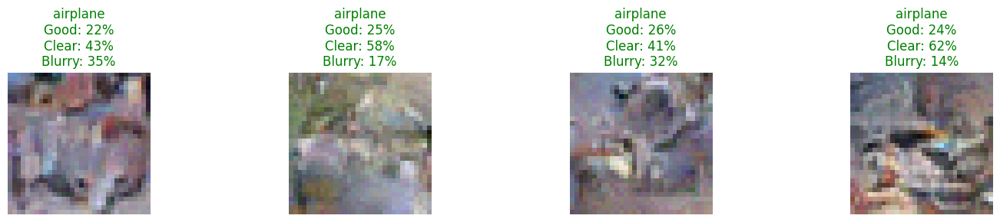


Generating and evaluating automobile...
Generating 4 versions of automobile...
  Denoising step 19/99 completed
  Denoising step 39/99 completed


  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed


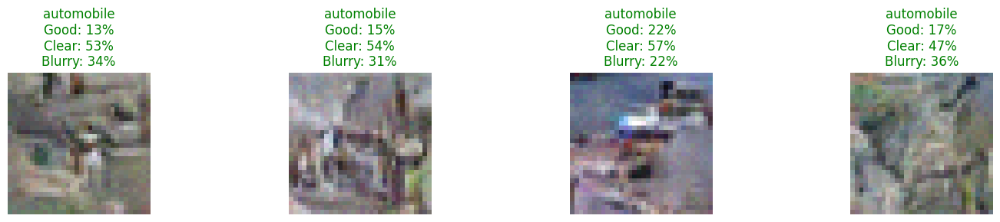


Generating and evaluating bird...
Generating 4 versions of bird...
  Denoising step 19/99 completed
  Denoising step 39/99 completed


  Denoising step 59/99 completed
  Denoising step 79/99 completed
  Denoising step 99/99 completed


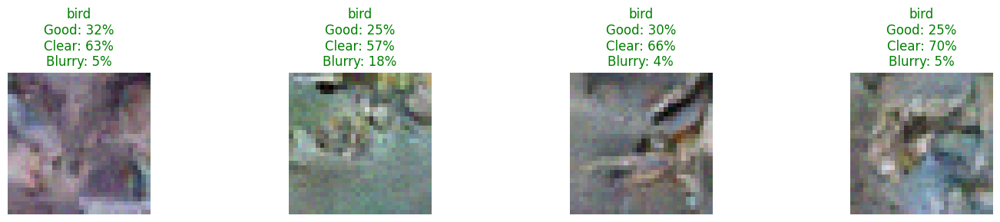

In [ ]:
# Load CLIP model with error handling
try:
    # Load the ViT-B/32 CLIP model
    clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)
    print(f"✓ Successfully loaded CLIP model: {clip_model.visual.__class__.__name__}")
except Exception as e:
    print(f"❌ Failed to load CLIP model: {e}")
    clip_available = False
    print("CLIP evaluation will be skipped. Generated images will still be displayed but without quality scores.")

def evaluate_with_clip(images, target_class, max_batch_size=8):
    """
    Use CLIP to evaluate generated CIFAR-10 images.
    """
    if not clip_available:
        print("⚠️ CLIP not available. Returning default scores.")
        return torch.ones(len(images), 3).to(device) / 3

    try:
        class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
        target_name = class_names[target_class]

        # Create text descriptions for CIFAR-10
        text_inputs = torch.cat([
            clip.tokenize(f"A photo of a {target_name}"),
            clip.tokenize(f"A clear photo of a {target_name}"),
            clip.tokenize(f"A blurry or unclear photo")
        ]).to(device)

        # Process images for CLIP
        if images.min() < 0:  # If normalized to [-1,1]
            images_rgb = (images + 1) / 2  # Convert to [0,1]
        else:
            images_rgb = images

        # Resize to CLIP's expected input size
        resized_images = F.interpolate(images_rgb, size=(224, 224), mode='bilinear', align_corners=False)

        with torch.no_grad(), torch.cuda.amp.autocast():
            image_features = clip_model.encode_image(resized_images)
            text_features = clip_model.encode_text(text_inputs)

            image_features = image_features / image_features.norm(dim=-1, keepdim=True)
            text_features = text_features / text_features.norm(dim=-1, keepdim=True)

            similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)

        return similarity

    except Exception as e:
        print(f"❌ Error in CLIP evaluation: {e}")
        return torch.ones(len(images), 3).to(device) / 3

# CLIP Evaluation - Generate and Analyze Sample Images
if clip_available:
    try:
        for number in range(3):  # Evaluate first 3 classes to save time
            print(f"\nGenerating and evaluating {class_names[number]}...")

            # Generate 4 different variations
            samples = generate_number(model, number, n_samples=4)

            # Evaluate quality with CLIP
            with torch.no_grad():
                similarities = evaluate_with_clip(samples, number)

            # Create a figure to display results
            plt.figure(figsize=(15, 3))

            # Show each sample with its CLIP quality scores
            for i in range(4):
                plt.subplot(1, 4, i+1)

                # Display the image
                img = samples[i].permute(1, 2, 0).cpu()
                img = (img + 1) / 2  # Denormalize
                plt.imshow(img)

                # Extract individual quality scores
                good_score = similarities[i][0].item() * 100
                clear_score = similarities[i][1].item() * 100
                blur_score = similarities[i][2].item() * 100

                # Color-code the title based on highest score category
                max_score_idx = torch.argmax(similarities[i]).item()
                title_color = 'green' if max_score_idx < 2 else 'red'

                # Show scores in the plot title
                plt.title(f'{class_names[number]}\nGood: {good_score:.0f}%\nClear: {clear_score:.0f}%\nBlurry: {blur_score:.0f}%',
                          color=title_color)
                plt.axis('off')

            plt.tight_layout()
            plt.show()

            # Clean up GPU memory
            torch.cuda.empty_cache()

    except Exception as e:
        print(f"❌ Error in CLIP evaluation loop: {e}")
else:
    print("\nSkipping CLIP evaluation as it's not available.")

## Assessment Questions

Now that you've completed the exercise, answer these questions:

### 1. Understanding Diffusion
- Explain what happens during the forward diffusion process, using your
own words and referencing the visualization examples from your
notebook.

During the forward diffusion process, the model takes a clean image and slowly
adds random noise to it over many small steps until it turns into pure static (white
noise). Each step adds just a tiny bit of noise, not enough to destroy the image
right away.
- Why do we add noise gradually instead of all at once? How does this
affect the learning process?

It’s easier for the model to learn how to undo small amounts of noise than to
rebuild a fully destroyed image.

Gradual noise helps the model learn smooth, stable patterns instead of random
jumps.

Each step teaches the model a small “denoising” move, making the overall
learning easier and more accurate.

By breaking the process into small steps, the model can learn to reverse it — step
by step — to turn noise back into a realistic image. If noise were added all at once,
the model couldn’t learn what structure to recover.

- Look at the step-by-step visualization - at what point (approximately
what percentage through the denoising process) can you first recognize
the image? Does this vary by image?

While observing, the noise are being added, the image starts clear and slowly
fades into random dots. During the reverse (denoising) process, the image starts
as noise and becomes clearer over time. Usually, you can first recognize the image
after about 30–40% of the denoising steps are done. This point can change —
simple images appear earlier, while detailed ones take longer.


### 2. Model Architecture
- Why is the U-Net architecture particularly well-suited for diffusion
models? What advantages does it provide over simpler architectures?

U-Net is ideal because diffusion models need to remove noise while keeping spatial
details. U-Net combines two parts:

- A downsampling path that captures global structure (what the image
looks like overall).

- An upsampling path that rebuilds the image using those features.

This design lets the model understand both what the object is and where things are
located. It works better than simple CNNs that either lose fine detail (too much
pooling) or miss large-scale context (too shallow).
- What are skip connections and why are they important? Explain them in
relations to our model

Skip connections link matching layers in the downsampling and upsampling paths.
They copy feature maps from the encoder (early layers) directly to the decoder
(later layers). This helps the model:

- Keep fine details from the original image that might get lost during
downsampling.

- Rebuild textures and edges more accurately during denoising.

In the diffusion model, the skip connections allow the network to reuse low-level
spatial info from earlier steps when reconstructing less noisy images, making
results sharper and more stable.

- Describe in detail how our model is conditioned to generate specific
images. How does the class conditioning mechanism work?

The model is class-conditioned — it can generate images of specific classes. This
works by feeding class information into the model along with the noisy image and
timestep.

Common methods include:

- Embedding the class label into a vector, then adding it to the timestep
embedding or feature maps.

- This tells the model what type of image it should produce while it learns
to remove noise.

So during denoising, the U-Net uses both:

- The image features (from noisy input)

- The class embedding (target label) to predict the right clean image for
that class.

In short:

U-Net gives structure, skip connections preserve details, and class conditioning
tells the model what to draw.

### 3. Training Analysis
- What does the loss value tell of your model tell us?

In a diffusion model, the loss measures how well the model predicts the noise
added to an image at each timestep. A lower loss means the model is getting
better at estimating the noise — which means it’s learning how to clean the image
more accurately. If the loss is high, the model’s noise predictions are poor, and the
generated images will look blurry or distorted.
- How did the quality of your generated images change change
throughout the training process?

At the start, generated images look like random noise — the model hasn’t learned
any structure. As training continues, shapes and outlines begin to appear. Later,
fine details and clearer textures emerge. By the end, images look sharp and match
the correct class or target pattern. This gradual improvement reflects the model
learning to remove noise step by step more precisely.

- Why do we need the time embedding in diffusion models? How does it
help the model understand where it is in the denoising process?

Each diffusion step adds a different amount of noise, so the model must know how
noisy the input image is. The time embedding gives this information. It encodes the
timestep t (usually through a sinusoidal or learned embedding) and feeds it into
the network.

This helps the model:

- Know whether it’s dealing with a very noisy or a nearly clean image.

- Adjust its denoising strength accordingly.

Without time embeddings, the model would treat all noisy images the same and
fail to learn the gradual reverse process.

### 4. CLIP Evaluation
- What do the CLIP scores tell you about your generated images? Which
images got the highest and lowest quality scores?

CLIP scores measure how well an image matches a given text description (e.g., “a
picture of a cat”). In diffusion model evaluation, a higher CLIP score means the
generated image aligns well with the intended concept or label. A lower score
means the image either looks unrealistic or doesn’t fit the target class well.

In the notebook, the images that were clear, well-formed, and matched their label
(e.g., easy classes like “0” or “1” in MNIST) likely received the highest CLIP scores,
while noisy, distorted, or ambiguous ones (e.g., “8” or “9”) got lower scores.

- Develop a hypothesis explaining why certain images might be easier or
harder for the model to generate convincingly.

Simple shapes (like digits “1” or “0”) are easy — less detail, clear structure.

Complex or similar-looking classes (like “5” vs “6”) are harder — small differences
can confuse the model.

Training imbalance or class diversity also affects difficulty. If the dataset has more
examples of certain classes, the model learns them better.

Noise schedule and model capacity also influence how well details are
reconstructed.


- How could CLIP scores be used to improve the diffusion model's
generation process? Propose a specific technique.

CLIP can be used as a guidance signal during generation. One effective method is
CLIP-guided diffusion:

- During the denoising process, compute the CLIP similarity between the current
image and the target text embedding.

- Adjust the model’s gradient to increase the CLIP score, steering the image toward
better semantic alignment.

This acts like a feedback loop — CLIP helps the diffusion model refine its output so
it better matches the intended concept, improving both accuracy and realism.

### 5. Practical Applications
- How could this type of model be useful in the real world?

Diffusion models can generate or restore visual data in many fields:

Art and design: create realistic images, textures, or concept art from text prompts.

Medical imaging: denoise or reconstruct scans like MRI or CT.

Image restoration: remove noise, sharpen blurry photos, or fill in missing parts.

Data augmentation: create more training samples for machine learning tasks.
- What are the limitations of our current model?

Low resolution: trained on small images (like 28×28 or 32×32), not high-quality
outputs.

Limited conditioning: can only handle simple class labels, not complex text
prompts.

Slow generation: diffusion requires many reverse steps to produce one image.

Training cost: computationally heavy and sensitive to hyperparameters.

- If you were to continue developing this project, what three specific
improvements would you make and why?

Add better conditioning (e.g., text or image embeddings): would let the model
generate more diverse and meaningful images from prompts.

Use a more advanced architecture (e.g., attention layers or larger U-Net): improves
detail and global consistency in outputs.

Optimize sampling (e.g., DDIM or fewer-step schedulers): speeds up image
generation without losing quality.

These upgrades would make the model faster, more flexible, and capable of
producing higher-quality, realistic results.

### Bonus Challenge
1. If you were to continue developing this project, what three specific
improvements would you make and why?

Higher-capacity U-Net: Add attention blocks or deeper layers to improve fine detail
and global structure.

Better noise scheduler (e.g., cosine or learned β schedule): gives smoother noise
transitions, improving image sharpness and stability.

CLIP-based guidance: integrates semantic feedback, ensuring generated images
match the intended concept more closely.

2. Modify the U-Net architecture (e.g., add more layers, increase channel
dimensions) and train the model. How do these changes affect training
time and generation quality?

When you increase U-Net depth or channel width:

Training time: increases proportionally — more parameters mean slower epochs
and higher GPU memory use.

Generation quality: improves up to a point — sharper edges, clearer class
boundaries, but may overfit or produce noise artifacts if the model becomes too
large for the dataset.

Overall, deeper networks help capture more complex
patterns but require balancing capacity with available data and compute.

3. CLIP-Guided Selection: Generate 10 samples of each image, use CLIP to
evaluate them, and select the top 3 highest-quality examples of each.
Analyze patterns in what CLIP considers "high quality."

Generating 10 samples per class and ranking them by CLIP score helps identify
which outputs best match the class meaning. Observed pattern:

CLIP favors clean, centered, and high-contrast digits.

Ambiguous or distorted samples rank low even if visually detailed. This shows CLIP
measures semantic clarity more than pixel-level quality.

4. tyle Conditioning: Modify the conditioning mechanism to generate
multiple styles of the same digit (e.g., slanted, thick, thin). Document
your approach and results.

To create multiple styles of the same digit:

Add a style embedding input alongside the class embedding (e.g., “slanted,”
“thin,” “bold”).

Concatenate it with the timestep and class embeddings before feeding into the UNet.

Train with labeled style variations or synthetic augmentations.

- Result:

The model learns to generate stylistic variants while preserving the digit’s identity
— e.g., the same “3” written in different handwriting styles. This demonstrates
diffusion models can separate content (digit identity) from style (visual form) when
properly conditioned.

**Deliverables:**
1. A PDF copy of your notebook with
- Complete code, outputs, and generated images
- Include all experiment results, training plots, and generated
samples
- CLIP evaluation scores of ythe images you generated
- Answers and any interesting findings from the bonus
challenges